In [2]:
import os
import cv2
import random
import math
import numpy as np
import matplotlib.pyplot as plt
import glob

import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras import models

from keras.layers import *

from keras.preprocessing.image import ImageDataGenerator

Using TensorFlow backend.


# Data Loader


In [3]:
def get_data_loader(data_path = './AerialImageDataset',
                    labels_folder = 'gt',
                    images_folder = 'images',
                    roof_folder = 'roof',
                    batch_size=4):

    train_images_path = os.path.join(data_path, 'train', images_folder)
    train_labels_path = os.path.join(data_path, 'train', labels_folder)

    valid_images_path = train_images_path.replace('train', 'valid')
    valid_labels_path = train_labels_path.replace('train', 'valid')

    train_image_count = len(os.listdir(os.path.join(train_images_path, roof_folder)))
    train_label_count = len(os.listdir(os.path.join(train_labels_path, roof_folder)))

    valid_image_count = len(os.listdir(os.path.join(valid_images_path, roof_folder)))
    valid_label_count = len(os.listdir(os.path.join(valid_labels_path, roof_folder)))

    steps_per_epoch = train_image_count // batch_size
    validation_steps = valid_image_count // batch_size

    print(f'Image count :\t{train_image_count}\nLabel count :\t{2}\n')

    image_files = os.listdir(os.path.join(train_images_path, roof_folder))
    img_height, img_width, _ = cv2.imread(os.path.join(train_images_path, roof_folder, image_files[0])).shape # cv2.COLOR_BGR2RGB

    print(f'image height :\t{img_height} pixels')
    print(f'image width  :\t{img_width} pixels')
    
    def image_preprocessing(img):
        return img

    def mask_preprocessing(mask):
        return mask

    def combine_generator(gen1, gen2):
        while True:
            yield(next(gen1), next(gen2))

    image_datagen = ImageDataGenerator(
        rescale=1./255,
        preprocessing_function = image_preprocessing,
    )

    mask_datagen = ImageDataGenerator(
        rescale=1./255,
        preprocessing_function = mask_preprocessing,
    )

    train_image_generator = image_datagen.flow_from_directory(
        train_images_path,
        batch_size = batch_size,
        shuffle=False,
        target_size=(256, 256),
        class_mode = None,
        interpolation='nearest',
        seed=42,
    )

    train_mask_generator = mask_datagen.flow_from_directory(
        train_labels_path,
        batch_size = batch_size,
        shuffle=False,
        target_size=(256, 256),
        class_mode = None,
        interpolation='nearest',
        seed=42,
    )

    valid_image_generator = image_datagen.flow_from_directory(
        valid_images_path,
        batch_size = batch_size,
        shuffle=False,
        target_size=(256, 256),
        class_mode = None,
        interpolation='nearest',
        seed=42,
    )

    valid_mask_generator = mask_datagen.flow_from_directory(
        valid_labels_path,
        batch_size = batch_size,
        shuffle=False,
        target_size=(256, 256),
        class_mode = None,
        interpolation='nearest',
        seed=42,
    )

    train_generator = zip(train_image_generator, train_mask_generator)
    valid_generator = zip(valid_image_generator, valid_mask_generator)

    x_train, y_train = next(train_generator)
    print(np.shape(x_train[0]))
    print(np.shape(y_train[0]))

    return train_generator, valid_generator, steps_per_epoch, validation_steps

# ICT-Net model creation

In [4]:
IMG_SIZE = 256
N_CHANNELS = 3
eps=1e-5

def pre_activation_conv(inputs, n_filters, filter_size=(3, 3), dropout_rate=0.2):
    x = BatchNormalization(epsilon=eps)(inputs)
    x = ReLU()(x)
    x = Conv2D(n_filters, kernel_size=filter_size, padding='same', use_bias=False, kernel_initializer='he_normal')(x)
    x = Dropout(rate=dropout_rate)(x)
    return x

def squeeze_excitation_layer(inputs, output_dimension, ratio):
    squeeze = tf.reduce_mean(inputs, axis=[1, 2])

    units = output_dimension/ratio    
    excitation = layers.Dense(units, activation='relu')(squeeze)
    excitation = layers.Dense(output_dimension, activation='sigmoid')(excitation)
    excitation = tf.reshape(excitation, [-1, 1, 1, output_dimension])
    return inputs * excitation

def dense_block(inputs, num_layers, growth_rate, dropout_rate, path_type, out_dim):
    new_features = []
    for i in range(num_layers): # num_layers is the value of 'l'
        conv_outputs = pre_activation_conv(inputs, growth_rate, dropout_rate=dropout_rate)
        inputs = Concatenate()([inputs, conv_outputs])
        new_features.append(conv_outputs)
    new_features = Concatenate()(new_features)

    # Special block for SE
    if path_type == "down":
        inputs = squeeze_excitation_layer(inputs, out_dim, 1)
    else:
        new_features = squeeze_excitation_layer(new_features, out_dim, 1)

    return inputs, new_features

def TransitionDown(inputs, n_filters, dropout_rate):
    x = pre_activation_conv(inputs, n_filters, (1, 1), dropout_rate)
    x = MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(x)
    return x


def TransitionUp(inputs, n_filters, skip_connection):
    x = Conv2DTranspose(n_filters, kernel_size=(3, 3), padding='same', strides=(2, 2))(inputs)
    x = Concatenate()([x, skip_connection])
    return x


def build_model(preset_model='FC-DenseNet103', num_classes=3, n_filters_first_conv=48, n_pool=5, growth_rate=12, n_layers_per_block=4, dropout_rate=0.2, summary=True):
    if preset_model == 'FC-DenseNet56':
        n_pool = 5
        growth_rate = 12
        n_layers_per_block = 4
    elif preset_model == 'FC-DenseNet67':
        n_pool = 5
        growth_rate = 16
        n_layers_per_block = 5
    elif preset_model == 'FC-DenseNet103':
        n_pool = 5
        growth_rate = 16
        n_layers_per_block = [4, 5, 7, 10, 12, 15, 12, 10, 7, 5, 4]

    if type(n_layers_per_block) == int:
        n_layers_per_block = [n_layers_per_block] * (2 * n_pool + 1)

    input_shape = (IMG_SIZE, IMG_SIZE, N_CHANNELS)
    # Downsampling path
    inputs = Input(shape=input_shape)
    x = Conv2D(n_filters_first_conv, kernel_size=(3, 3), padding='same', use_bias=False, kernel_initializer='he_normal',
               kernel_regularizer=keras.regularizers.l2(1e-4))(inputs)

    n_filters = n_filters_first_conv

    skip_connection_list = []

    for i in range(n_pool):
        n_filters += growth_rate * n_layers_per_block[i]
        # Dense Block
        x, _ = dense_block(x, n_layers_per_block[i], growth_rate, dropout_rate, "down", n_filters)

        # At the end of the dense block, the current stack is stored in the skip_connections list
        skip_connection_list.append(x)
        # Transition Down
        x = TransitionDown(x, n_filters, dropout_rate)

    skip_connection_list = skip_connection_list[::-1]  # Reverse

    # Bottleneck Dense Block
    out_dim = n_layers_per_block[n_pool] * growth_rate
    # We will only upsample the new feature maps
    x, block_to_upsample = dense_block(x, n_layers_per_block[n_pool], growth_rate, dropout_rate, "bottlneck", out_dim)

    # Upsampling path
    for i in range(n_pool):
        # Transition Up ( Upsampling + concatenation with the skip connection)
        n_filters_keep = growth_rate * n_layers_per_block[n_pool + i]
        x = TransitionUp(block_to_upsample, n_filters_keep, skip_connection_list[i])

        # Dense Block
        out_dim = n_layers_per_block[n_pool + i + 1] * growth_rate
        # We will only upsample the new feature maps
        x, block_to_upsample = dense_block(x, n_layers_per_block[n_pool + 1 + i], growth_rate, dropout_rate, "up", out_dim)

    # Softmax
    net = Conv2D(num_classes, padding='same', kernel_size=(1, 1))(x)
    # prediction = keras.backend.argmax(net, axis=3)
    probas = Softmax()(net)

    model = keras.models.Model(inputs, probas)
    model.compile(loss=keras.losses.categorical_crossentropy,
                  optimizer=keras.optimizers.RMSprop(learning_rate=0.0001, decay=0.995),
                  metrics=['acc'])
    if summary:
      model.summary()

    return model

# Model Execution

## Data loading

In [5]:
data_path = './AerialImageDataset'

train_generator, valid_generator, steps_per_epoch, validation_steps = get_data_loader(data_path)

Image count :	2000
Label count :	2

image height :	250 pixels
image width  :	250 pixels
Found 2000 images belonging to 1 classes.
Found 2000 images belonging to 1 classes.


/opt/conda/lib/python3.7/site-packages/keras_preprocessing/image/utils.py:179: UserWarning: Using ".tiff" files with multiple bands will cause distortion. Please verify your output.
  warnings.warn('Using ".tiff" files with multiple bands '


Found 800 images belonging to 1 classes.
Found 800 images belonging to 1 classes.
(256, 256, 3)
(256, 256, 3)


## Model Training (first 10 epochs)

In [ ]:
# First 10 epochs
model = build_model('FC-DenseNet56')

model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='./checkpoints/cp-{epoch:02d}.hdf5',
    verbose=0,
    save_weights_only=False,
    save_best_only=False,
    save_freq='epoch')

model_history = model.fit(train_generator, epochs=10,
                          steps_per_epoch=steps_per_epoch,
                          validation_steps=validation_steps,
                          validation_data=valid_generator,
                          callbacks=[model_checkpoint_callback])

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_102 (Conv2D)             (None, 256, 256, 48) 1296        input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization_98 (BatchNo (None, 256, 256, 48) 192         conv2d_102[0][0]                 
__________________________________________________________________________________________________
re_lu_98 (ReLU)                 (None, 256, 256, 48) 0           batch_normalization_98[0][0]     
____________________________________________________________________________________________

## Model Training (epochs 10 to 50)

In [ ]:
# epochs 10 to 50
model_part2 = build_model('FC-DenseNet56')
# Recover model from 10 previous epochs and continue training
model_part2.load_weights('./checkpoints/cp-10.hdf5')

model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='./checkpoints/cp2-{epoch:02d}.hdf5',
    verbose=0,
    save_weights_only=False,
    save_best_only=False,
    save_freq='epoch')

model_history_2 = model_part2.fit(train_generator, epochs=40,
                                  steps_per_epoch=steps_per_epoch,
                                  validation_steps=validation_steps,
                                  validation_data=valid_generator,
                                  callbacks=[model_checkpoint_callback])

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_408 (Conv2D)             (None, 256, 256, 48) 1296        input_9[0][0]                    
__________________________________________________________________________________________________
batch_normalization_392 (BatchN (None, 256, 256, 48) 192         conv2d_408[0][0]                 
__________________________________________________________________________________________________
re_lu_392 (ReLU)                (None, 256, 256, 48) 0           batch_normalization_392[0][0]    
____________________________________________________________________________________________

# Accuracy and Intersection over Union calculations

In [ ]:
def calculateMetrics(checkpoint, images, ground_truths):
  intersection_total = 0
  union_total = 0
  correct_total = 0
  count_total = 0

  final_model = build_model('FC-DenseNet56', summary=False)
  final_model.load_weights('./checkpoints/' + checkpoint)

  for index, image in enumerate(images):
    current_gt = ground_truths[index]
    img = cv2.imread(image)
    img = cv2.resize(img, (256, 256), interpolation=cv2.INTER_NEAREST)
    prediction = final_model.predict(img[np.newaxis,:])
    prediction = prediction.astype(np.uint8)[0,:,:,0]
    gt = cv2.imread(current_gt, 0)/255
    gt = np.array(cv2.resize(gt, (256, 256), interpolation=cv2.INTER_NEAREST)).astype(np.uint8)

    intersection = gt & prediction
    union = gt | prediction
    correct = gt == prediction

    intersection_total += np.count_nonzero(intersection)
    union_total += np.count_nonzero(union)
    correct_total += np.count_nonzero(correct)
    count_total += gt.size

  iou = intersection_total/float(union_total)
  accuracy = correct_total/float(count_total)

  print("Accuracy: ", accuracy)
  print("IoU: ", iou)

# Accuracy and IoU on validation dataset

In [ ]:
# Overall validation accuracy and iou
validation_path = './AerialImageDataset/new_valid'
validation_images = glob.glob(os.path.join(validation_path, 'images', 'roof') + '/*.tiff')
validation_gt = glob.glob(os.path.join(validation_path, 'gt', 'roof') + '/*.tiff')

print("Validation metrics: ")
calculateMetrics('cp2-40.hdf5', validation_images, validation_gt)

Validation metrics: 
Accuracy:  0.6507690887451172
IoU:  0.12440258694400502


# Evolution of validation accuracy and IoU every 10 epochs and for each city

In [ ]:
# City evolution
# Model trained in two parts: the first 10 epochs (cp) and the following 40 epochs (cp2) for a total of 50 epochs
checkpoints = ['cp-10.hdf5', 'cp2-10.hdf5', 'cp2-20.hdf5', 'cp2-30.hdf5', 'cp2-40.hdf5']
cities = ['/austin2*.tiff', '/chicago2*.tiff', '/kitsap3*.tiff', '/tyrol-w3*.tiff', '/vienna7*.tiff'] #TODO

for city in cities:
  print("Evolution of validation accuracy and IoU over 50 epochs for the city of", city)

  for epoch, checkpoint in enumerate(checkpoints):
    validation_path = './AerialImageDataset/new_valid'
    validation_images = glob.glob(os.path.join(validation_path, 'images', 'roof') + city)
    validation_gt = glob.glob(os.path.join(validation_path, 'gt', 'roof') + city)

    print("Validation metrics at epoch: ", (10*(epoch+1)))
    calculateMetrics(checkpoint, validation_images, validation_gt)


Evolution of validation accuracy and IoU over 50 epochs for the city of /austin2*.tiff
Validation metrics at epoch:  10
Accuracy:  0.6476186370849609
IoU:  0.09831739305541266
Validation metrics at epoch:  20
Accuracy:  0.6765859985351562
IoU:  0.08216940532928474
Validation metrics at epoch:  30
Accuracy:  0.6604006195068359
IoU:  0.0918320941025154
Validation metrics at epoch:  40
Accuracy:  0.6372725677490234
IoU:  0.09905616131081905
Validation metrics at epoch:  50
Accuracy:  0.6263763427734375
IoU:  0.10268719638580001
Evolution of validation accuracy and IoU over 50 epochs for the city of /chicago2*.tiff
Validation metrics at epoch:  10
Accuracy:  0.5778345489501953
IoU:  0.16747330408294744
Validation metrics at epoch:  20
Accuracy:  0.5194747924804688
IoU:  0.19649282566022003
Validation metrics at epoch:  30
Accuracy:  0.5278990173339844
IoU:  0.19020851870022903
Validation metrics at epoch:  40
Accuracy:  0.5276207733154297
IoU:  0.18578129473205118
Validation metrics at epo

# Model predictions on test dataset

In [6]:
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

./AerialImageDataset/test/images_split/roof/bellingham11_13_01.tiff


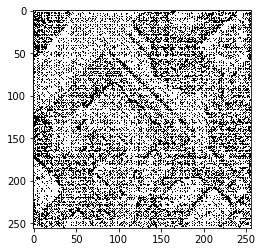

./AerialImageDataset/test/images_split/roof/innsbruck19_02_18.tiff


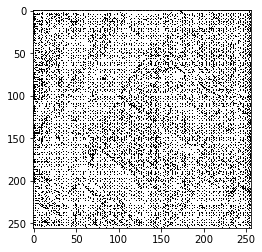

./AerialImageDataset/test/images_split/roof/innsbruck19_16_06.tiff


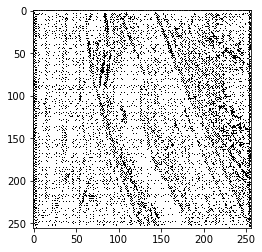

./AerialImageDataset/test/images_split/roof/innsbruck19_14_03.tiff


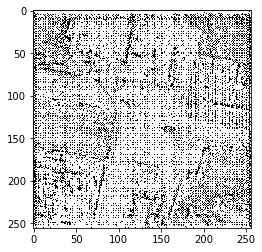

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_09_04.tiff


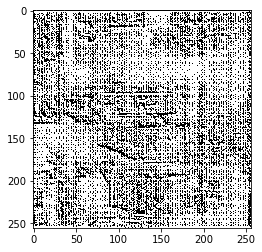

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_13_09.tiff


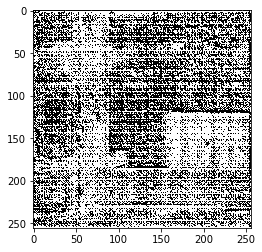

./AerialImageDataset/test/images_split/roof/sfo36_12_17.tiff


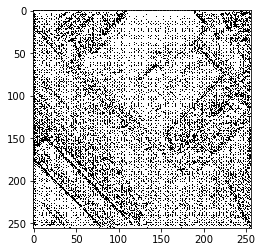

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_16_15.tiff


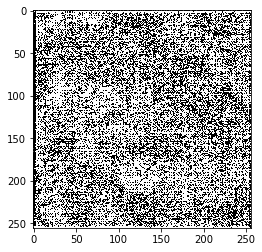

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_18_10.tiff


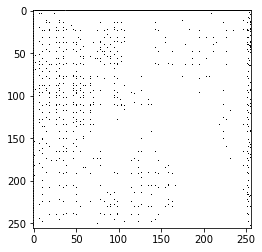

./AerialImageDataset/test/images_split/roof/sfo36_02_14.tiff


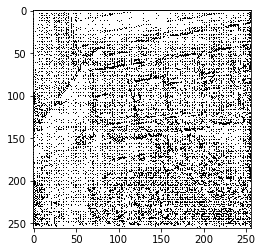

./AerialImageDataset/test/images_split/roof/innsbruck19_01_11.tiff


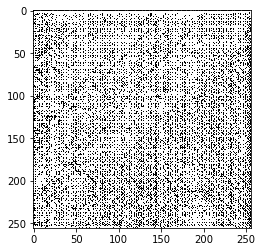

./AerialImageDataset/test/images_split/roof/bellingham11_12_10.tiff


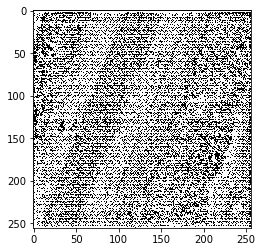

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_09_19.tiff


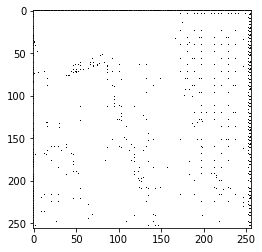

./AerialImageDataset/test/images_split/roof/innsbruck19_05_13.tiff


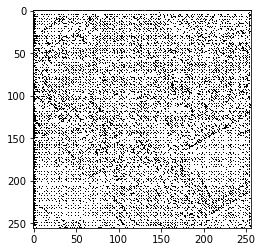

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_11_17.tiff


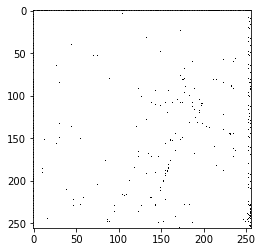

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_02_16.tiff


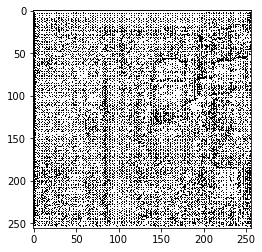

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_17_05.tiff


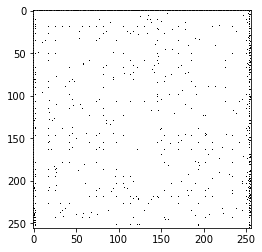

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_16_12.tiff


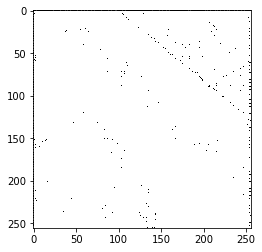

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_12_08.tiff


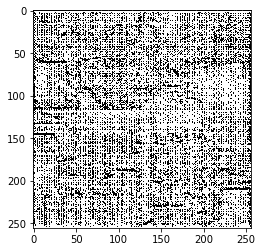

./AerialImageDataset/test/images_split/roof/innsbruck19_11_08.tiff


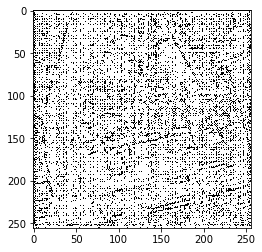

./AerialImageDataset/test/images_split/roof/sfo36_01_08.tiff


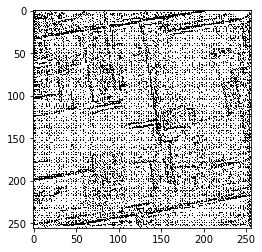

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_17_09.tiff


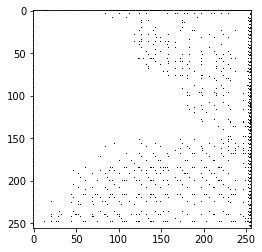

./AerialImageDataset/test/images_split/roof/bellingham11_02_11.tiff


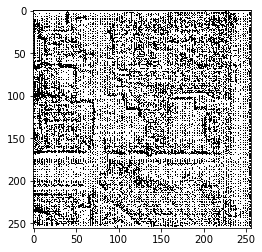

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_01_11.tiff


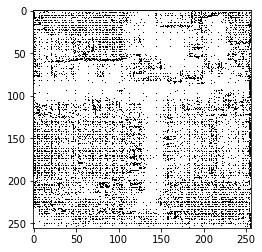

./AerialImageDataset/test/images_split/roof/bellingham11_14_12.tiff


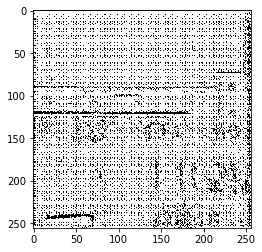

./AerialImageDataset/test/images_split/roof/innsbruck19_18_11.tiff


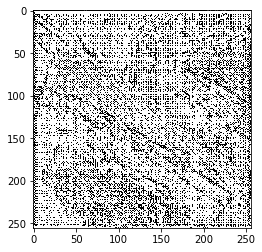

./AerialImageDataset/test/images_split/roof/sfo36_09_04.tiff


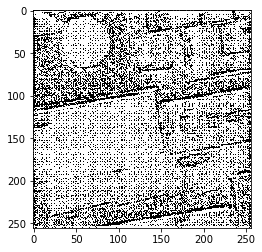

./AerialImageDataset/test/images_split/roof/bellingham11_14_03.tiff


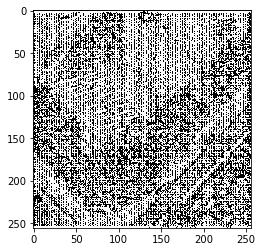

./AerialImageDataset/test/images_split/roof/bellingham11_07_16.tiff


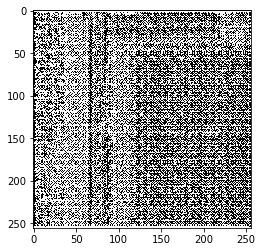

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_06_18.tiff


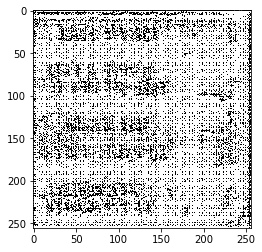

./AerialImageDataset/test/images_split/roof/bellingham11_15_17.tiff


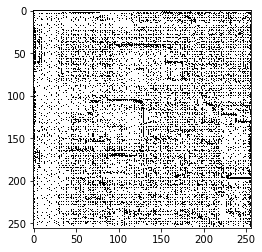

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_06_12.tiff


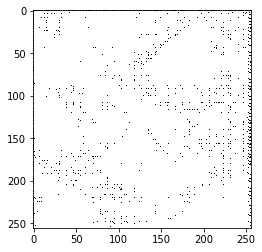

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_01_18.tiff


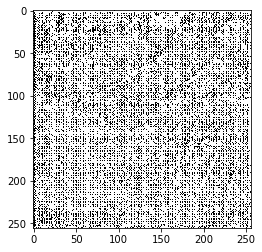

./AerialImageDataset/test/images_split/roof/bellingham11_01_09.tiff


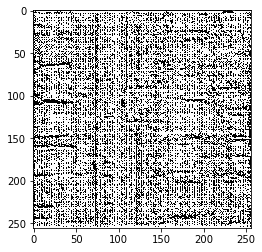

./AerialImageDataset/test/images_split/roof/bellingham11_01_06.tiff


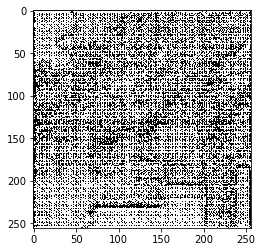

./AerialImageDataset/test/images_split/roof/sfo36_10_16.tiff


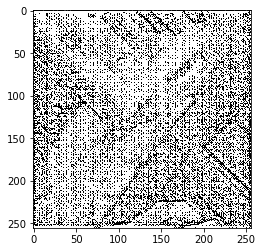

./AerialImageDataset/test/images_split/roof/innsbruck19_16_17.tiff


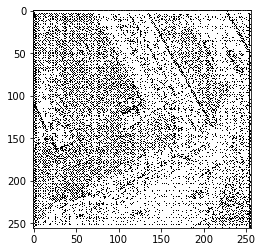

./AerialImageDataset/test/images_split/roof/bellingham11_01_12.tiff


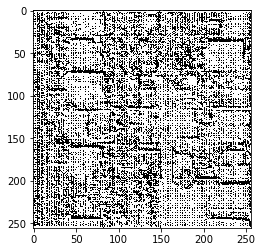

./AerialImageDataset/test/images_split/roof/innsbruck19_10_09.tiff


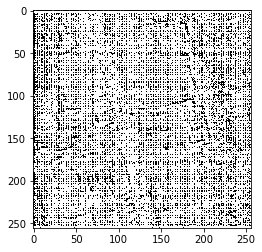

./AerialImageDataset/test/images_split/roof/sfo36_18_10.tiff


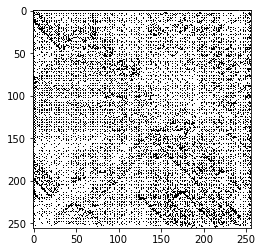

./AerialImageDataset/test/images_split/roof/sfo36_15_13.tiff


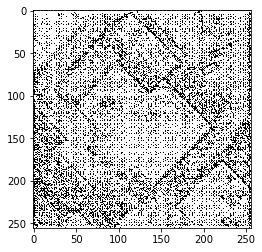

./AerialImageDataset/test/images_split/roof/bellingham11_03_16.tiff


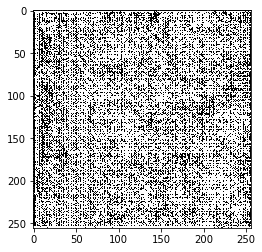

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_07_17.tiff


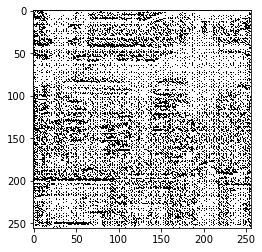

./AerialImageDataset/test/images_split/roof/bellingham11_20_04.tiff


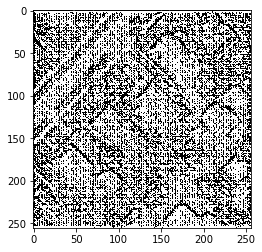

./AerialImageDataset/test/images_split/roof/bellingham11_05_15.tiff


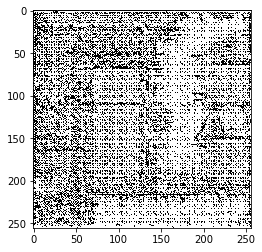

./AerialImageDataset/test/images_split/roof/bellingham11_13_18.tiff


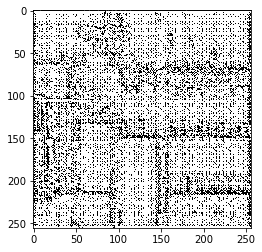

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_11_02.tiff


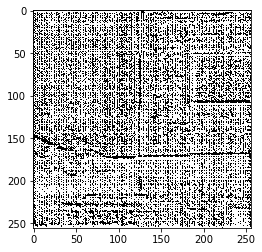

./AerialImageDataset/test/images_split/roof/innsbruck19_09_12.tiff


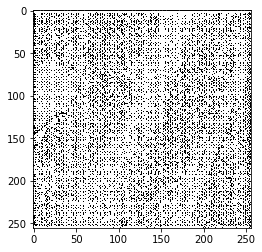

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_04_12.tiff


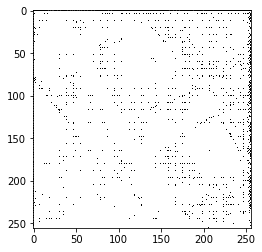

./AerialImageDataset/test/images_split/roof/bellingham11_02_20.tiff


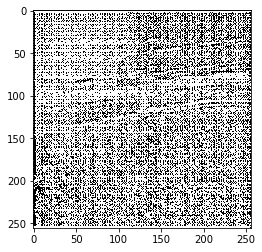

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_03_18.tiff


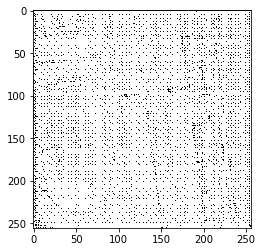

./AerialImageDataset/test/images_split/roof/innsbruck19_15_11.tiff


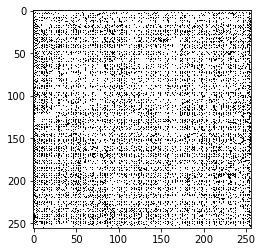

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_09_12.tiff


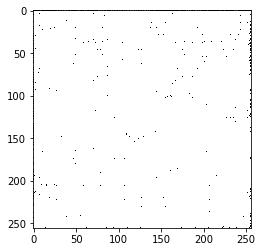

./AerialImageDataset/test/images_split/roof/sfo36_04_13.tiff


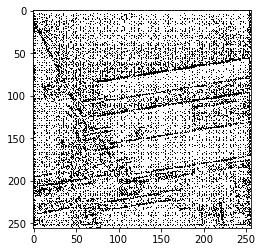

./AerialImageDataset/test/images_split/roof/bellingham11_07_13.tiff


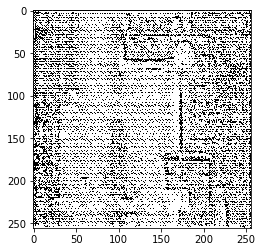

./AerialImageDataset/test/images_split/roof/sfo36_02_12.tiff


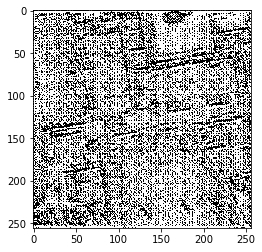

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_06_06.tiff


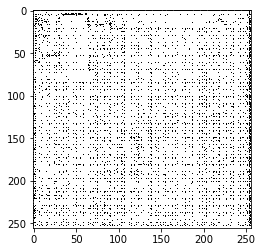

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_18_13.tiff


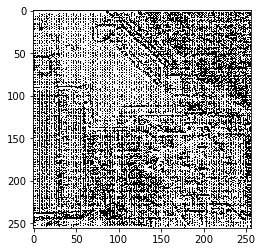

./AerialImageDataset/test/images_split/roof/innsbruck19_03_09.tiff


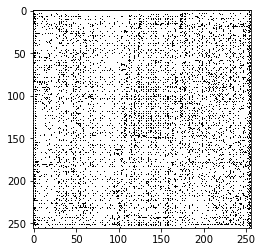

./AerialImageDataset/test/images_split/roof/innsbruck19_02_16.tiff


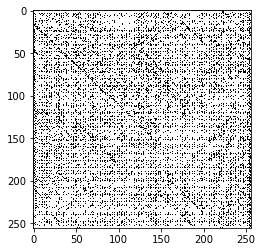

./AerialImageDataset/test/images_split/roof/sfo36_12_02.tiff


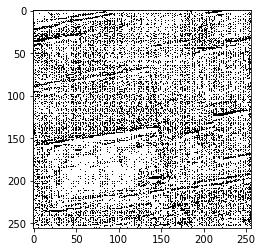

./AerialImageDataset/test/images_split/roof/bellingham11_09_05.tiff


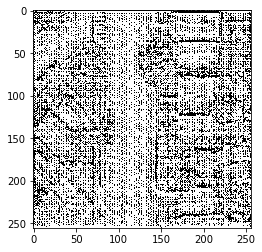

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_15_06.tiff


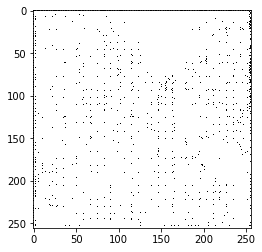

./AerialImageDataset/test/images_split/roof/sfo36_11_11.tiff


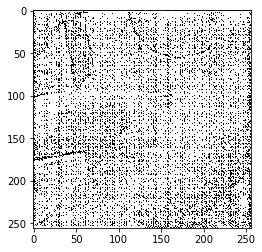

./AerialImageDataset/test/images_split/roof/sfo36_16_18.tiff


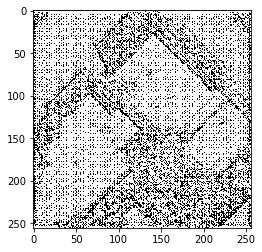

./AerialImageDataset/test/images_split/roof/bellingham11_10_10.tiff


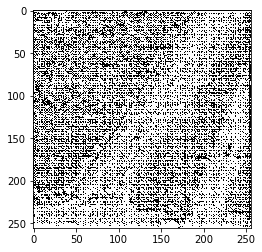

./AerialImageDataset/test/images_split/roof/sfo36_09_11.tiff


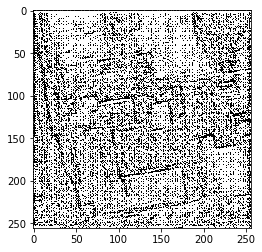

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_05_12.tiff


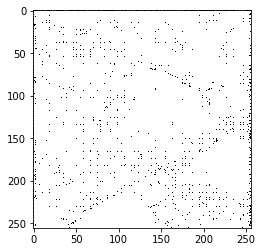

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_03_14.tiff


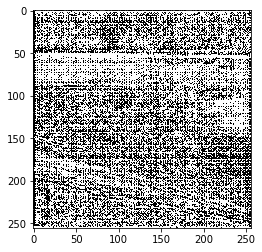

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_03_04.tiff


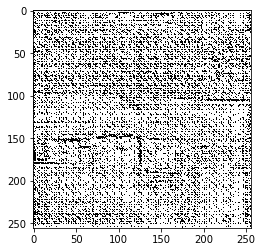

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_04_10.tiff


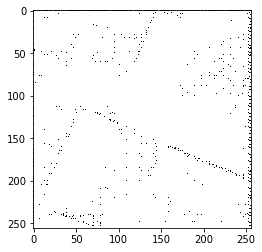

./AerialImageDataset/test/images_split/roof/sfo36_06_13.tiff


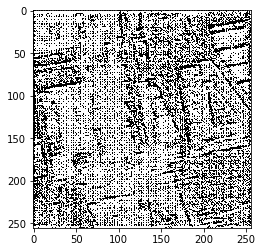

./AerialImageDataset/test/images_split/roof/innsbruck19_13_02.tiff


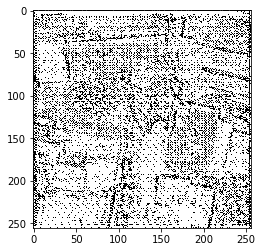

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_03_20.tiff


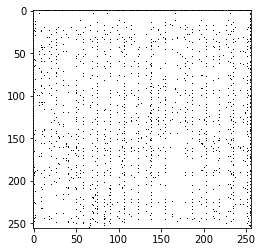

./AerialImageDataset/test/images_split/roof/bellingham11_10_16.tiff


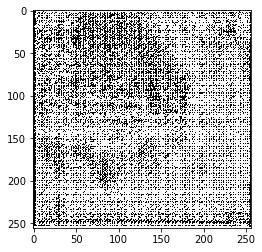

./AerialImageDataset/test/images_split/roof/sfo36_03_01.tiff


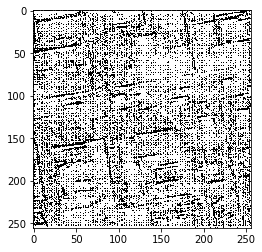

./AerialImageDataset/test/images_split/roof/innsbruck19_16_14.tiff


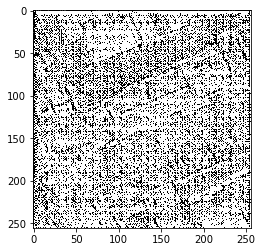

./AerialImageDataset/test/images_split/roof/sfo36_01_03.tiff


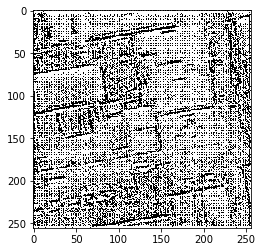

./AerialImageDataset/test/images_split/roof/bellingham11_20_03.tiff


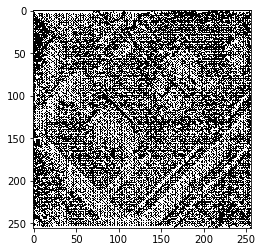

./AerialImageDataset/test/images_split/roof/bellingham11_15_12.tiff


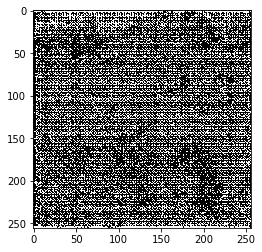

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_09_12.tiff


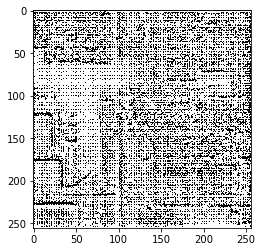

./AerialImageDataset/test/images_split/roof/sfo36_10_01.tiff


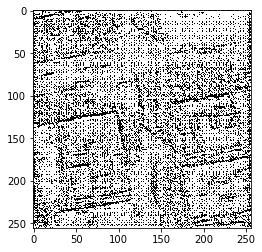

./AerialImageDataset/test/images_split/roof/bellingham11_10_17.tiff


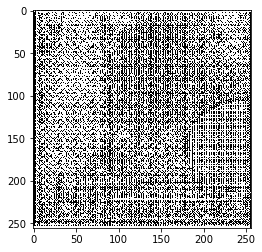

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_06_11.tiff


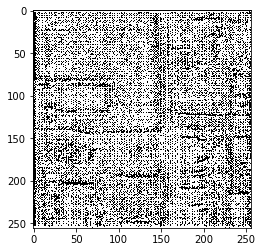

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_11_13.tiff


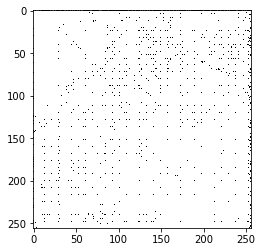

./AerialImageDataset/test/images_split/roof/sfo36_18_03.tiff


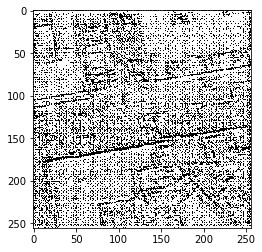

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_12_14.tiff


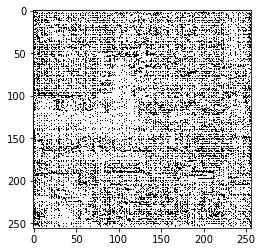

./AerialImageDataset/test/images_split/roof/bellingham11_18_14.tiff


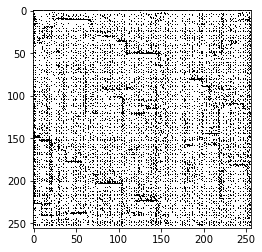

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_20_06.tiff


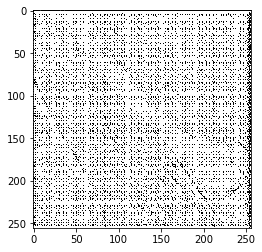

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_12_13.tiff


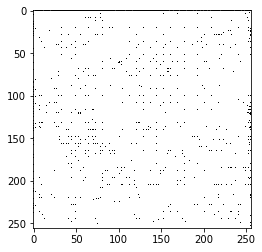

./AerialImageDataset/test/images_split/roof/bellingham11_18_01.tiff


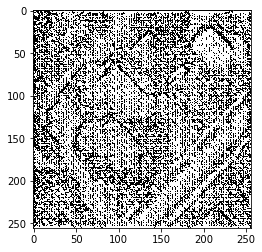

./AerialImageDataset/test/images_split/roof/bellingham11_19_17.tiff


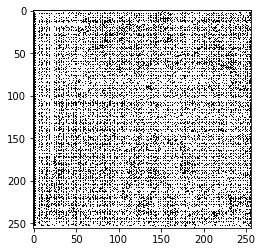

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_15_12.tiff


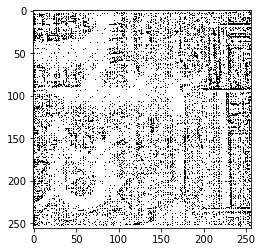

./AerialImageDataset/test/images_split/roof/bellingham11_13_14.tiff


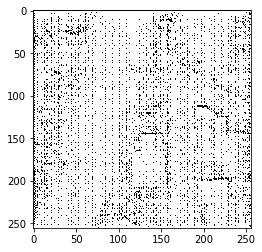

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_01_11.tiff


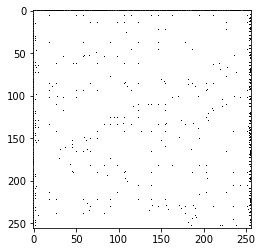

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_13_04.tiff


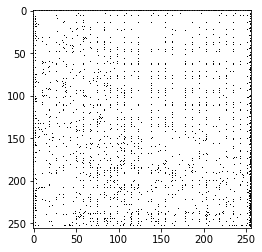

./AerialImageDataset/test/images_split/roof/innsbruck19_04_13.tiff


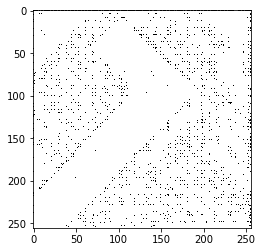

./AerialImageDataset/test/images_split/roof/innsbruck19_10_10.tiff


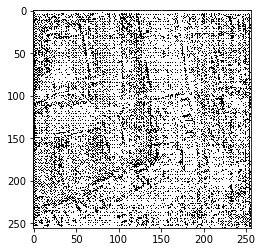

./AerialImageDataset/test/images_split/roof/innsbruck19_07_04.tiff


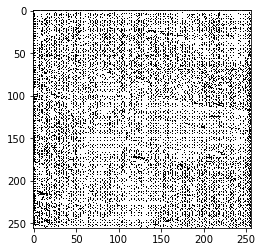

./AerialImageDataset/test/images_split/roof/innsbruck19_04_16.tiff


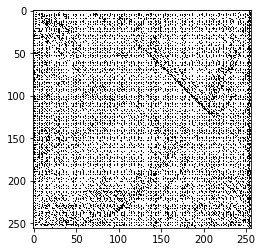

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_05_01.tiff


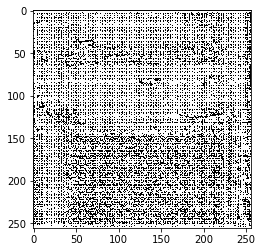

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_19_05.tiff


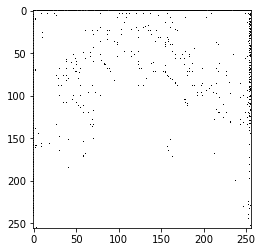

./AerialImageDataset/test/images_split/roof/sfo36_02_08.tiff


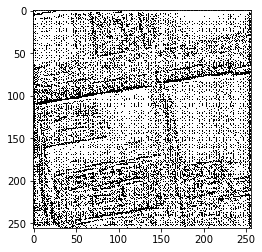

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_01_12.tiff


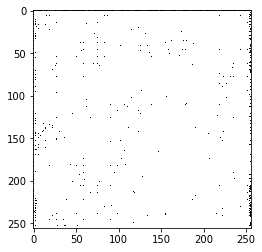

./AerialImageDataset/test/images_split/roof/innsbruck19_19_06.tiff


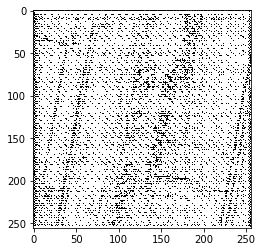

./AerialImageDataset/test/images_split/roof/sfo36_04_20.tiff


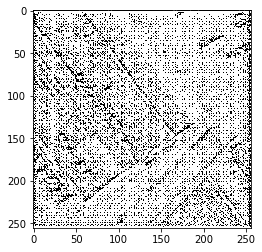

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_10_09.tiff


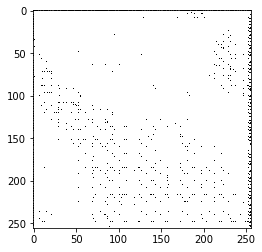

./AerialImageDataset/test/images_split/roof/sfo36_18_20.tiff


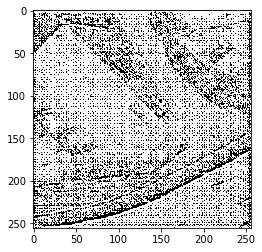

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_13_15.tiff


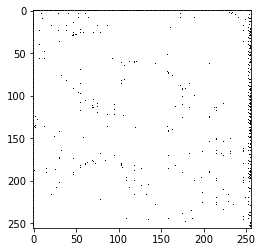

./AerialImageDataset/test/images_split/roof/sfo36_19_06.tiff


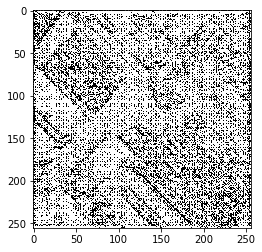

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_07_15.tiff


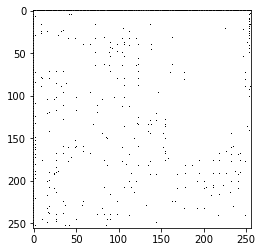

./AerialImageDataset/test/images_split/roof/innsbruck19_05_07.tiff


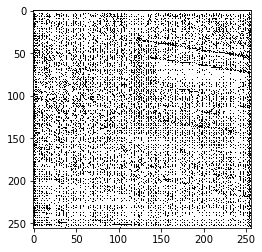

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_19_10.tiff


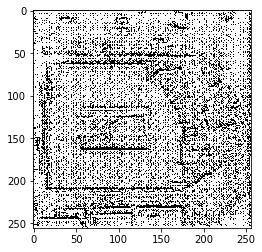

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_10_11.tiff


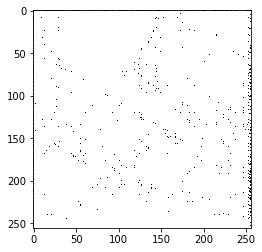

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_08_11.tiff


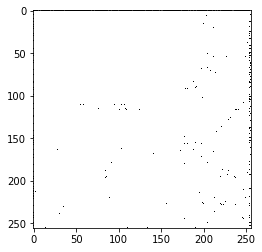

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_18_04.tiff


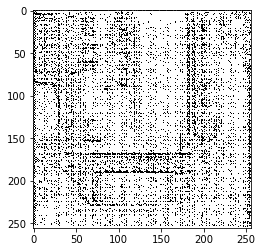

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_13_06.tiff


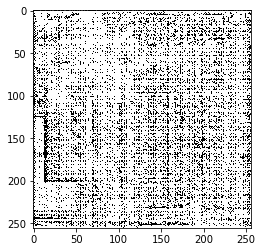

./AerialImageDataset/test/images_split/roof/innsbruck19_13_19.tiff


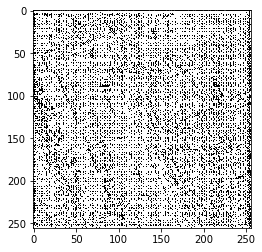

./AerialImageDataset/test/images_split/roof/innsbruck19_04_01.tiff


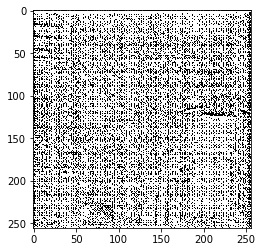

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_14_05.tiff


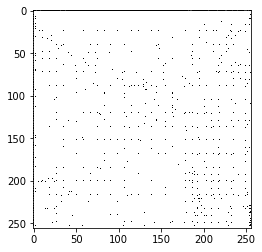

./AerialImageDataset/test/images_split/roof/bellingham11_15_06.tiff


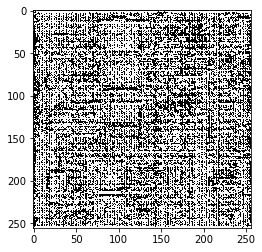

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_08_10.tiff


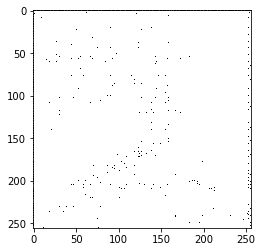

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_18_05.tiff


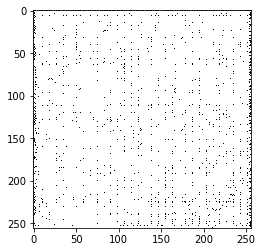

./AerialImageDataset/test/images_split/roof/innsbruck19_05_16.tiff


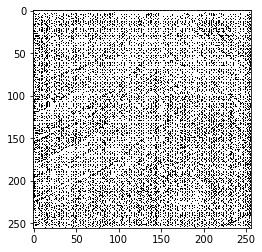

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_02_01.tiff


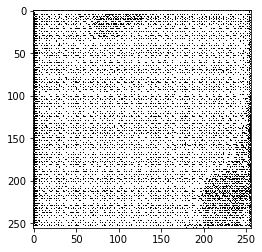

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_03_16.tiff


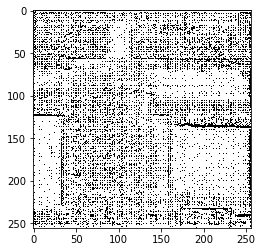

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_11_02.tiff


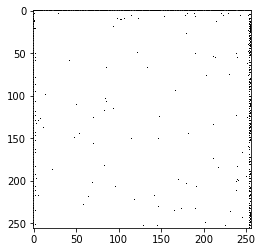

./AerialImageDataset/test/images_split/roof/innsbruck19_02_17.tiff


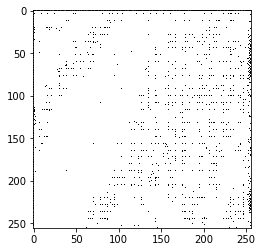

./AerialImageDataset/test/images_split/roof/bellingham11_11_07.tiff


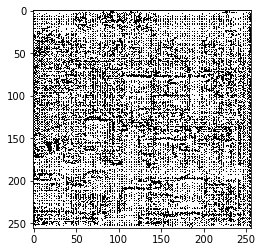

./AerialImageDataset/test/images_split/roof/innsbruck19_07_12.tiff


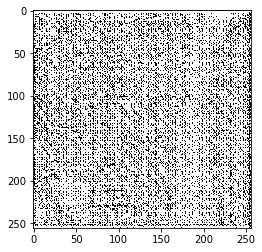

./AerialImageDataset/test/images_split/roof/innsbruck19_06_16.tiff


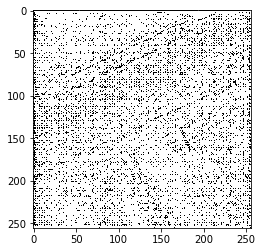

./AerialImageDataset/test/images_split/roof/sfo36_07_13.tiff


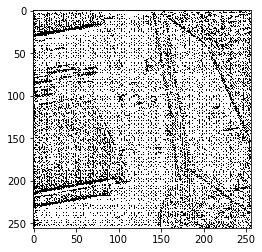

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_15_11.tiff


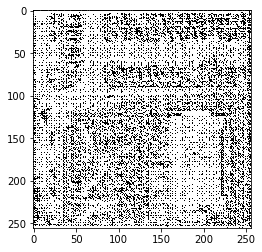

./AerialImageDataset/test/images_split/roof/bellingham11_16_03.tiff


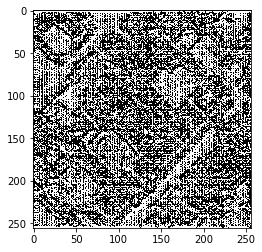

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_16_14.tiff


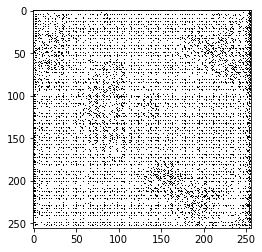

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_06_14.tiff


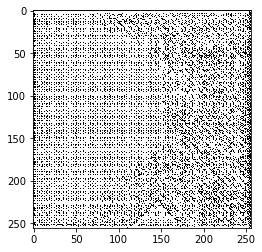

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_07_10.tiff


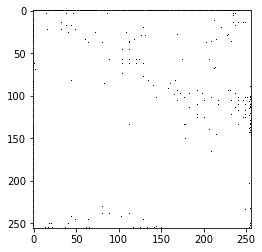

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_19_19.tiff


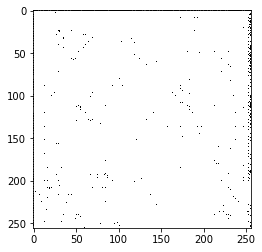

./AerialImageDataset/test/images_split/roof/bellingham11_15_19.tiff


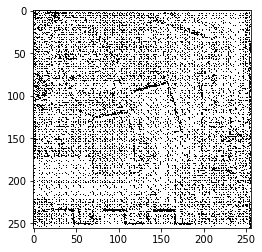

./AerialImageDataset/test/images_split/roof/innsbruck19_04_18.tiff


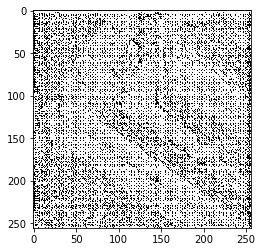

./AerialImageDataset/test/images_split/roof/sfo36_04_06.tiff


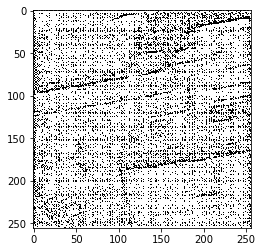

./AerialImageDataset/test/images_split/roof/bellingham11_11_09.tiff


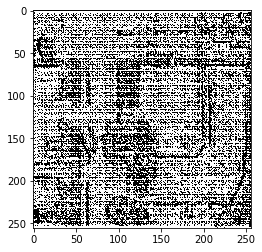

./AerialImageDataset/test/images_split/roof/innsbruck19_14_06.tiff


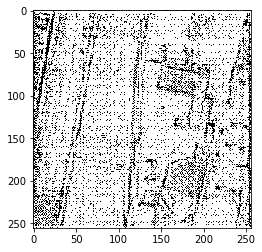

./AerialImageDataset/test/images_split/roof/sfo36_04_08.tiff


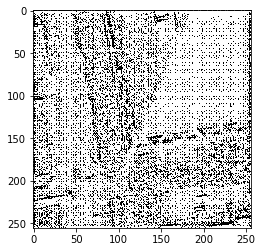

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_13_02.tiff


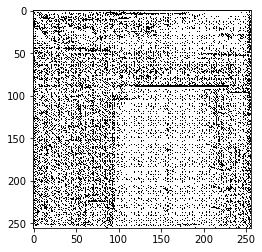

./AerialImageDataset/test/images_split/roof/bellingham11_03_09.tiff


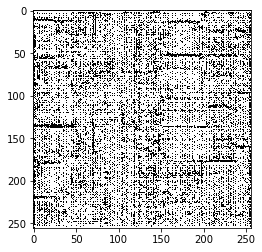

./AerialImageDataset/test/images_split/roof/bellingham11_05_12.tiff


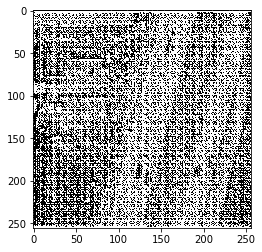

./AerialImageDataset/test/images_split/roof/innsbruck19_12_04.tiff


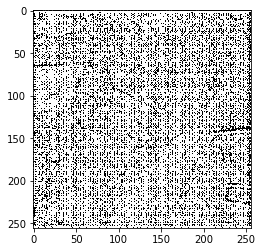

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_01_04.tiff


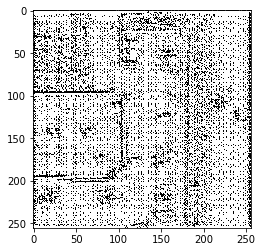

./AerialImageDataset/test/images_split/roof/sfo36_16_20.tiff


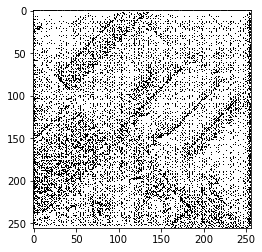

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_20_14.tiff


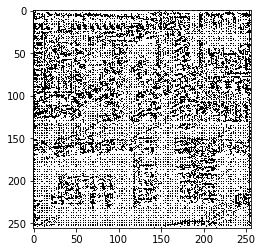

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_15_20.tiff


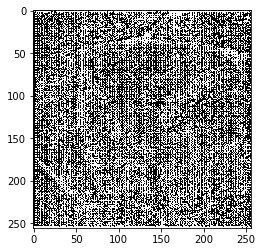

./AerialImageDataset/test/images_split/roof/bellingham11_02_10.tiff


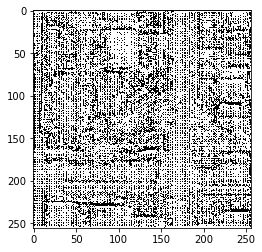

./AerialImageDataset/test/images_split/roof/sfo36_16_11.tiff


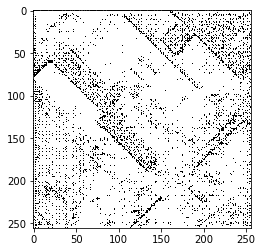

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_04_07.tiff


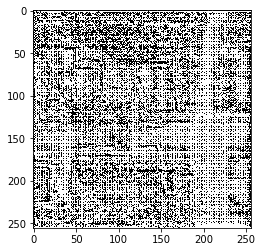

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_19_01.tiff


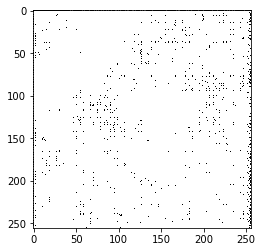

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_18_01.tiff


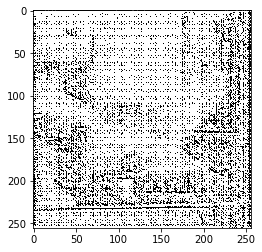

./AerialImageDataset/test/images_split/roof/innsbruck19_09_17.tiff


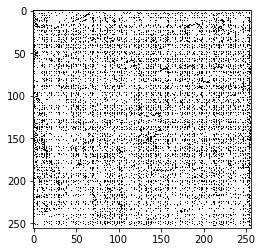

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_13_20.tiff


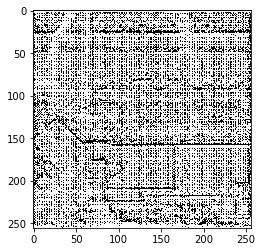

./AerialImageDataset/test/images_split/roof/bellingham11_07_03.tiff


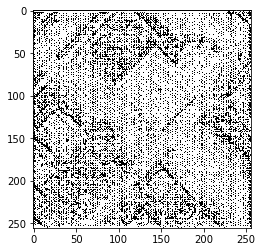

./AerialImageDataset/test/images_split/roof/bellingham11_06_09.tiff


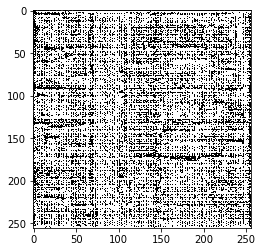

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_03_05.tiff


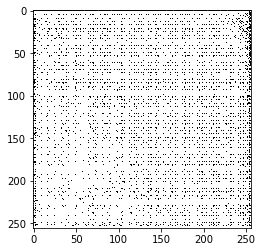

./AerialImageDataset/test/images_split/roof/sfo36_11_20.tiff


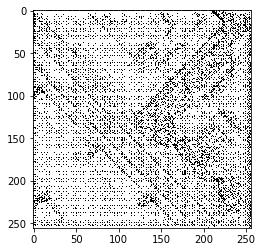

./AerialImageDataset/test/images_split/roof/sfo36_01_20.tiff


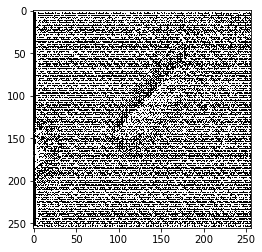

./AerialImageDataset/test/images_split/roof/innsbruck19_01_01.tiff


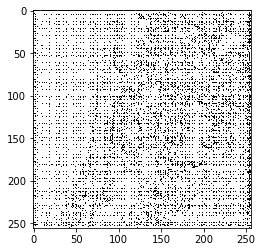

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_17_13.tiff


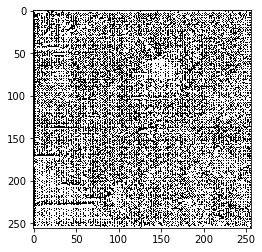

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_09_10.tiff


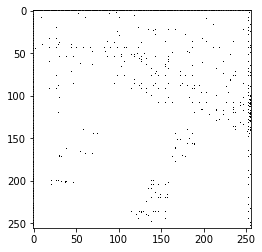

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_10_05.tiff


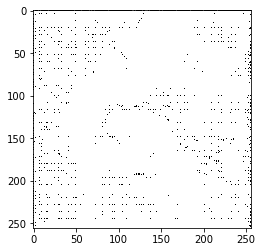

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_13_07.tiff


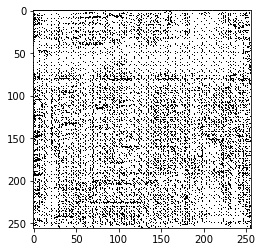

./AerialImageDataset/test/images_split/roof/innsbruck19_17_16.tiff


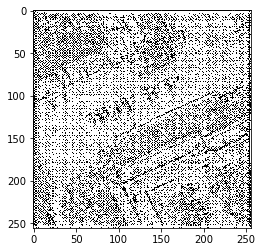

./AerialImageDataset/test/images_split/roof/bellingham11_18_09.tiff


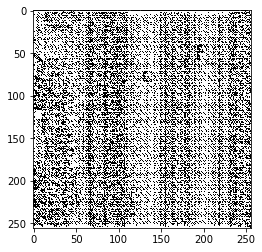

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_03_02.tiff


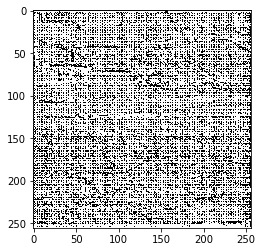

./AerialImageDataset/test/images_split/roof/bellingham11_16_05.tiff


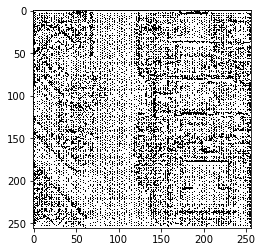

./AerialImageDataset/test/images_split/roof/sfo36_01_17.tiff


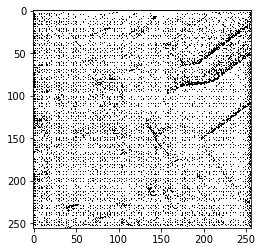

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_11_15.tiff


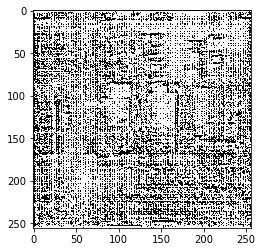

./AerialImageDataset/test/images_split/roof/sfo36_07_01.tiff


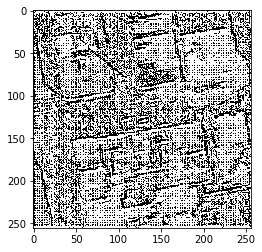

./AerialImageDataset/test/images_split/roof/innsbruck19_07_08.tiff


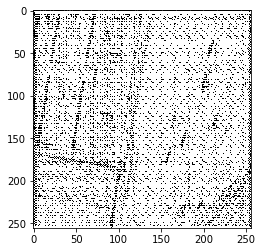

./AerialImageDataset/test/images_split/roof/innsbruck19_11_02.tiff


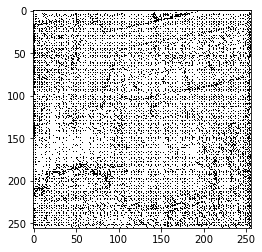

./AerialImageDataset/test/images_split/roof/sfo36_09_03.tiff


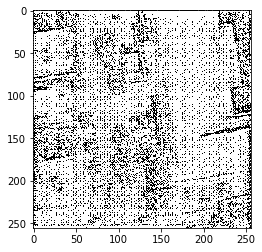

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_09_06.tiff


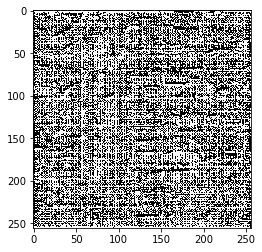

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_01_13.tiff


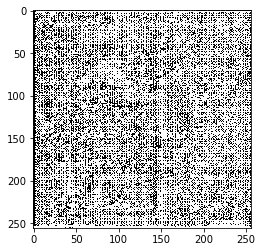

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_16_02.tiff


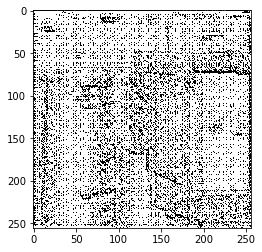

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_11_05.tiff


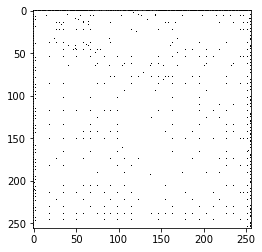

./AerialImageDataset/test/images_split/roof/bellingham11_01_16.tiff


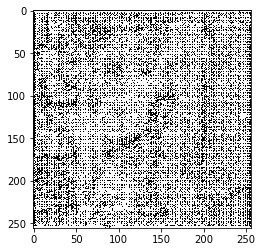

./AerialImageDataset/test/images_split/roof/sfo36_02_13.tiff


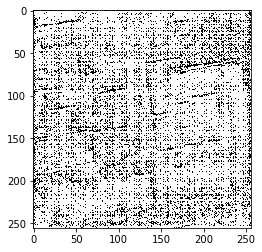

./AerialImageDataset/test/images_split/roof/sfo36_12_11.tiff


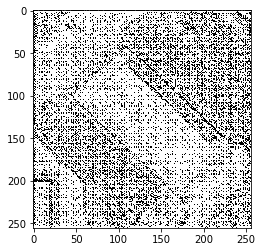

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_07_19.tiff


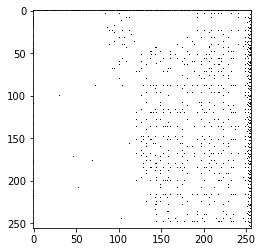

./AerialImageDataset/test/images_split/roof/bellingham11_15_05.tiff


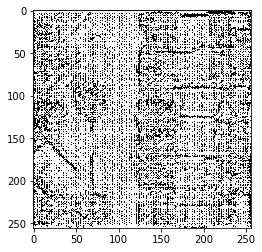

./AerialImageDataset/test/images_split/roof/sfo36_11_18.tiff


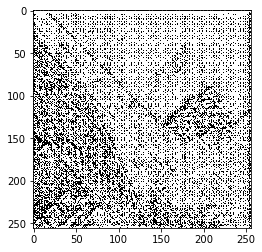

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_15_01.tiff


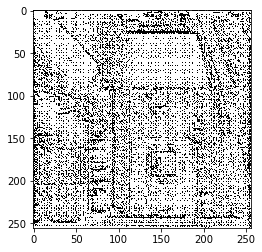

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_14_02.tiff


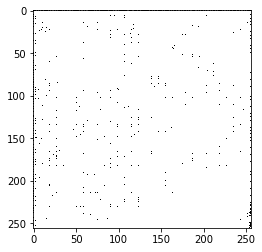

./AerialImageDataset/test/images_split/roof/bellingham11_01_10.tiff


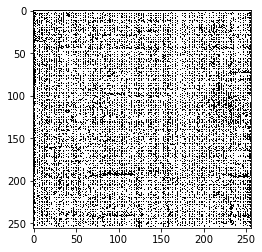

./AerialImageDataset/test/images_split/roof/bellingham11_10_19.tiff


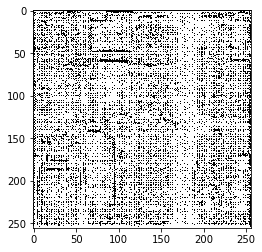

./AerialImageDataset/test/images_split/roof/bellingham11_03_02.tiff


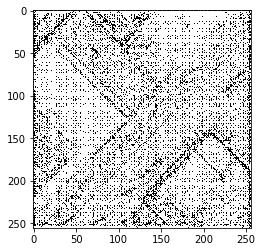

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_08_07.tiff


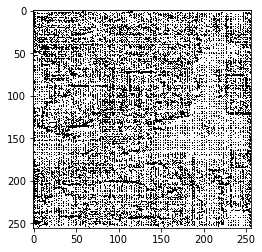

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_05_05.tiff


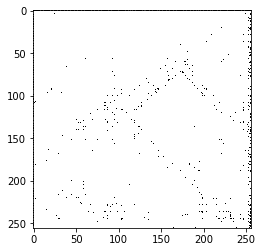

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_18_12.tiff


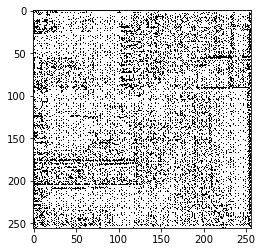

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_05_19.tiff


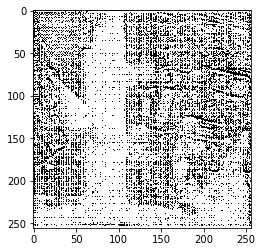

./AerialImageDataset/test/images_split/roof/sfo36_06_10.tiff


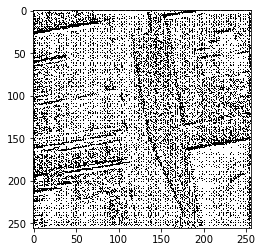

./AerialImageDataset/test/images_split/roof/sfo36_14_14.tiff


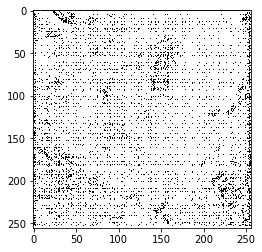

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_15_07.tiff


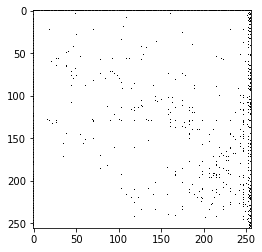

./AerialImageDataset/test/images_split/roof/sfo36_09_05.tiff


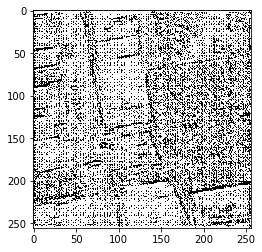

./AerialImageDataset/test/images_split/roof/sfo36_04_14.tiff


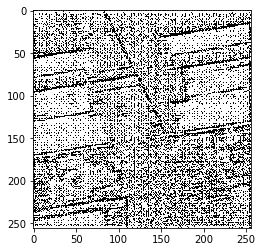

./AerialImageDataset/test/images_split/roof/bellingham11_08_09.tiff


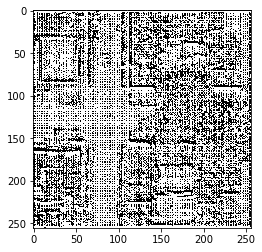

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_10_07.tiff


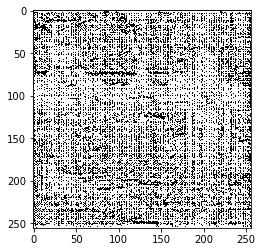

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_11_09.tiff


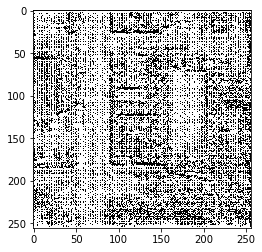

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_15_03.tiff


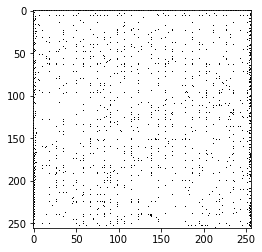

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_15_11.tiff


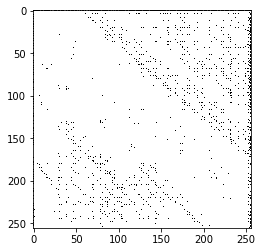

./AerialImageDataset/test/images_split/roof/bellingham11_03_06.tiff


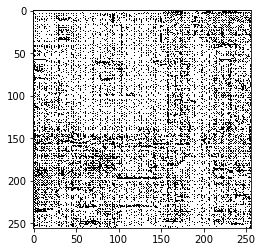

./AerialImageDataset/test/images_split/roof/innsbruck19_11_20.tiff


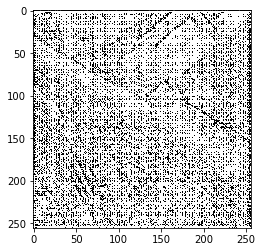

./AerialImageDataset/test/images_split/roof/bellingham11_04_01.tiff


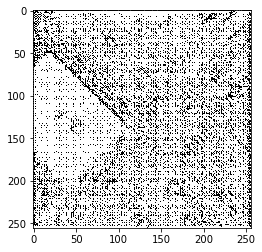

./AerialImageDataset/test/images_split/roof/bellingham11_05_16.tiff


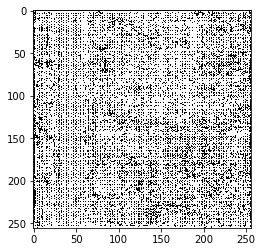

./AerialImageDataset/test/images_split/roof/sfo36_08_09.tiff


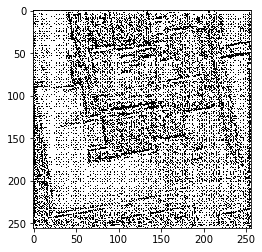

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_14_14.tiff


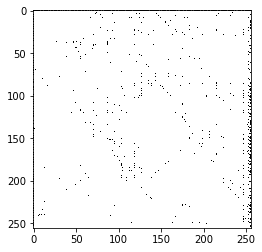

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_09_11.tiff


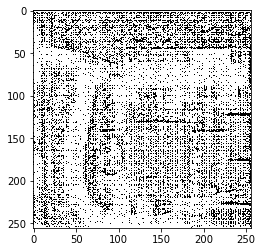

./AerialImageDataset/test/images_split/roof/bellingham11_03_13.tiff


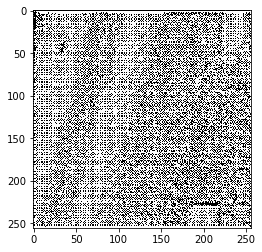

./AerialImageDataset/test/images_split/roof/sfo36_07_12.tiff


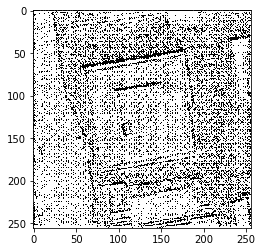

./AerialImageDataset/test/images_split/roof/sfo36_11_01.tiff


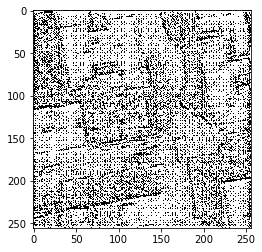

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_01_20.tiff


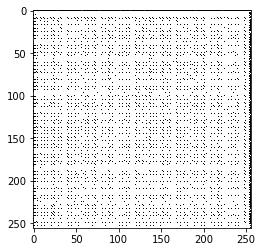

./AerialImageDataset/test/images_split/roof/bellingham11_05_19.tiff


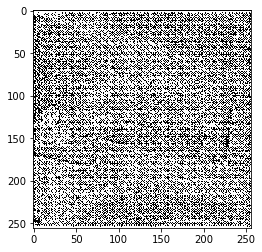

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_14_07.tiff


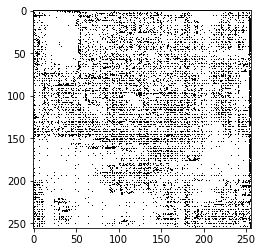

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_16_05.tiff


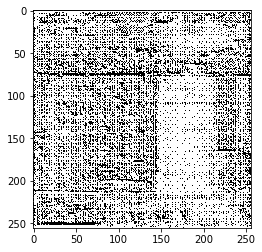

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_06_02.tiff


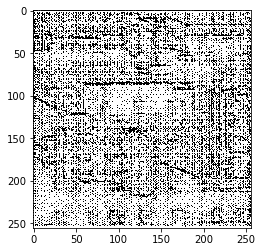

./AerialImageDataset/test/images_split/roof/innsbruck19_15_09.tiff


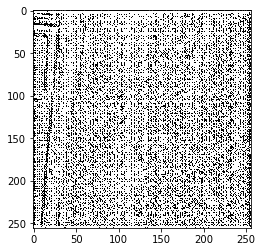

./AerialImageDataset/test/images_split/roof/bellingham11_04_04.tiff


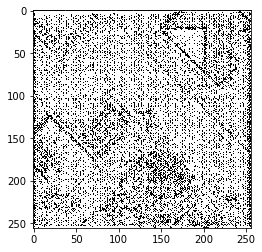

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_06_03.tiff


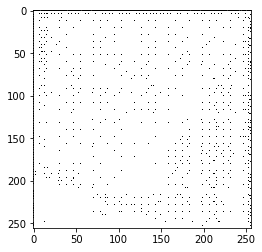

./AerialImageDataset/test/images_split/roof/innsbruck19_02_04.tiff


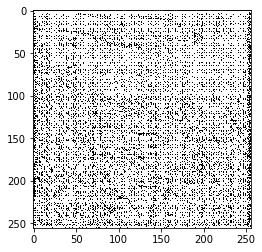

./AerialImageDataset/test/images_split/roof/sfo36_01_06.tiff


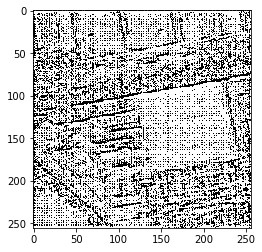

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_15_09.tiff


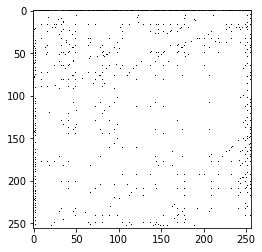

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_17_19.tiff


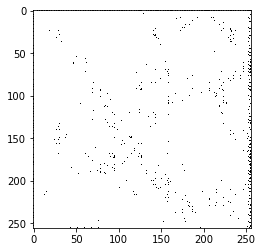

./AerialImageDataset/test/images_split/roof/sfo36_18_14.tiff


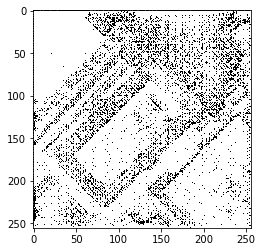

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_17_06.tiff


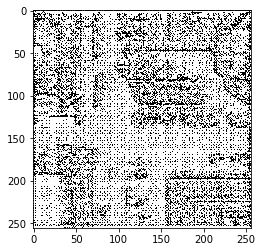

./AerialImageDataset/test/images_split/roof/bellingham11_01_20.tiff


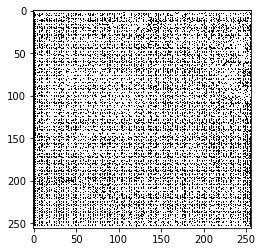

./AerialImageDataset/test/images_split/roof/bellingham11_16_16.tiff


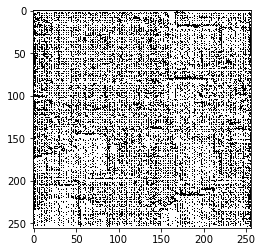

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_11_04.tiff


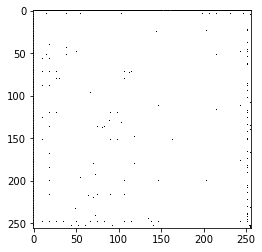

./AerialImageDataset/test/images_split/roof/sfo36_19_11.tiff


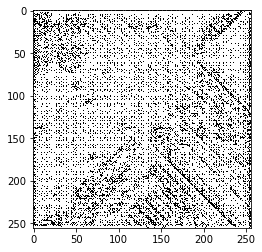

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_04_09.tiff


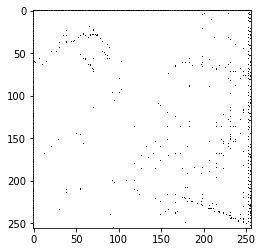

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_02_18.tiff


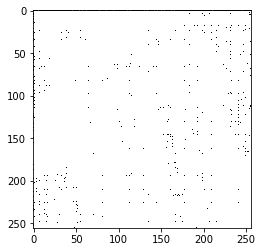

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_18_09.tiff


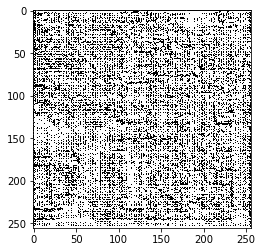

./AerialImageDataset/test/images_split/roof/innsbruck19_18_04.tiff


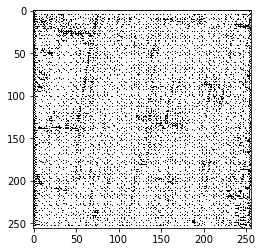

./AerialImageDataset/test/images_split/roof/innsbruck19_10_13.tiff


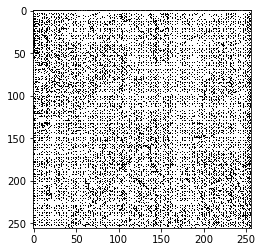

./AerialImageDataset/test/images_split/roof/innsbruck19_04_03.tiff


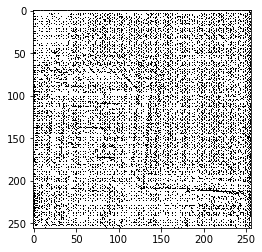

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_02_02.tiff


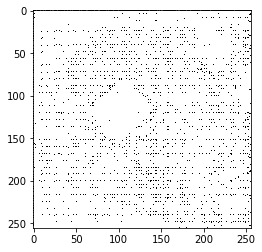

./AerialImageDataset/test/images_split/roof/innsbruck19_08_06.tiff


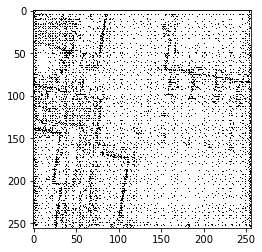

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_06_01.tiff


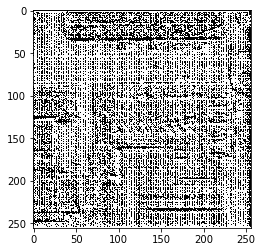

./AerialImageDataset/test/images_split/roof/bellingham11_03_20.tiff


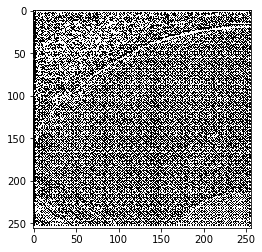

./AerialImageDataset/test/images_split/roof/bellingham11_10_09.tiff


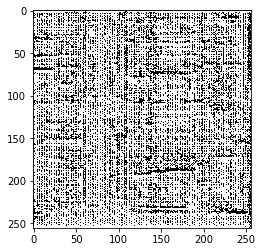

./AerialImageDataset/test/images_split/roof/bellingham11_18_06.tiff


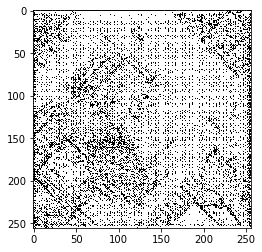

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_18_06.tiff


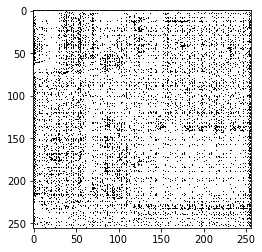

./AerialImageDataset/test/images_split/roof/sfo36_10_18.tiff


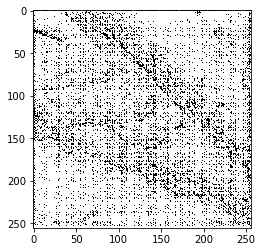

./AerialImageDataset/test/images_split/roof/innsbruck19_03_10.tiff


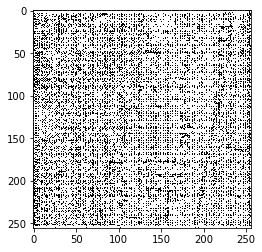

./AerialImageDataset/test/images_split/roof/innsbruck19_16_03.tiff


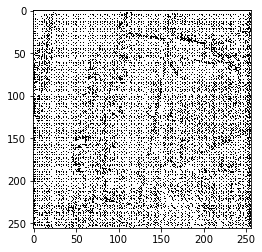

./AerialImageDataset/test/images_split/roof/innsbruck19_20_03.tiff


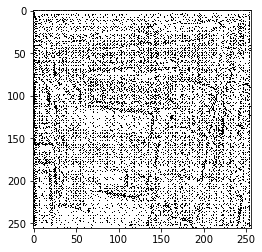

./AerialImageDataset/test/images_split/roof/sfo36_19_03.tiff


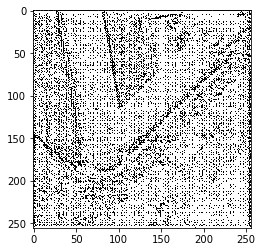

./AerialImageDataset/test/images_split/roof/sfo36_12_04.tiff


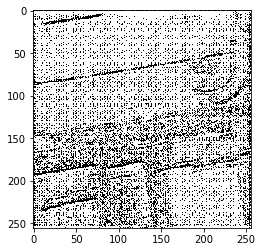

./AerialImageDataset/test/images_split/roof/innsbruck19_20_16.tiff


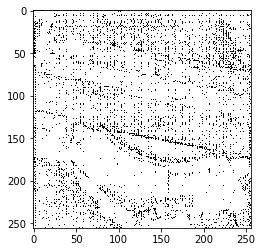

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_09_09.tiff


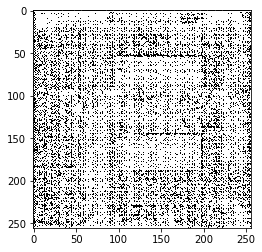

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_05_02.tiff


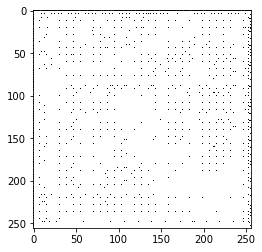

./AerialImageDataset/test/images_split/roof/sfo36_05_07.tiff


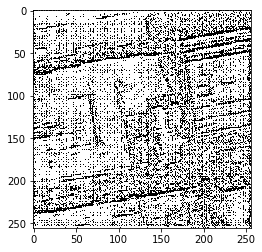

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_11_14.tiff


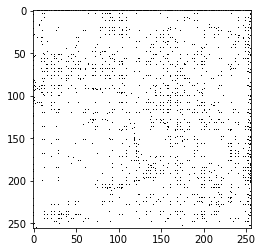

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_10_11.tiff


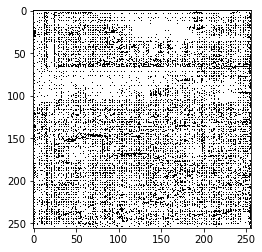

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_02_19.tiff


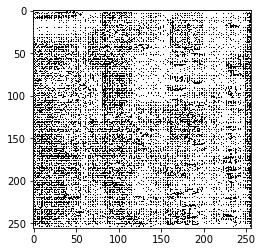

./AerialImageDataset/test/images_split/roof/sfo36_12_06.tiff


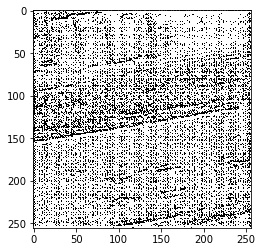

./AerialImageDataset/test/images_split/roof/sfo36_18_11.tiff


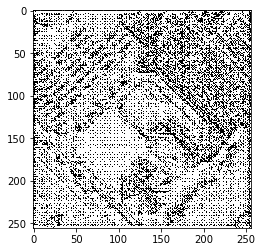

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_18_06.tiff


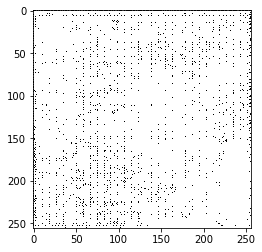

./AerialImageDataset/test/images_split/roof/innsbruck19_19_18.tiff


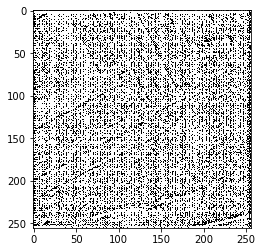

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_02_05.tiff


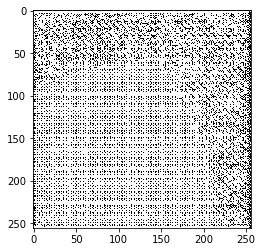

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_02_09.tiff


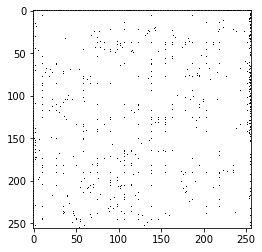

./AerialImageDataset/test/images_split/roof/sfo36_11_17.tiff


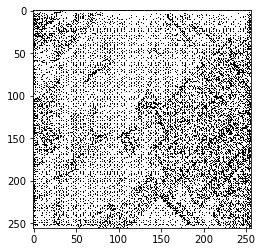

./AerialImageDataset/test/images_split/roof/innsbruck19_19_11.tiff


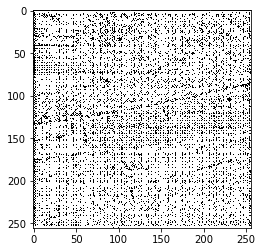

./AerialImageDataset/test/images_split/roof/innsbruck19_10_08.tiff


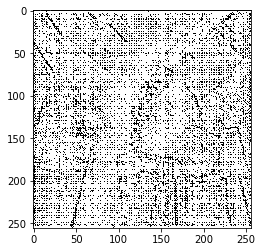

./AerialImageDataset/test/images_split/roof/innsbruck19_02_02.tiff


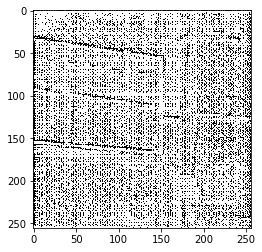

./AerialImageDataset/test/images_split/roof/bellingham11_09_13.tiff


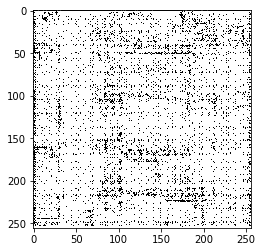

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_04_16.tiff


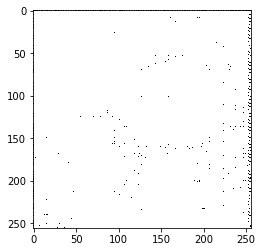

./AerialImageDataset/test/images_split/roof/sfo36_04_11.tiff


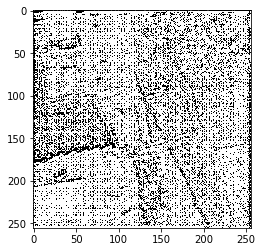

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_02_15.tiff


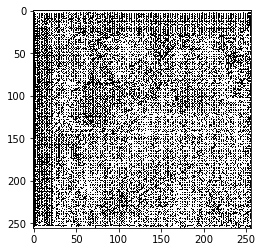

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_12_19.tiff


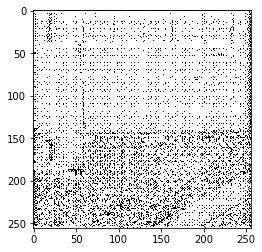

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_12_17.tiff


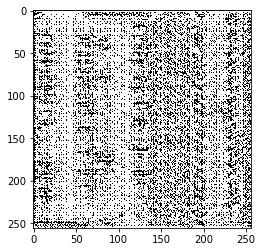

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_18_17.tiff


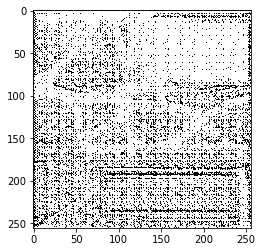

./AerialImageDataset/test/images_split/roof/bellingham11_12_06.tiff


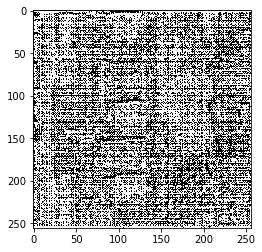

./AerialImageDataset/test/images_split/roof/innsbruck19_11_19.tiff


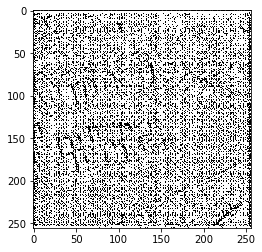

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_05_11.tiff


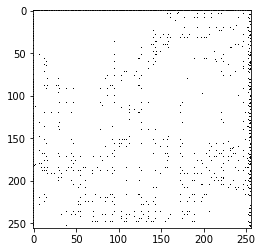

./AerialImageDataset/test/images_split/roof/innsbruck19_05_12.tiff


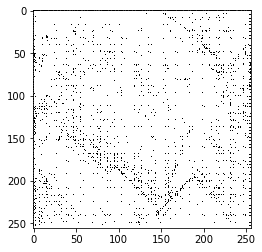

./AerialImageDataset/test/images_split/roof/sfo36_05_09.tiff


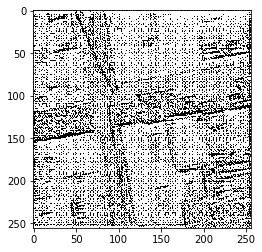

./AerialImageDataset/test/images_split/roof/innsbruck19_04_06.tiff


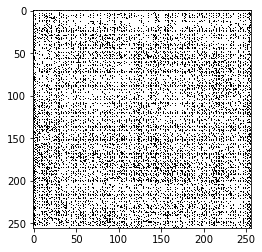

./AerialImageDataset/test/images_split/roof/bellingham11_18_18.tiff


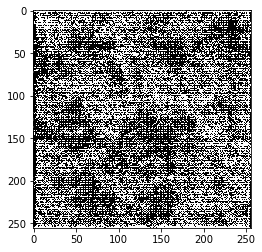

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_03_18.tiff


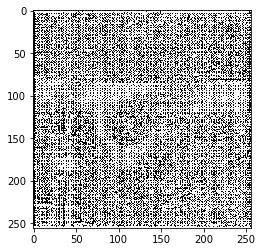

./AerialImageDataset/test/images_split/roof/sfo36_12_03.tiff


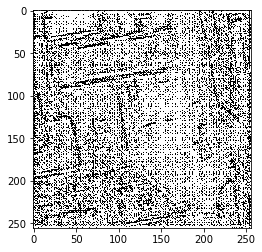

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_01_09.tiff


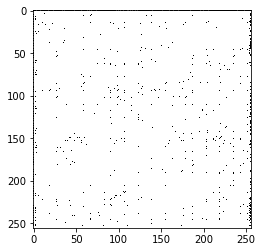

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_10_16.tiff


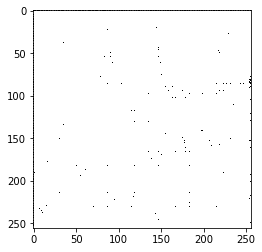

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_18_11.tiff


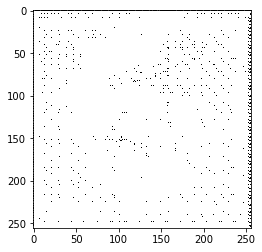

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_19_04.tiff


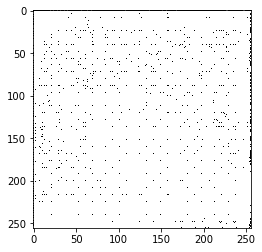

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_19_19.tiff


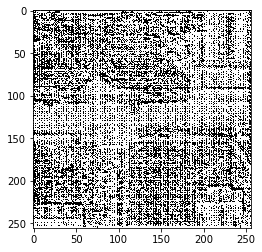

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_01_16.tiff


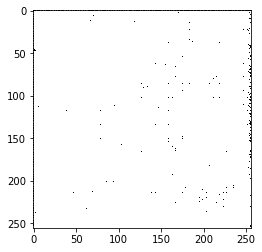

./AerialImageDataset/test/images_split/roof/innsbruck19_05_17.tiff


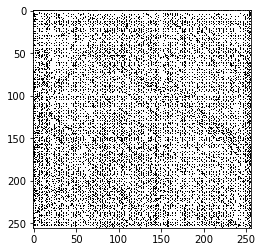

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_08_01.tiff


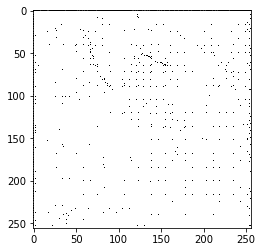

./AerialImageDataset/test/images_split/roof/sfo36_16_03.tiff


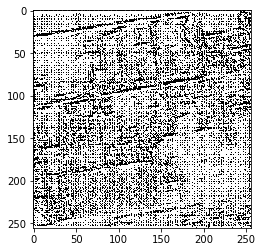

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_09_03.tiff


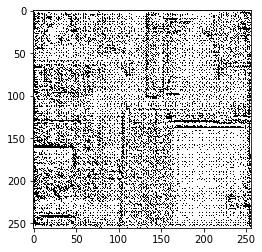

./AerialImageDataset/test/images_split/roof/bellingham11_02_06.tiff


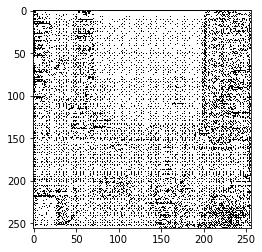

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_13_05.tiff


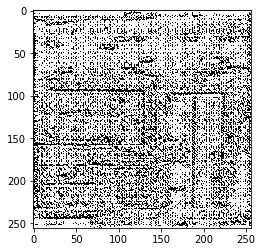

./AerialImageDataset/test/images_split/roof/sfo36_19_04.tiff


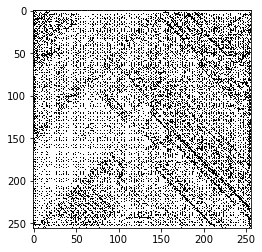

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_15_04.tiff


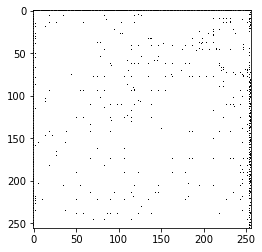

./AerialImageDataset/test/images_split/roof/sfo36_10_06.tiff


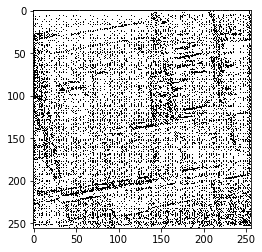

./AerialImageDataset/test/images_split/roof/innsbruck19_09_11.tiff


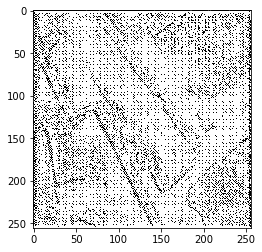

./AerialImageDataset/test/images_split/roof/innsbruck19_03_13.tiff


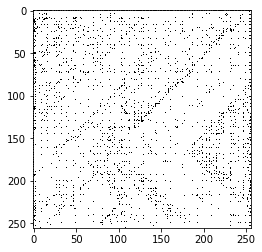

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_06_19.tiff


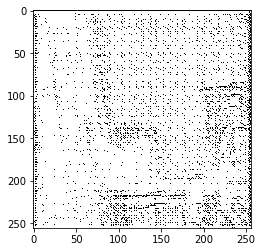

./AerialImageDataset/test/images_split/roof/bellingham11_12_01.tiff


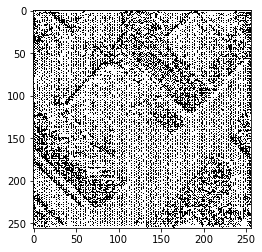

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_13_12.tiff


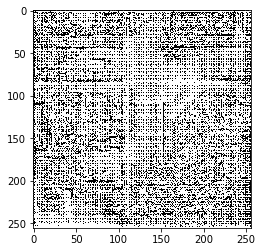

./AerialImageDataset/test/images_split/roof/innsbruck19_11_18.tiff


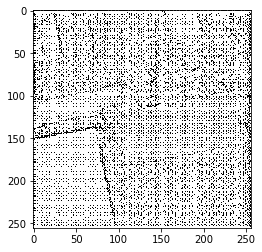

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_04_09.tiff


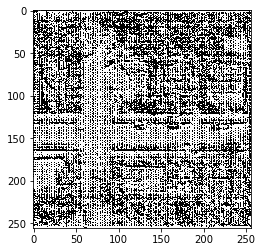

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_08_18.tiff


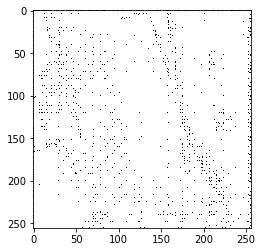

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_18_15.tiff


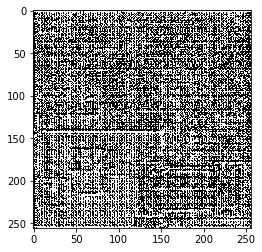

./AerialImageDataset/test/images_split/roof/sfo36_11_05.tiff


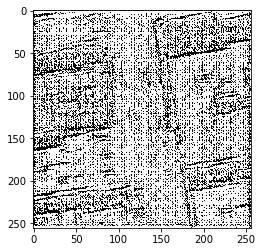

./AerialImageDataset/test/images_split/roof/sfo36_08_01.tiff


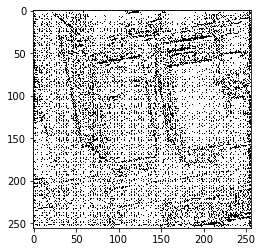

./AerialImageDataset/test/images_split/roof/innsbruck19_10_05.tiff


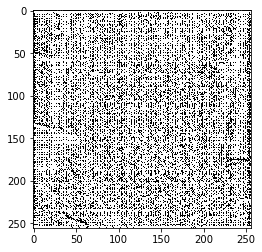

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_20_04.tiff


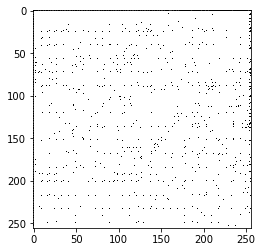

./AerialImageDataset/test/images_split/roof/innsbruck19_12_10.tiff


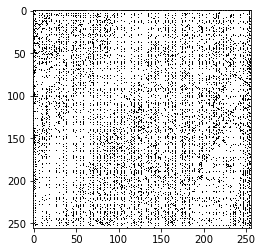

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_10_15.tiff


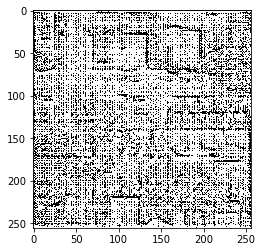

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_03_08.tiff


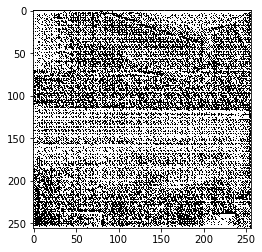

./AerialImageDataset/test/images_split/roof/innsbruck19_14_05.tiff


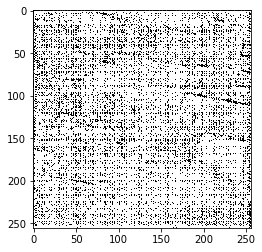

./AerialImageDataset/test/images_split/roof/innsbruck19_09_19.tiff


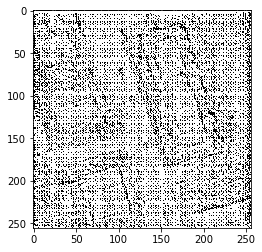

./AerialImageDataset/test/images_split/roof/innsbruck19_05_06.tiff


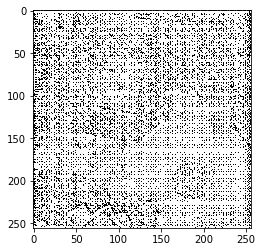

./AerialImageDataset/test/images_split/roof/sfo36_20_14.tiff


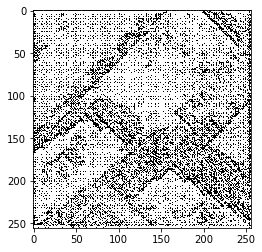

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_14_12.tiff


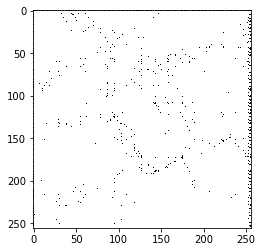

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_20_01.tiff


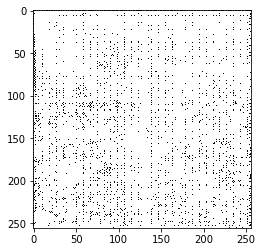

./AerialImageDataset/test/images_split/roof/sfo36_01_16.tiff


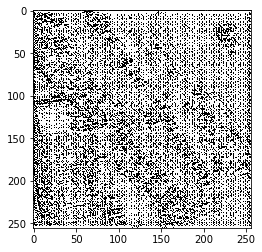

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_03_15.tiff


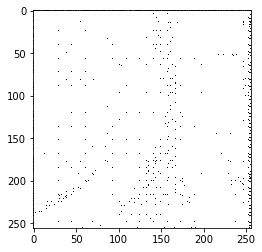

./AerialImageDataset/test/images_split/roof/innsbruck19_06_08.tiff


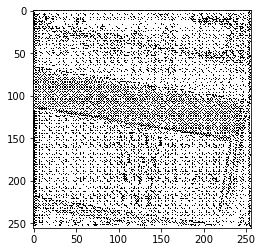

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_04_08.tiff


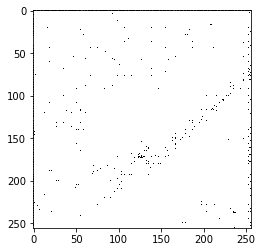

./AerialImageDataset/test/images_split/roof/innsbruck19_18_20.tiff


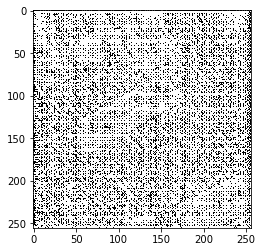

./AerialImageDataset/test/images_split/roof/bellingham11_15_02.tiff


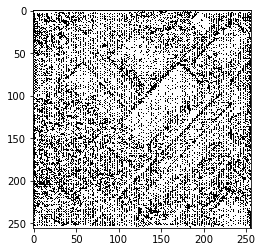

./AerialImageDataset/test/images_split/roof/sfo36_18_04.tiff


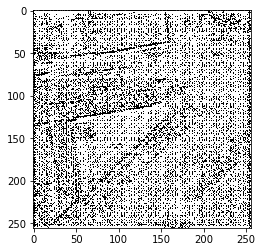

./AerialImageDataset/test/images_split/roof/innsbruck19_20_13.tiff


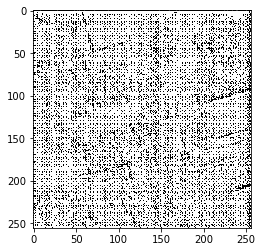

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_07_04.tiff


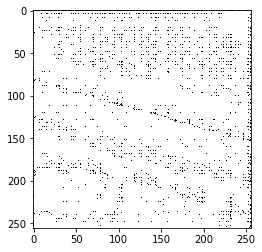

./AerialImageDataset/test/images_split/roof/bellingham11_12_03.tiff


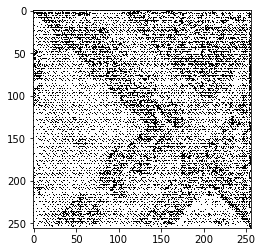

./AerialImageDataset/test/images_split/roof/sfo36_05_15.tiff


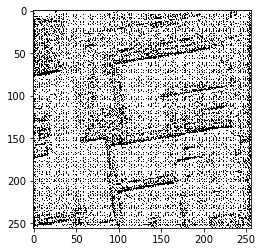

./AerialImageDataset/test/images_split/roof/innsbruck19_01_14.tiff


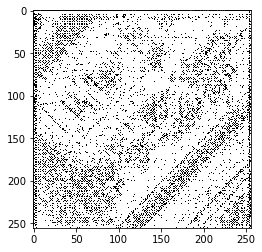

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_13_03.tiff


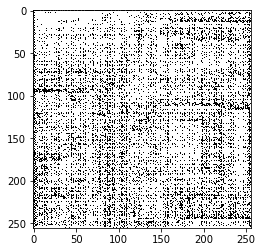

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_01_17.tiff


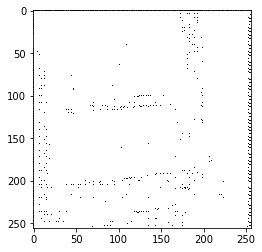

./AerialImageDataset/test/images_split/roof/innsbruck19_02_12.tiff


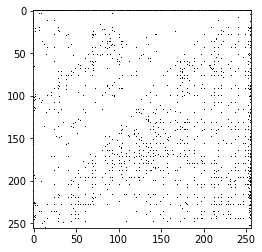

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_08_06.tiff


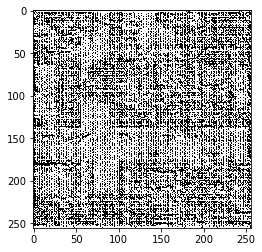

./AerialImageDataset/test/images_split/roof/sfo36_08_06.tiff


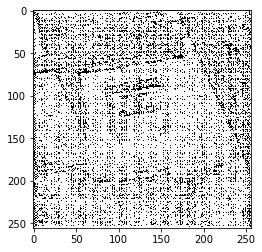

./AerialImageDataset/test/images_split/roof/innsbruck19_20_11.tiff


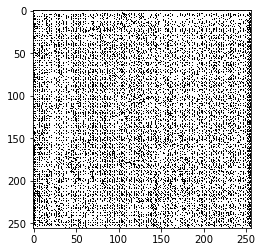

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_16_20.tiff


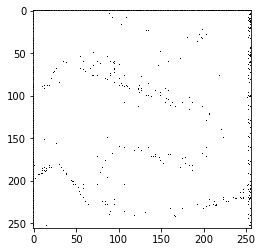

./AerialImageDataset/test/images_split/roof/bellingham11_05_18.tiff


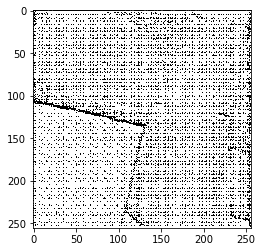

./AerialImageDataset/test/images_split/roof/sfo36_20_13.tiff


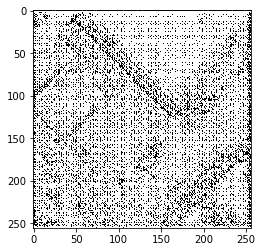

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_05_02.tiff


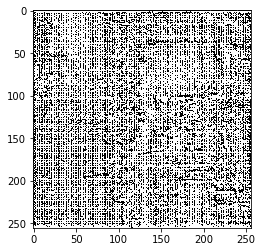

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_03_16.tiff


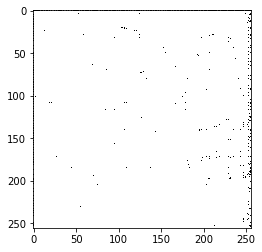

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_04_05.tiff


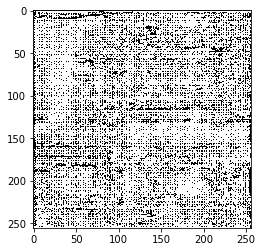

./AerialImageDataset/test/images_split/roof/sfo36_10_15.tiff


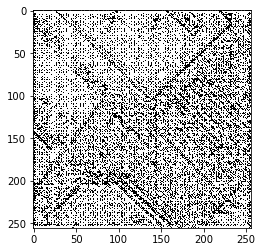

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_08_08.tiff


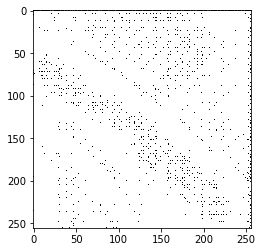

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_13_08.tiff


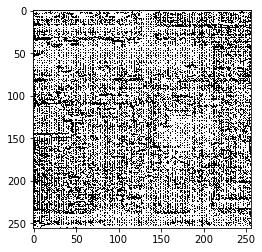

./AerialImageDataset/test/images_split/roof/innsbruck19_16_18.tiff


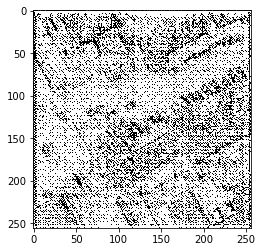

./AerialImageDataset/test/images_split/roof/bellingham11_13_08.tiff


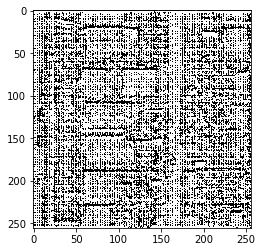

./AerialImageDataset/test/images_split/roof/innsbruck19_04_04.tiff


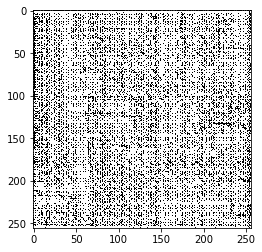

./AerialImageDataset/test/images_split/roof/bellingham11_06_07.tiff


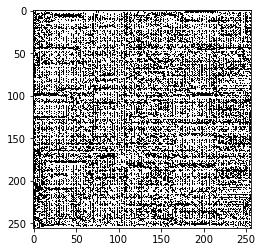

./AerialImageDataset/test/images_split/roof/sfo36_12_13.tiff


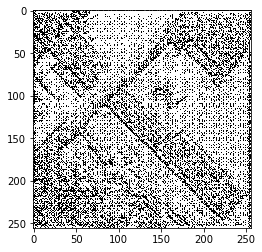

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_06_17.tiff


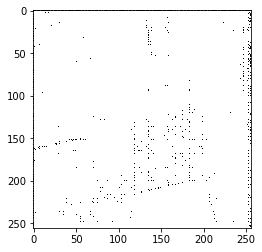

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_18_18.tiff


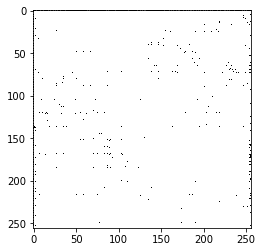

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_15_07.tiff


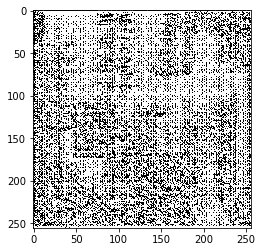

./AerialImageDataset/test/images_split/roof/sfo36_18_07.tiff


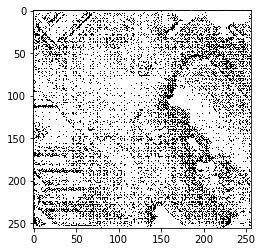

./AerialImageDataset/test/images_split/roof/innsbruck19_07_19.tiff


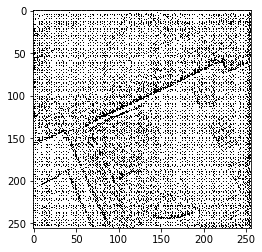

./AerialImageDataset/test/images_split/roof/sfo36_10_12.tiff


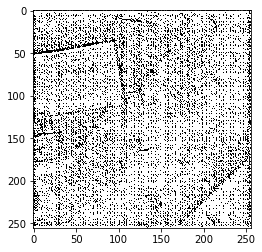

./AerialImageDataset/test/images_split/roof/bellingham11_07_17.tiff


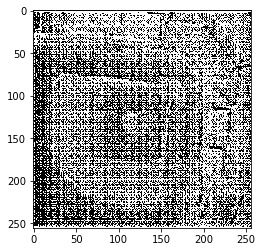

./AerialImageDataset/test/images_split/roof/sfo36_14_19.tiff


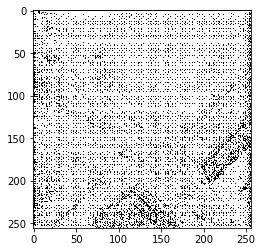

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_02_08.tiff


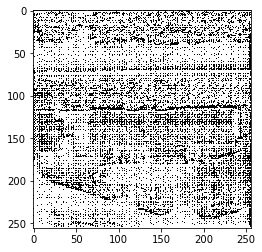

./AerialImageDataset/test/images_split/roof/sfo36_16_08.tiff


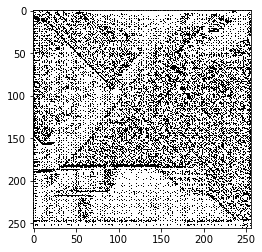

./AerialImageDataset/test/images_split/roof/bellingham11_16_12.tiff


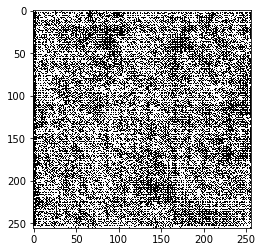

./AerialImageDataset/test/images_split/roof/bellingham11_16_04.tiff


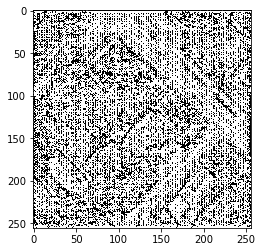

./AerialImageDataset/test/images_split/roof/sfo36_06_05.tiff


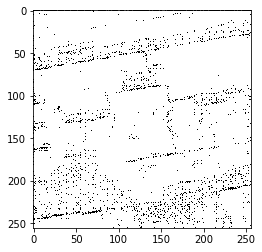

./AerialImageDataset/test/images_split/roof/sfo36_20_04.tiff


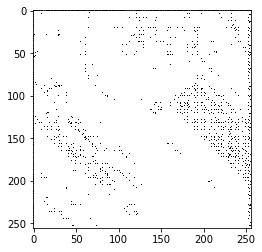

./AerialImageDataset/test/images_split/roof/sfo36_18_17.tiff


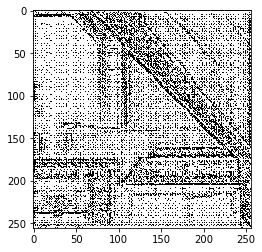

./AerialImageDataset/test/images_split/roof/innsbruck19_09_05.tiff


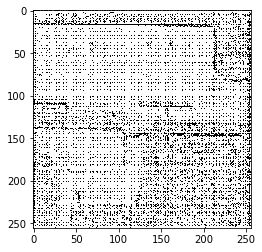

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_17_04.tiff


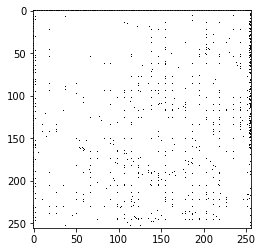

./AerialImageDataset/test/images_split/roof/sfo36_08_19.tiff


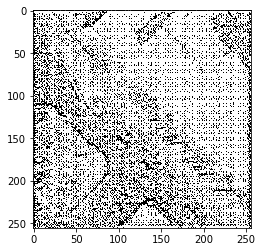

./AerialImageDataset/test/images_split/roof/innsbruck19_05_14.tiff


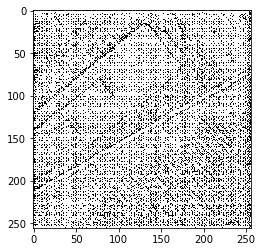

./AerialImageDataset/test/images_split/roof/bellingham11_01_15.tiff


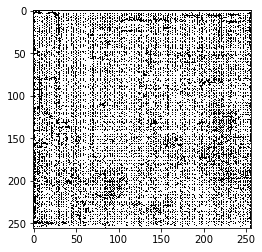

./AerialImageDataset/test/images_split/roof/innsbruck19_12_05.tiff


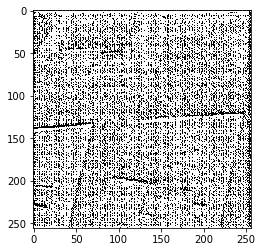

./AerialImageDataset/test/images_split/roof/bellingham11_20_12.tiff


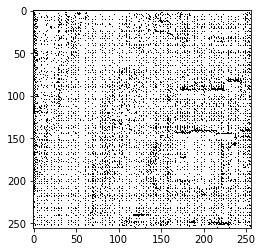

./AerialImageDataset/test/images_split/roof/innsbruck19_13_16.tiff


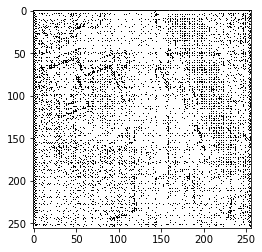

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_14_07.tiff


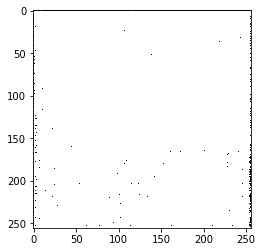

./AerialImageDataset/test/images_split/roof/sfo36_13_08.tiff


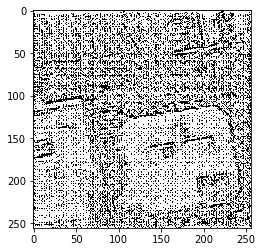

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_05_10.tiff


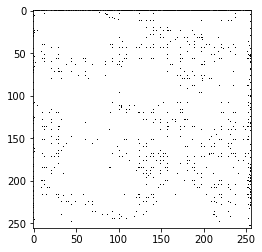

./AerialImageDataset/test/images_split/roof/sfo36_03_19.tiff


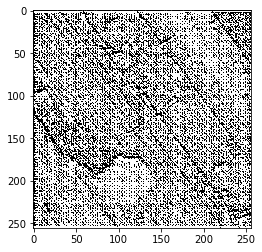

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_06_15.tiff


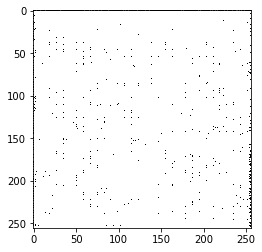

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_03_15.tiff


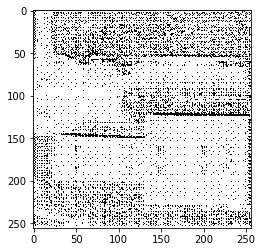

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_10_01.tiff


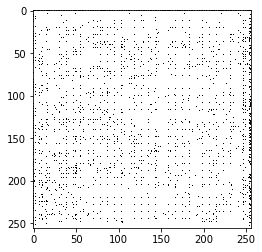

./AerialImageDataset/test/images_split/roof/sfo36_06_08.tiff


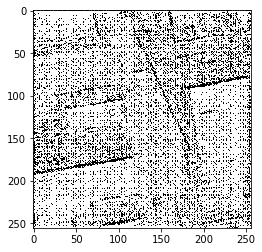

./AerialImageDataset/test/images_split/roof/sfo36_16_02.tiff


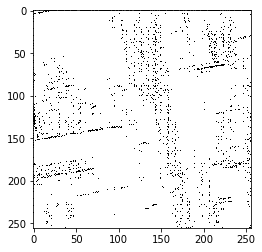

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_09_13.tiff


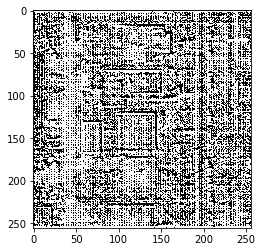

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_15_08.tiff


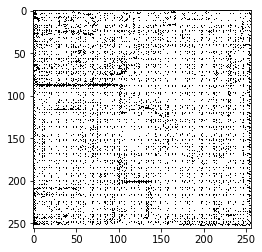

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_11_12.tiff


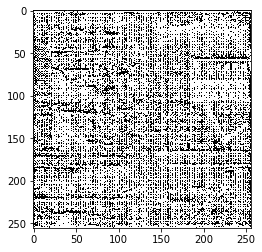

./AerialImageDataset/test/images_split/roof/innsbruck19_13_04.tiff


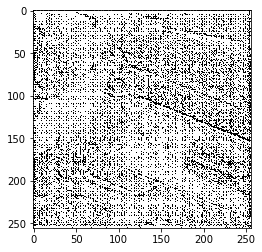

./AerialImageDataset/test/images_split/roof/bellingham11_10_15.tiff


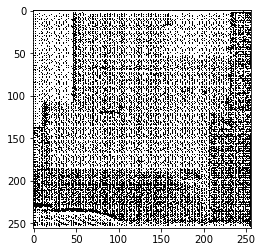

./AerialImageDataset/test/images_split/roof/innsbruck19_15_06.tiff


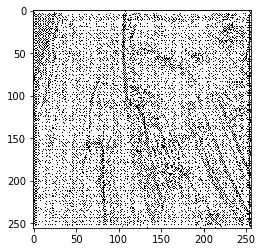

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_20_07.tiff


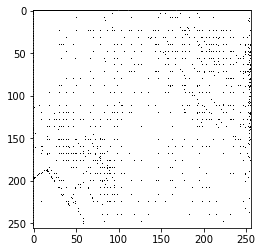

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_02_12.tiff


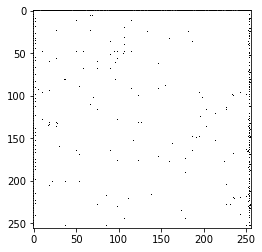

./AerialImageDataset/test/images_split/roof/innsbruck19_10_03.tiff


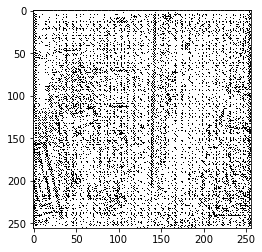

./AerialImageDataset/test/images_split/roof/bellingham11_20_18.tiff


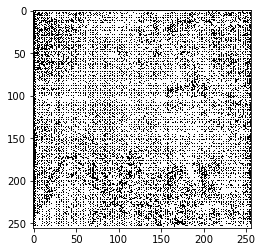

./AerialImageDataset/test/images_split/roof/innsbruck19_07_05.tiff


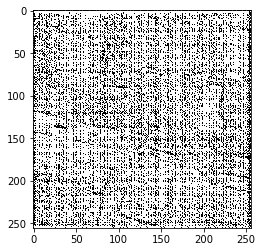

./AerialImageDataset/test/images_split/roof/bellingham11_10_07.tiff


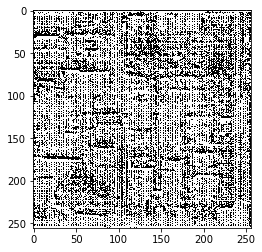

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_13_17.tiff


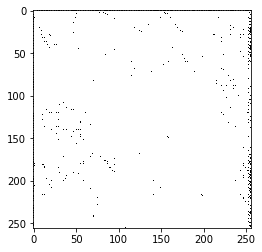

./AerialImageDataset/test/images_split/roof/innsbruck19_20_10.tiff


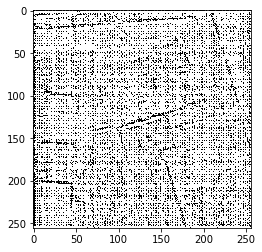

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_12_08.tiff


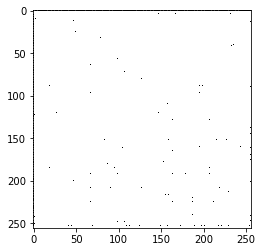

./AerialImageDataset/test/images_split/roof/sfo36_05_13.tiff


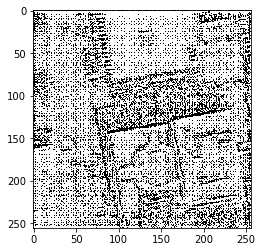

./AerialImageDataset/test/images_split/roof/sfo36_04_17.tiff


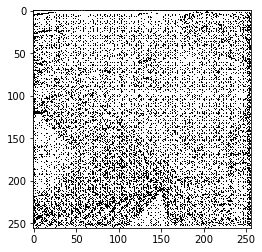

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_12_06.tiff


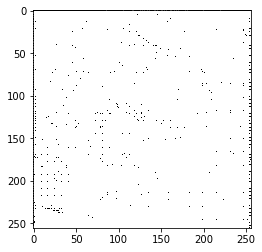

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_14_20.tiff


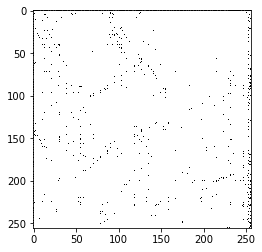

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_17_11.tiff


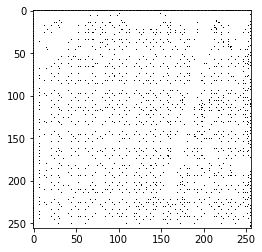

./AerialImageDataset/test/images_split/roof/innsbruck19_14_11.tiff


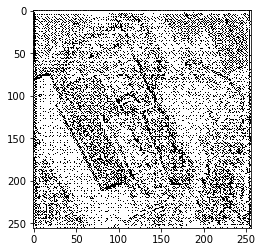

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_01_08.tiff


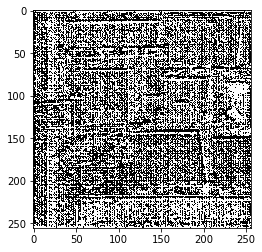

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_08_17.tiff


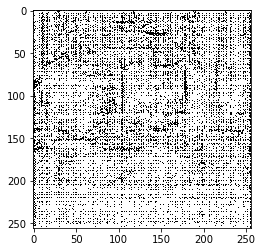

./AerialImageDataset/test/images_split/roof/innsbruck19_05_03.tiff


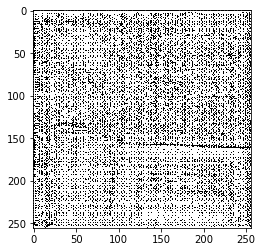

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_10_06.tiff


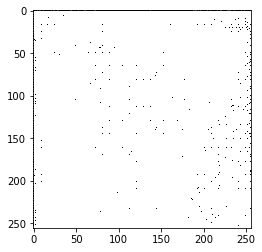

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_16_05.tiff


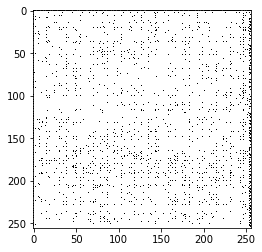

./AerialImageDataset/test/images_split/roof/sfo36_07_16.tiff


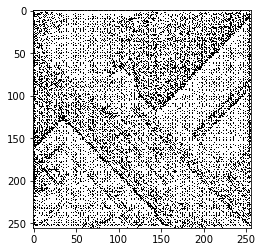

./AerialImageDataset/test/images_split/roof/sfo36_15_06.tiff


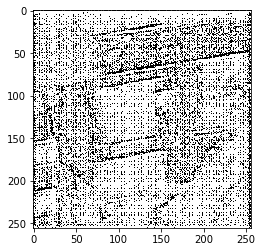

./AerialImageDataset/test/images_split/roof/sfo36_16_10.tiff


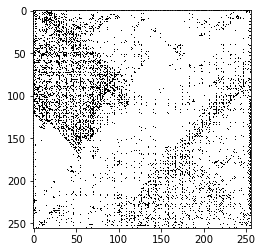

./AerialImageDataset/test/images_split/roof/bellingham11_17_18.tiff


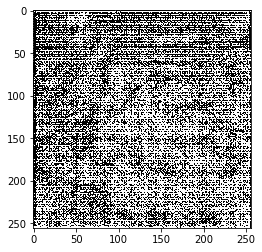

./AerialImageDataset/test/images_split/roof/bellingham11_08_15.tiff


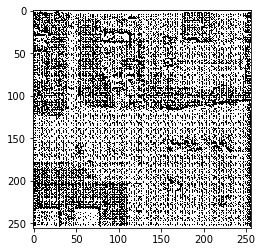

./AerialImageDataset/test/images_split/roof/innsbruck19_07_10.tiff


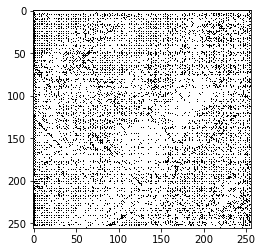

./AerialImageDataset/test/images_split/roof/innsbruck19_04_17.tiff


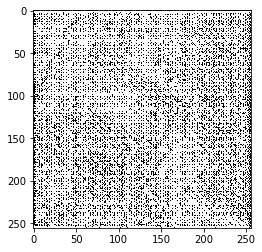

./AerialImageDataset/test/images_split/roof/innsbruck19_18_16.tiff


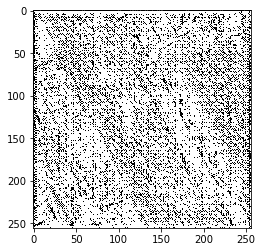

./AerialImageDataset/test/images_split/roof/sfo36_07_17.tiff


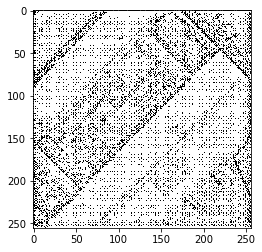

./AerialImageDataset/test/images_split/roof/bellingham11_12_12.tiff


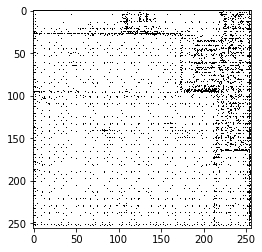

./AerialImageDataset/test/images_split/roof/innsbruck19_04_07.tiff


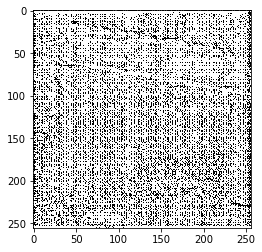

./AerialImageDataset/test/images_split/roof/bellingham11_19_11.tiff


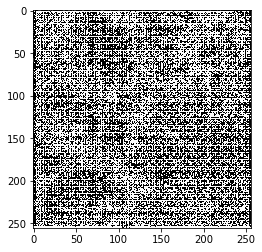

./AerialImageDataset/test/images_split/roof/bellingham11_19_08.tiff


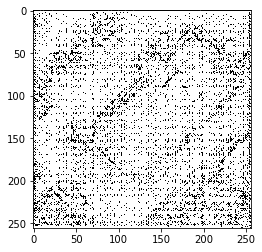

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_15_16.tiff


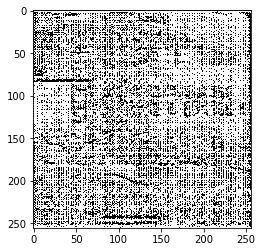

./AerialImageDataset/test/images_split/roof/innsbruck19_17_06.tiff


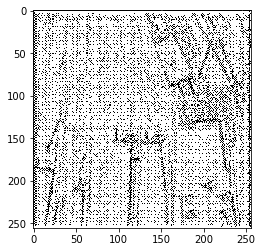

./AerialImageDataset/test/images_split/roof/sfo36_05_16.tiff


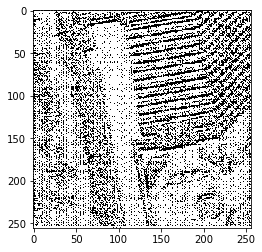

./AerialImageDataset/test/images_split/roof/sfo36_13_20.tiff


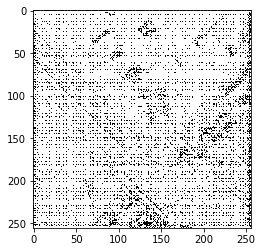

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_04_02.tiff


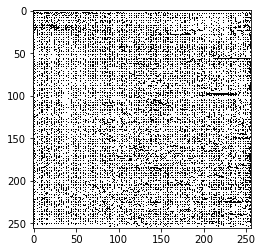

./AerialImageDataset/test/images_split/roof/innsbruck19_15_07.tiff


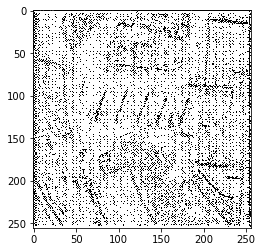

./AerialImageDataset/test/images_split/roof/innsbruck19_08_03.tiff


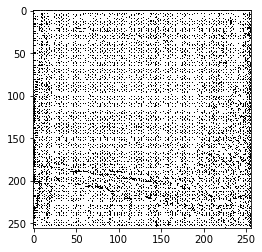

./AerialImageDataset/test/images_split/roof/sfo36_18_19.tiff


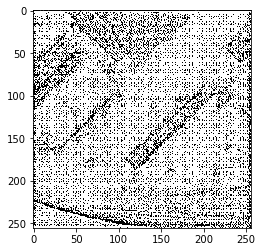

./AerialImageDataset/test/images_split/roof/bellingham11_13_06.tiff


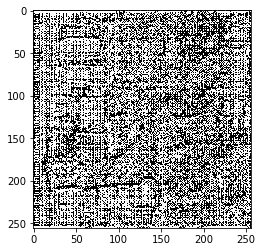

./AerialImageDataset/test/images_split/roof/innsbruck19_05_19.tiff


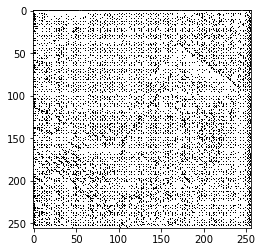

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_12_01.tiff


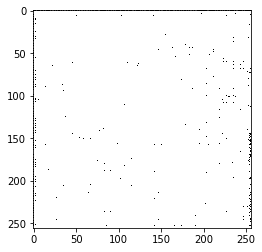

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_05_16.tiff


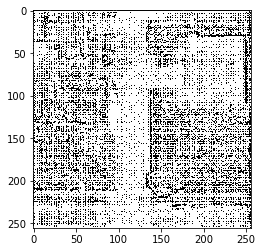

./AerialImageDataset/test/images_split/roof/bellingham11_03_05.tiff


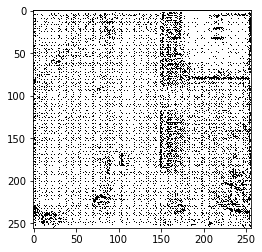

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_05_03.tiff


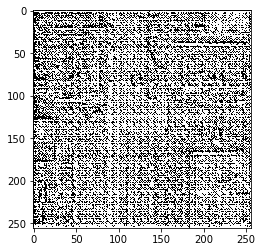

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_01_02.tiff


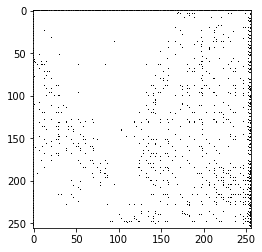

./AerialImageDataset/test/images_split/roof/bellingham11_16_18.tiff


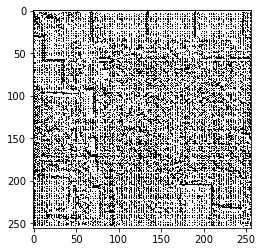

./AerialImageDataset/test/images_split/roof/sfo36_02_06.tiff


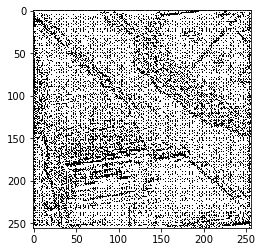

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_02_11.tiff


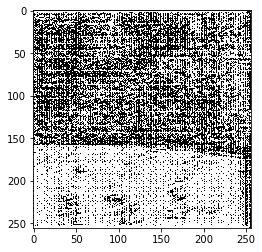

./AerialImageDataset/test/images_split/roof/bellingham11_20_08.tiff


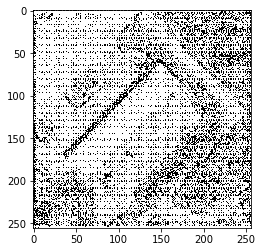

./AerialImageDataset/test/images_split/roof/innsbruck19_06_20.tiff


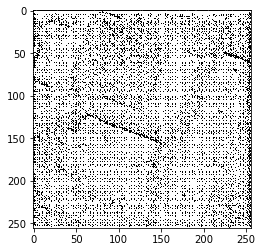

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_08_14.tiff


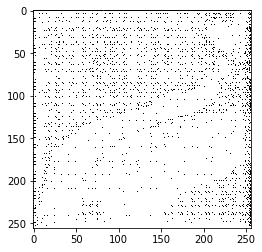

./AerialImageDataset/test/images_split/roof/sfo36_12_14.tiff


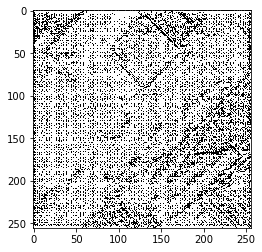

./AerialImageDataset/test/images_split/roof/innsbruck19_11_06.tiff


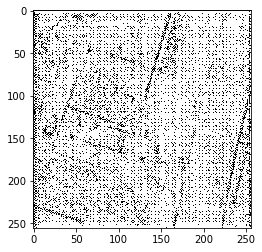

./AerialImageDataset/test/images_split/roof/innsbruck19_02_03.tiff


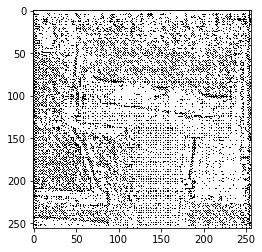

./AerialImageDataset/test/images_split/roof/bellingham11_02_07.tiff


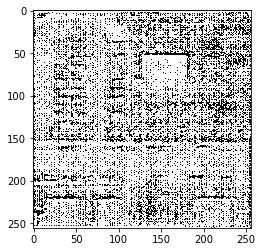

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_02_09.tiff


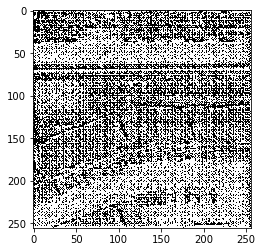

./AerialImageDataset/test/images_split/roof/sfo36_09_20.tiff


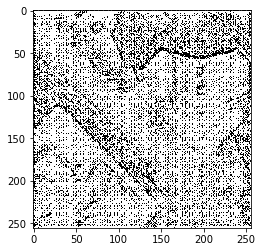

./AerialImageDataset/test/images_split/roof/sfo36_16_19.tiff


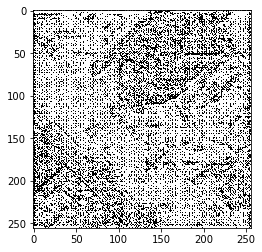

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_09_17.tiff


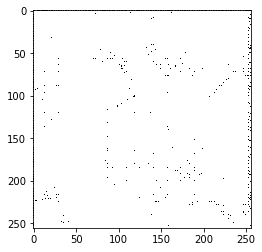

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_02_03.tiff


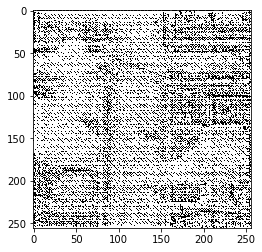

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_14_05.tiff


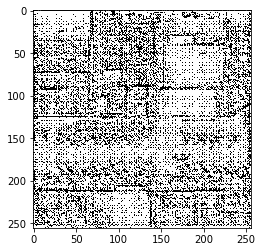

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_12_11.tiff


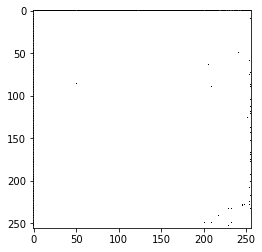

./AerialImageDataset/test/images_split/roof/innsbruck19_14_01.tiff


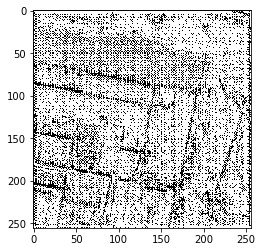

./AerialImageDataset/test/images_split/roof/innsbruck19_07_20.tiff


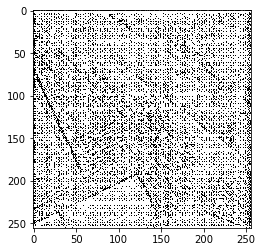

./AerialImageDataset/test/images_split/roof/innsbruck19_20_02.tiff


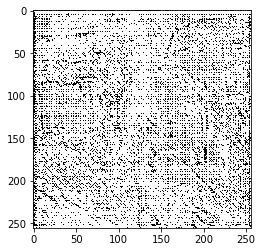

./AerialImageDataset/test/images_split/roof/bellingham11_17_05.tiff


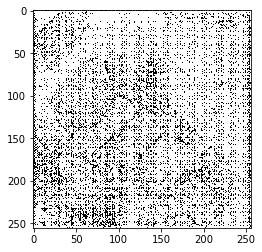

./AerialImageDataset/test/images_split/roof/sfo36_14_16.tiff


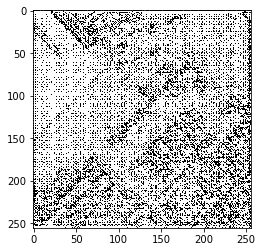

./AerialImageDataset/test/images_split/roof/sfo36_14_03.tiff


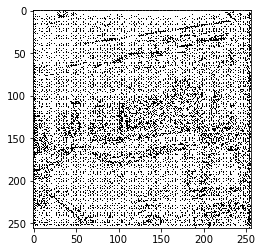

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_09_07.tiff


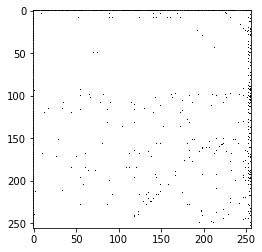

./AerialImageDataset/test/images_split/roof/bellingham11_08_07.tiff


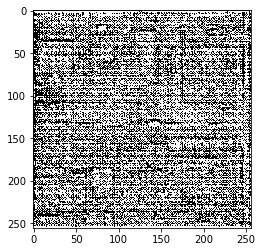

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_14_10.tiff


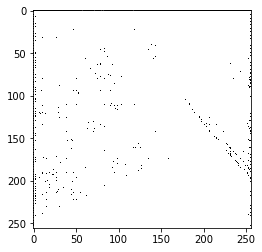

./AerialImageDataset/test/images_split/roof/bellingham11_05_05.tiff


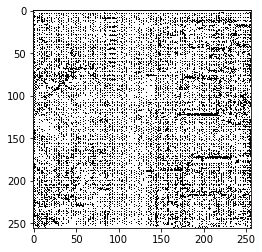

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_20_02.tiff


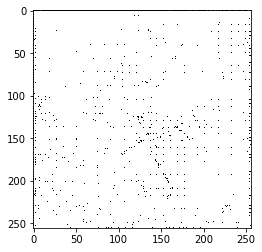

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_03_19.tiff


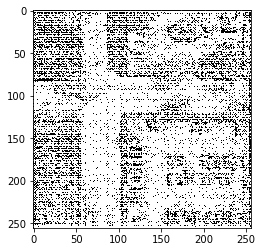

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_12_05.tiff


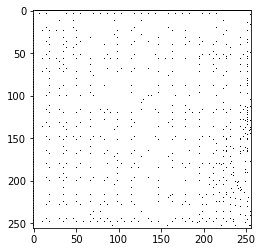

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_04_13.tiff


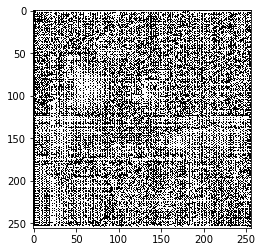

./AerialImageDataset/test/images_split/roof/sfo36_14_06.tiff


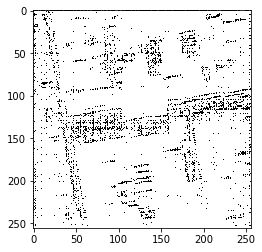

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_10_20.tiff


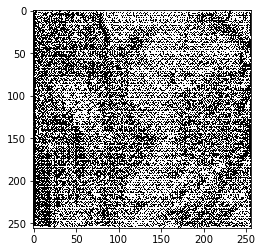

./AerialImageDataset/test/images_split/roof/sfo36_09_13.tiff


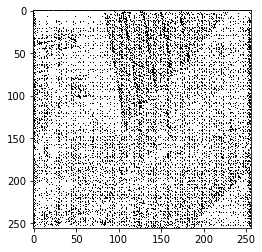

./AerialImageDataset/test/images_split/roof/innsbruck19_18_14.tiff


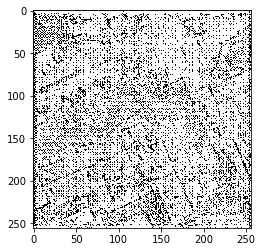

./AerialImageDataset/test/images_split/roof/innsbruck19_12_03.tiff


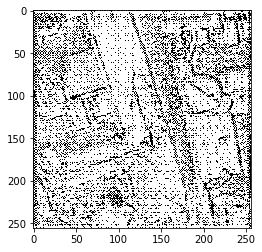

./AerialImageDataset/test/images_split/roof/sfo36_04_19.tiff


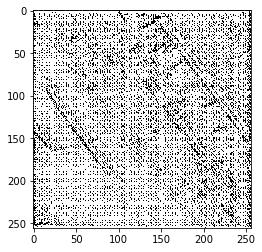

./AerialImageDataset/test/images_split/roof/sfo36_16_06.tiff


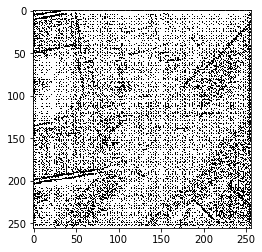

./AerialImageDataset/test/images_split/roof/sfo36_01_11.tiff


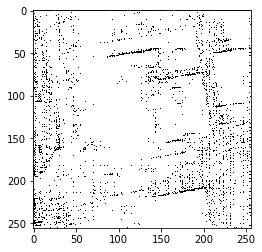

./AerialImageDataset/test/images_split/roof/bellingham11_20_14.tiff


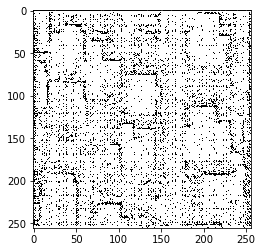

./AerialImageDataset/test/images_split/roof/bellingham11_17_15.tiff


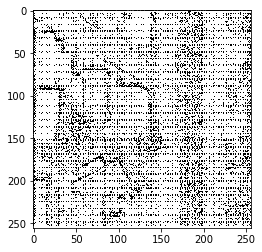

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_15_19.tiff


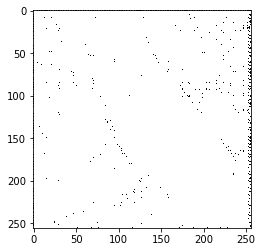

./AerialImageDataset/test/images_split/roof/bellingham11_05_11.tiff


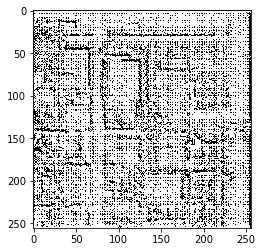

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_20_03.tiff


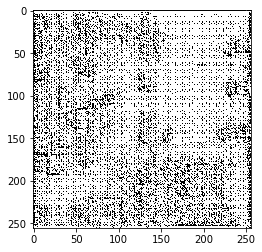

./AerialImageDataset/test/images_split/roof/sfo36_09_09.tiff


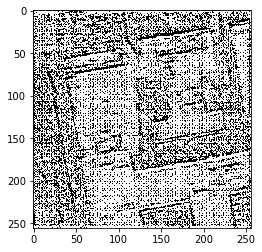

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_08_12.tiff


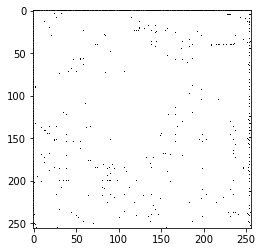

./AerialImageDataset/test/images_split/roof/bellingham11_19_05.tiff


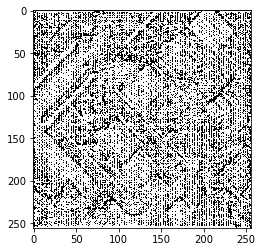

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_17_15.tiff


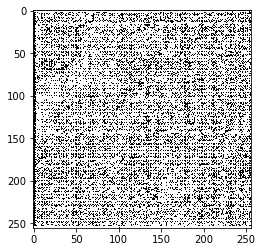

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_05_09.tiff


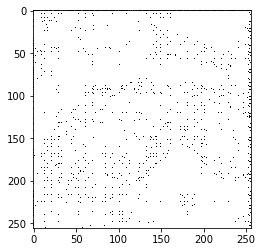

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_12_07.tiff


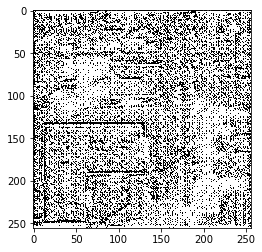

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_10_15.tiff


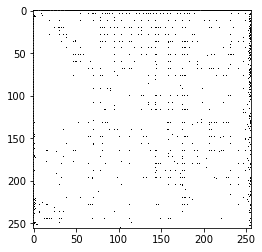

./AerialImageDataset/test/images_split/roof/innsbruck19_05_05.tiff


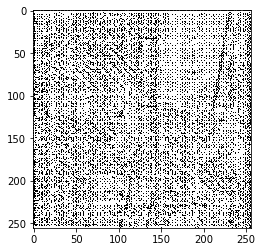

./AerialImageDataset/test/images_split/roof/bellingham11_11_18.tiff


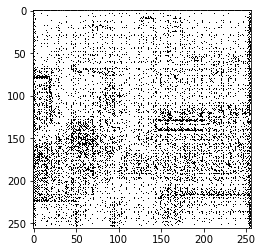

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_05_15.tiff


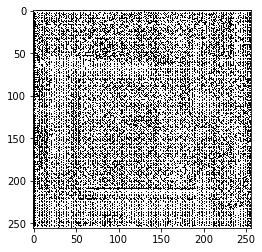

./AerialImageDataset/test/images_split/roof/sfo36_17_10.tiff


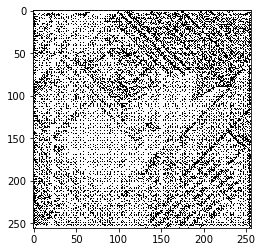

./AerialImageDataset/test/images_split/roof/innsbruck19_18_07.tiff


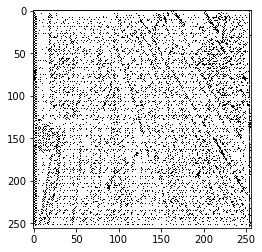

./AerialImageDataset/test/images_split/roof/sfo36_03_03.tiff


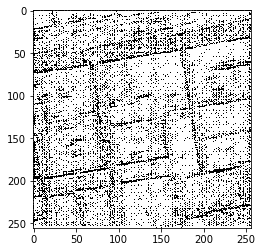

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_13_02.tiff


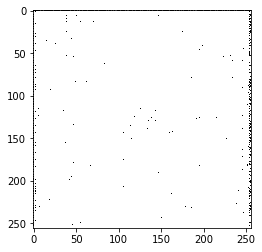

./AerialImageDataset/test/images_split/roof/sfo36_07_09.tiff


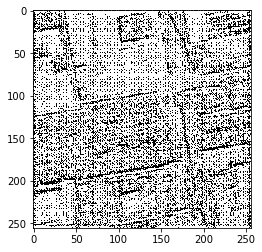

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_09_18.tiff


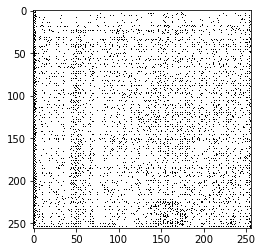

./AerialImageDataset/test/images_split/roof/innsbruck19_09_13.tiff


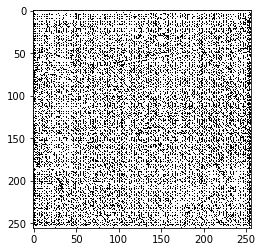

./AerialImageDataset/test/images_split/roof/sfo36_11_12.tiff


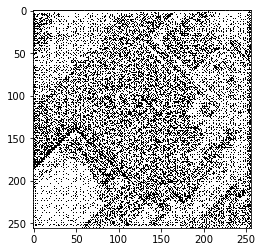

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_13_09.tiff


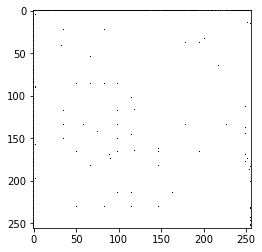

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_14_17.tiff


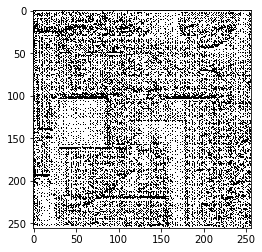

./AerialImageDataset/test/images_split/roof/sfo36_16_05.tiff


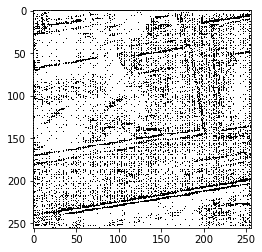

./AerialImageDataset/test/images_split/roof/innsbruck19_08_09.tiff


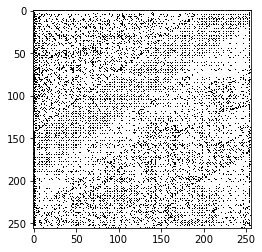

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_02_20.tiff


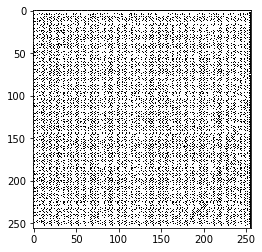

./AerialImageDataset/test/images_split/roof/sfo36_08_13.tiff


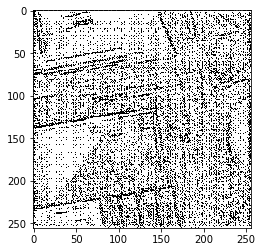

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_13_18.tiff


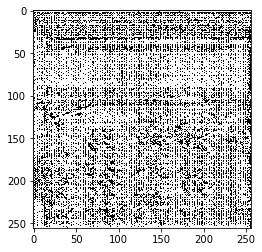

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_02_17.tiff


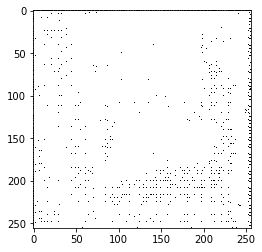

./AerialImageDataset/test/images_split/roof/sfo36_02_20.tiff


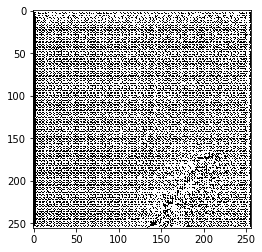

./AerialImageDataset/test/images_split/roof/innsbruck19_16_11.tiff


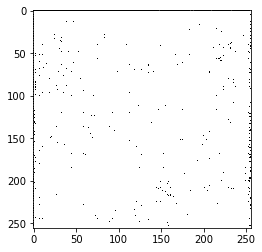

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_09_16.tiff


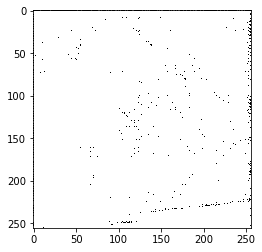

./AerialImageDataset/test/images_split/roof/innsbruck19_15_18.tiff


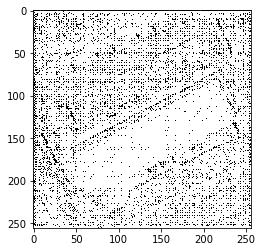

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_18_13.tiff


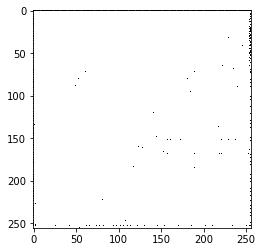

./AerialImageDataset/test/images_split/roof/bellingham11_02_16.tiff


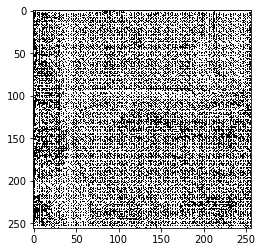

./AerialImageDataset/test/images_split/roof/sfo36_19_12.tiff


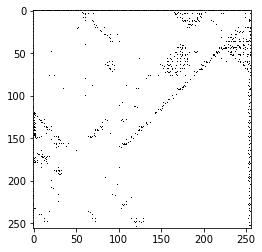

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_11_18.tiff


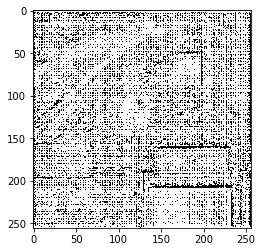

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_05_15.tiff


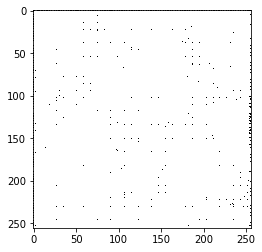

./AerialImageDataset/test/images_split/roof/bellingham11_15_20.tiff


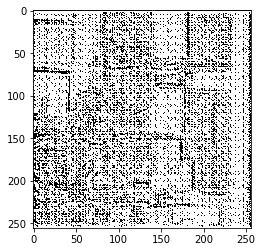

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_14_08.tiff


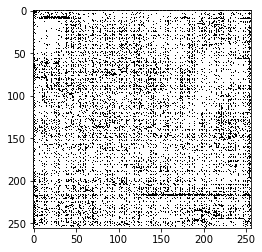

./AerialImageDataset/test/images_split/roof/innsbruck19_19_13.tiff


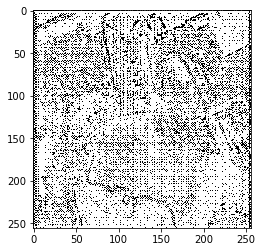

./AerialImageDataset/test/images_split/roof/innsbruck19_03_01.tiff


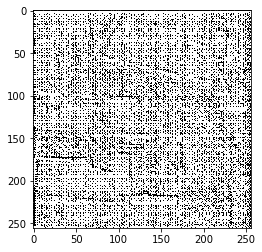

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_01_04.tiff


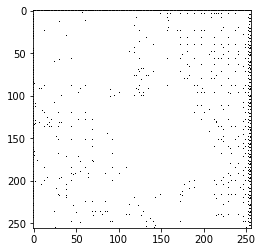

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_05_14.tiff


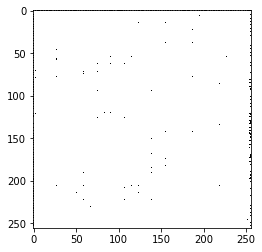

./AerialImageDataset/test/images_split/roof/innsbruck19_14_09.tiff


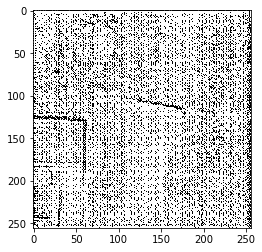

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_19_15.tiff


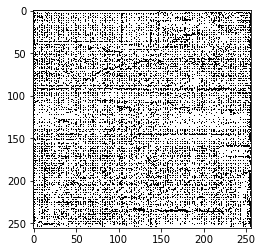

./AerialImageDataset/test/images_split/roof/innsbruck19_17_12.tiff


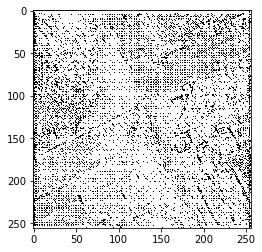

./AerialImageDataset/test/images_split/roof/bellingham11_16_02.tiff


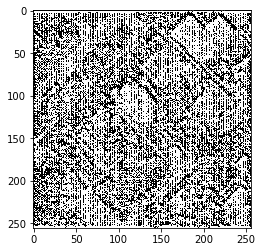

./AerialImageDataset/test/images_split/roof/innsbruck19_03_08.tiff


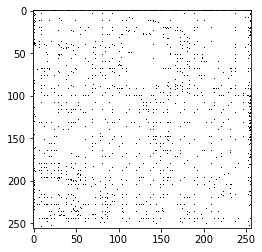

./AerialImageDataset/test/images_split/roof/bellingham11_16_08.tiff


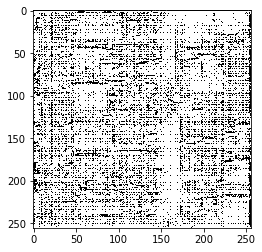

./AerialImageDataset/test/images_split/roof/bellingham11_06_03.tiff


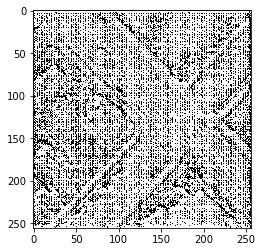

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_18_20.tiff


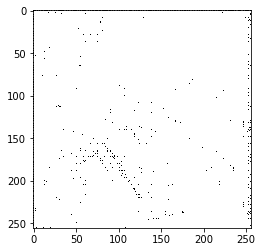

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_16_08.tiff


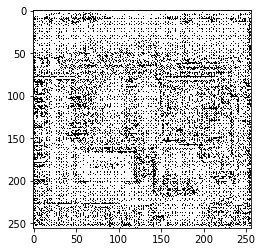

./AerialImageDataset/test/images_split/roof/bellingham11_14_10.tiff


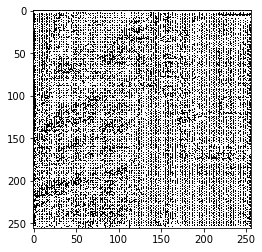

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_10_18.tiff


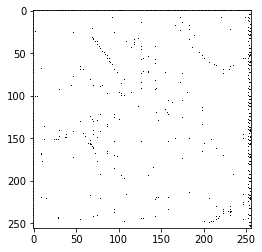

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_14_11.tiff


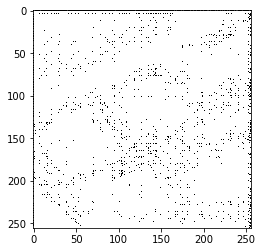

./AerialImageDataset/test/images_split/roof/bellingham11_14_06.tiff


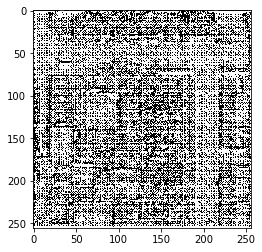

./AerialImageDataset/test/images_split/roof/bellingham11_20_11.tiff


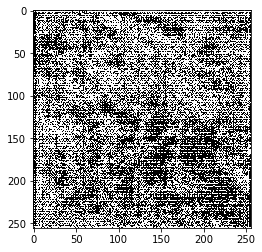

./AerialImageDataset/test/images_split/roof/innsbruck19_06_14.tiff


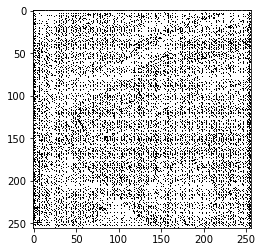

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_11_10.tiff


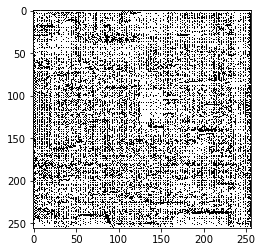

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_19_08.tiff


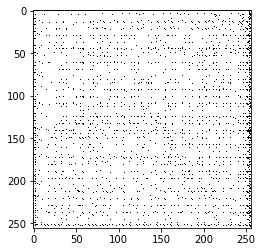

./AerialImageDataset/test/images_split/roof/innsbruck19_10_01.tiff


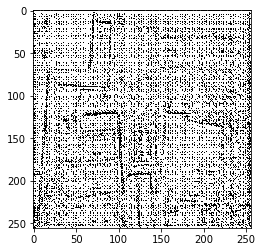

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_20_17.tiff


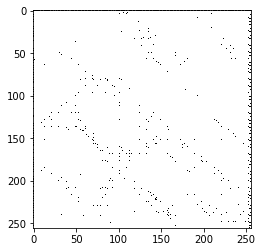

./AerialImageDataset/test/images_split/roof/sfo36_03_05.tiff


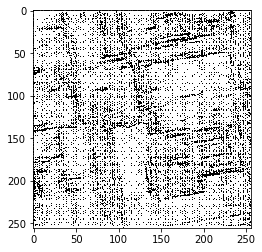

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_20_08.tiff


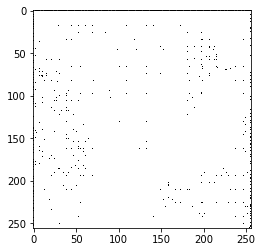

./AerialImageDataset/test/images_split/roof/sfo36_08_02.tiff


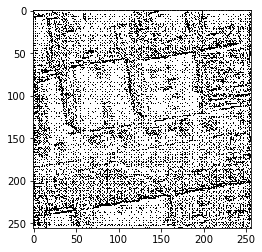

./AerialImageDataset/test/images_split/roof/bellingham11_19_20.tiff


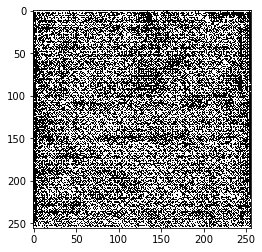

./AerialImageDataset/test/images_split/roof/bellingham11_09_02.tiff


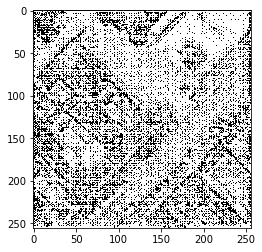

./AerialImageDataset/test/images_split/roof/sfo36_14_20.tiff


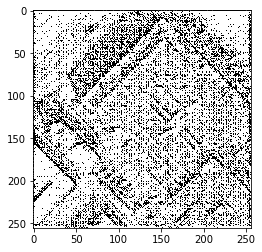

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_09_09.tiff


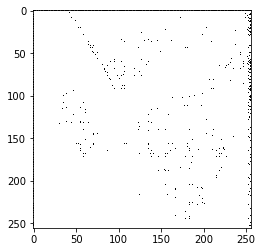

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_01_03.tiff


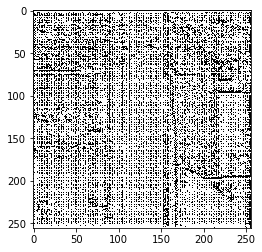

./AerialImageDataset/test/images_split/roof/innsbruck19_11_03.tiff


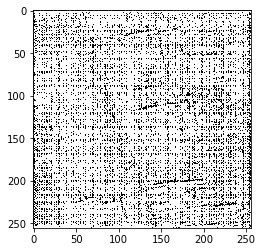

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_10_13.tiff


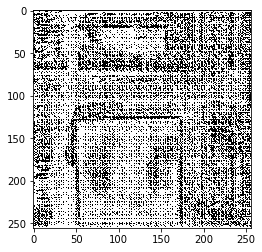

./AerialImageDataset/test/images_split/roof/sfo36_09_12.tiff


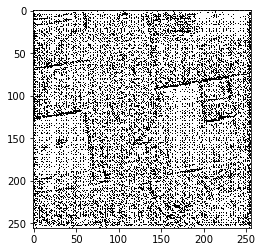

./AerialImageDataset/test/images_split/roof/sfo36_17_15.tiff


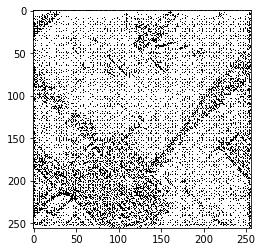

./AerialImageDataset/test/images_split/roof/bellingham11_19_07.tiff


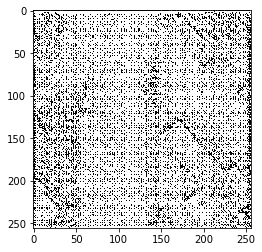

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_01_01.tiff


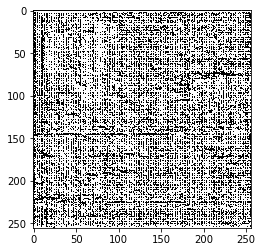

./AerialImageDataset/test/images_split/roof/sfo36_20_05.tiff


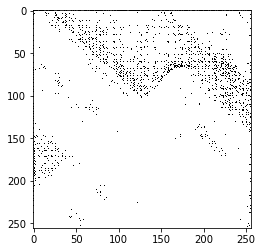

./AerialImageDataset/test/images_split/roof/sfo36_07_02.tiff


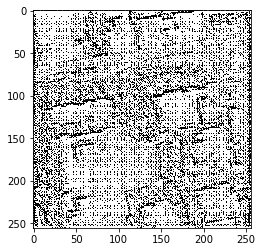

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_08_16.tiff


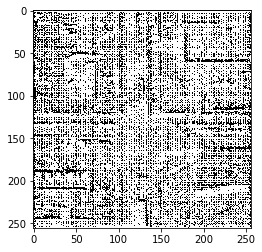

./AerialImageDataset/test/images_split/roof/innsbruck19_16_10.tiff


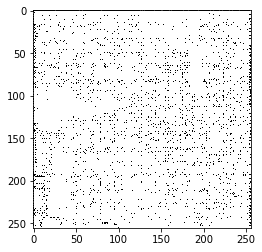

./AerialImageDataset/test/images_split/roof/innsbruck19_16_02.tiff


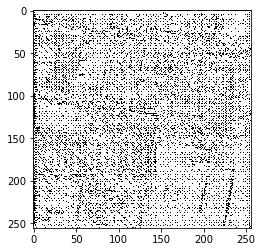

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_04_03.tiff


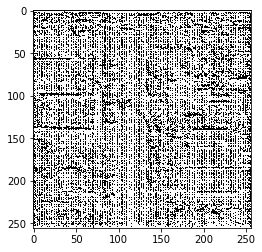

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_02_06.tiff


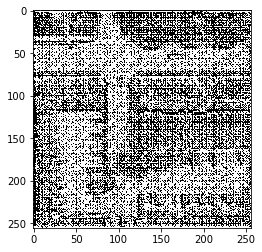

./AerialImageDataset/test/images_split/roof/sfo36_02_02.tiff


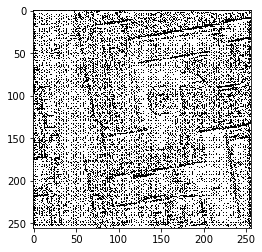

./AerialImageDataset/test/images_split/roof/bellingham11_13_13.tiff


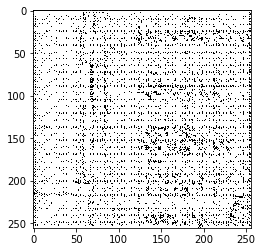

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_14_06.tiff


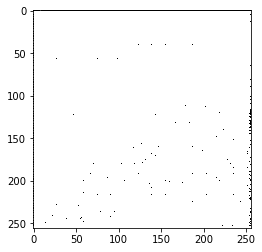

./AerialImageDataset/test/images_split/roof/innsbruck19_14_15.tiff


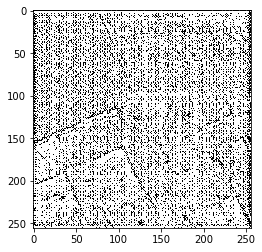

./AerialImageDataset/test/images_split/roof/sfo36_06_06.tiff


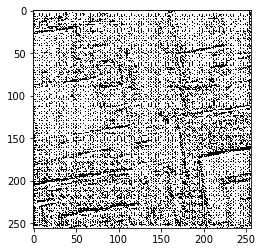

./AerialImageDataset/test/images_split/roof/innsbruck19_13_08.tiff


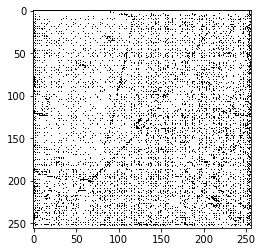

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_05_01.tiff


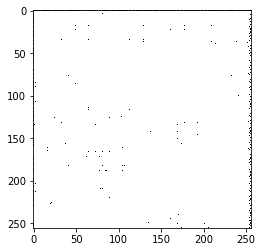

./AerialImageDataset/test/images_split/roof/innsbruck19_15_01.tiff


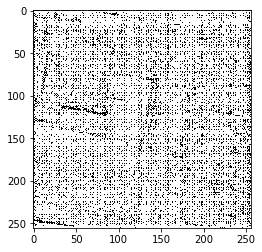

./AerialImageDataset/test/images_split/roof/sfo36_09_16.tiff


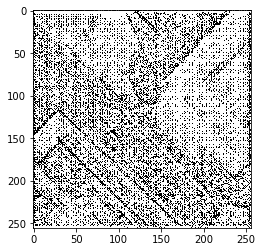

./AerialImageDataset/test/images_split/roof/bellingham11_11_12.tiff


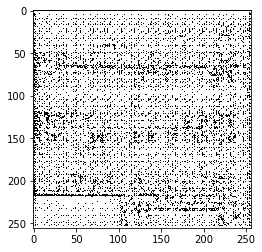

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_08_20.tiff


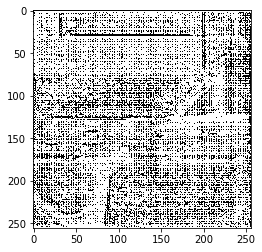

./AerialImageDataset/test/images_split/roof/bellingham11_05_08.tiff


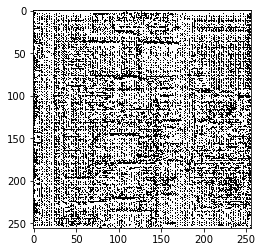

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_07_01.tiff


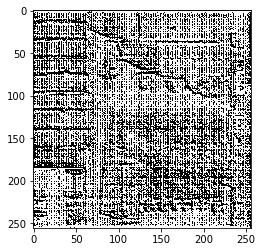

./AerialImageDataset/test/images_split/roof/sfo36_16_04.tiff


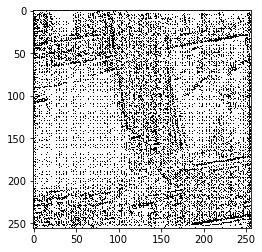

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_13_05.tiff


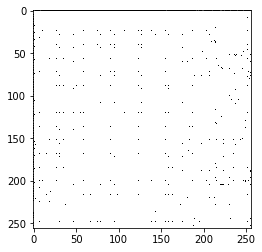

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_07_11.tiff


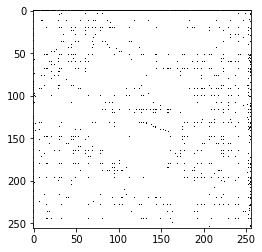

./AerialImageDataset/test/images_split/roof/bellingham11_02_19.tiff


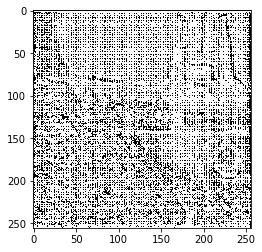

./AerialImageDataset/test/images_split/roof/sfo36_15_05.tiff


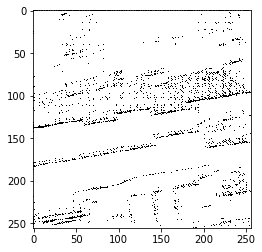

./AerialImageDataset/test/images_split/roof/bellingham11_01_14.tiff


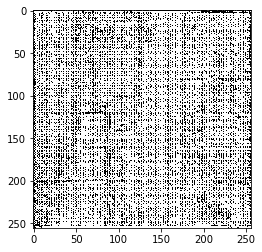

./AerialImageDataset/test/images_split/roof/bellingham11_16_15.tiff


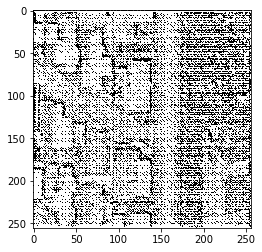

./AerialImageDataset/test/images_split/roof/bellingham11_20_02.tiff


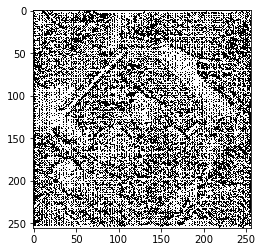

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_12_20.tiff


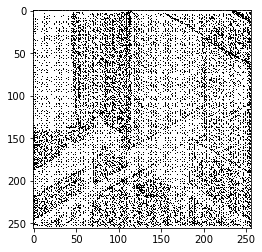

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_08_04.tiff


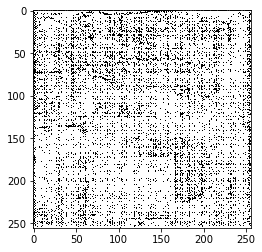

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_13_16.tiff


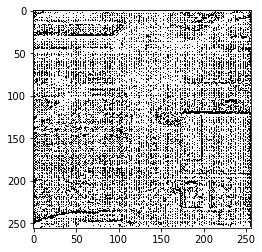

./AerialImageDataset/test/images_split/roof/innsbruck19_04_14.tiff


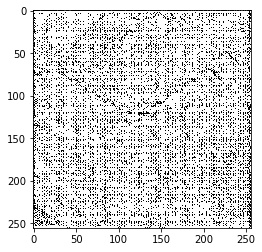

./AerialImageDataset/test/images_split/roof/innsbruck19_07_13.tiff


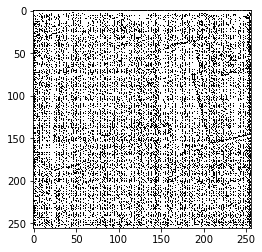

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_04_15.tiff


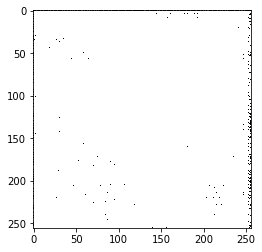

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_07_05.tiff


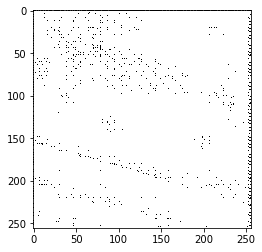

./AerialImageDataset/test/images_split/roof/sfo36_05_19.tiff


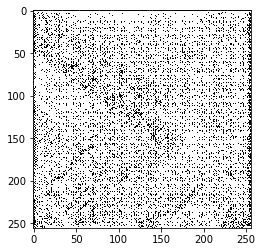

./AerialImageDataset/test/images_split/roof/bellingham11_10_20.tiff


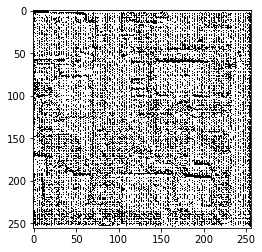

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_11_01.tiff


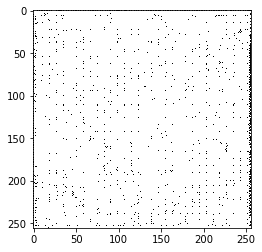

./AerialImageDataset/test/images_split/roof/bellingham11_17_02.tiff


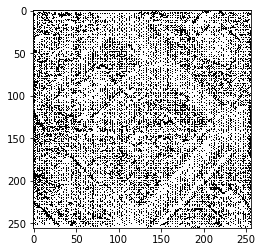

./AerialImageDataset/test/images_split/roof/sfo36_15_12.tiff


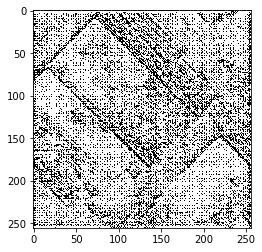

./AerialImageDataset/test/images_split/roof/bellingham11_15_08.tiff


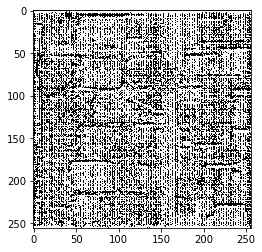

./AerialImageDataset/test/images_split/roof/innsbruck19_20_07.tiff


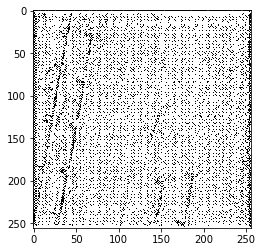

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_10_05.tiff


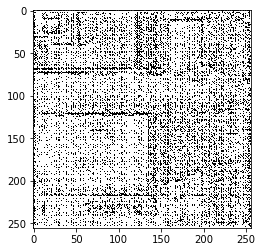

./AerialImageDataset/test/images_split/roof/innsbruck19_19_14.tiff


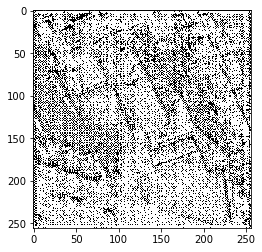

./AerialImageDataset/test/images_split/roof/innsbruck19_20_14.tiff


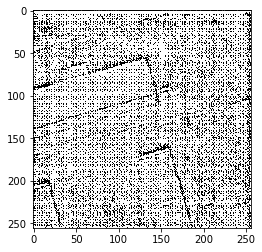

./AerialImageDataset/test/images_split/roof/sfo36_06_12.tiff


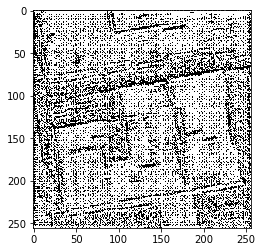

./AerialImageDataset/test/images_split/roof/sfo36_08_05.tiff


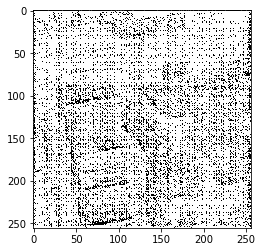

./AerialImageDataset/test/images_split/roof/bellingham11_03_01.tiff


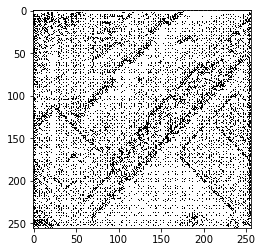

./AerialImageDataset/test/images_split/roof/innsbruck19_08_08.tiff


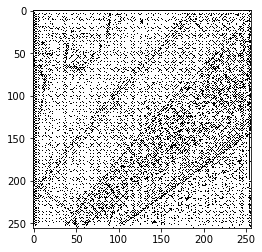

./AerialImageDataset/test/images_split/roof/innsbruck19_05_10.tiff


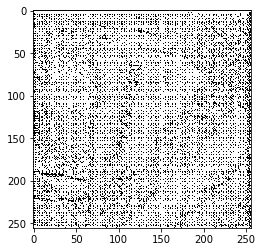

./AerialImageDataset/test/images_split/roof/bellingham11_15_14.tiff


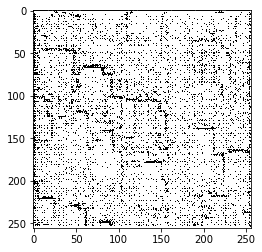

./AerialImageDataset/test/images_split/roof/bellingham11_14_20.tiff


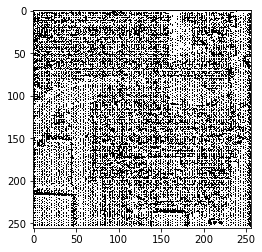

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_03_07.tiff


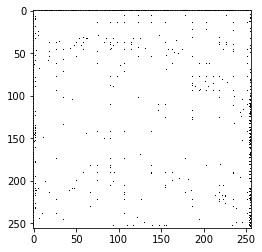

./AerialImageDataset/test/images_split/roof/sfo36_17_05.tiff


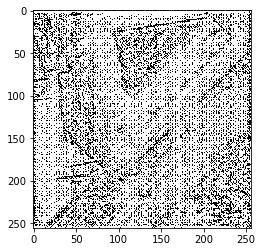

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_20_05.tiff


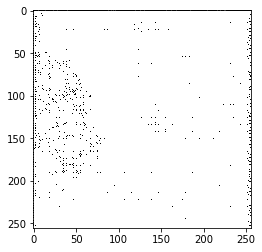

./AerialImageDataset/test/images_split/roof/innsbruck19_01_09.tiff


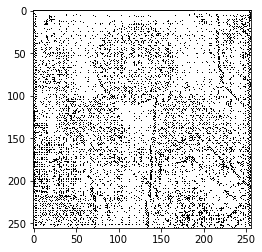

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_04_04.tiff


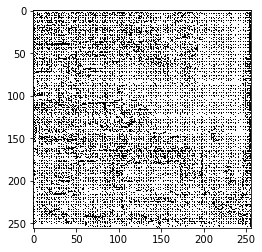

./AerialImageDataset/test/images_split/roof/innsbruck19_09_08.tiff


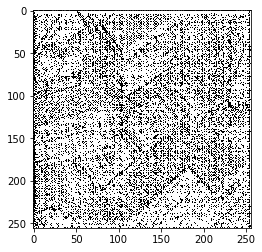

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_19_15.tiff


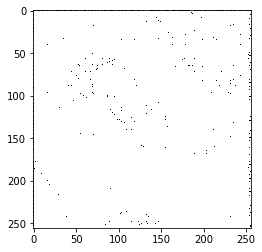

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_20_01.tiff


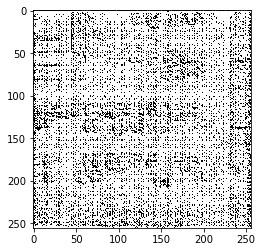

./AerialImageDataset/test/images_split/roof/bellingham11_03_17.tiff


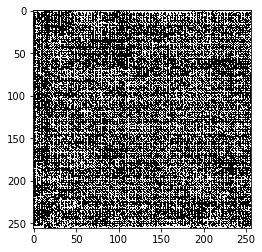

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_17_14.tiff


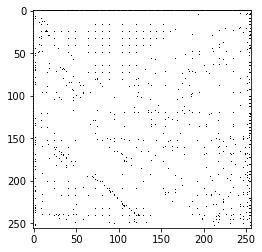

./AerialImageDataset/test/images_split/roof/innsbruck19_13_20.tiff


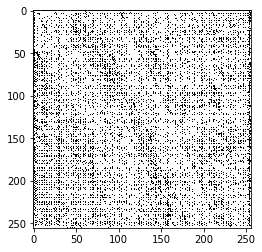

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_17_20.tiff


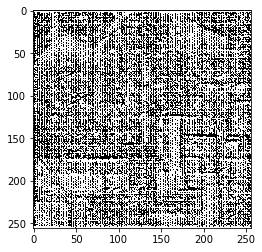

./AerialImageDataset/test/images_split/roof/innsbruck19_15_04.tiff


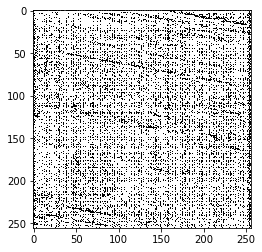

./AerialImageDataset/test/images_split/roof/sfo36_12_09.tiff


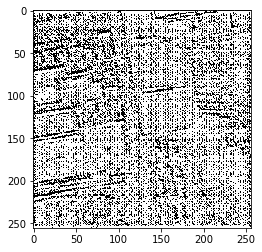

./AerialImageDataset/test/images_split/roof/innsbruck19_15_19.tiff


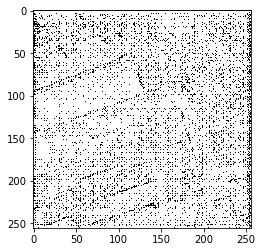

./AerialImageDataset/test/images_split/roof/sfo36_12_05.tiff


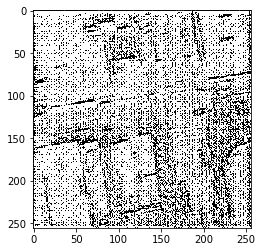

./AerialImageDataset/test/images_split/roof/innsbruck19_12_12.tiff


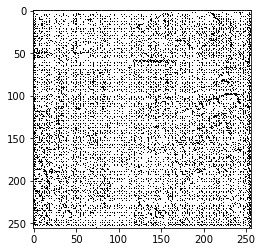

./AerialImageDataset/test/images_split/roof/sfo36_12_18.tiff


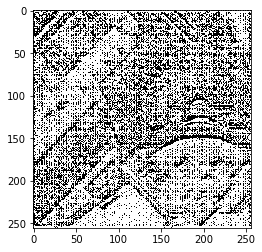

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_08_03.tiff


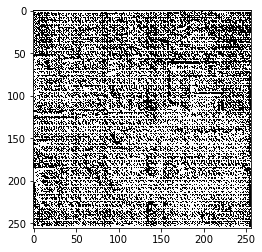

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_08_09.tiff


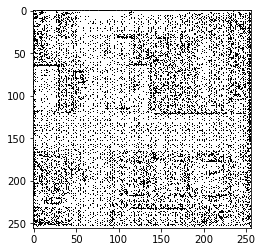

./AerialImageDataset/test/images_split/roof/sfo36_05_08.tiff


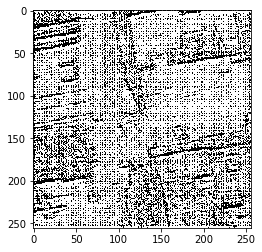

./AerialImageDataset/test/images_split/roof/sfo36_15_18.tiff


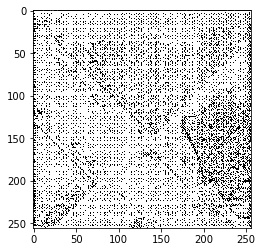

./AerialImageDataset/test/images_split/roof/sfo36_04_02.tiff


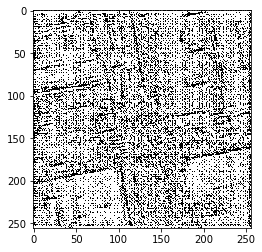

./AerialImageDataset/test/images_split/roof/sfo36_07_14.tiff


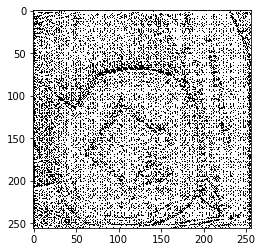

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_06_16.tiff


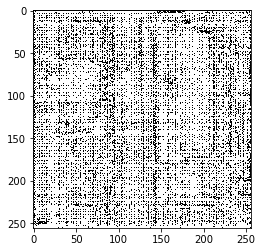

./AerialImageDataset/test/images_split/roof/sfo36_14_10.tiff


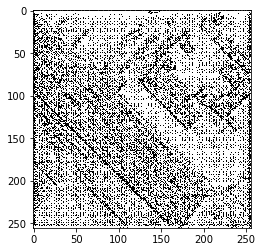

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_03_19.tiff


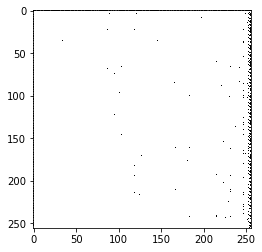

./AerialImageDataset/test/images_split/roof/sfo36_11_16.tiff


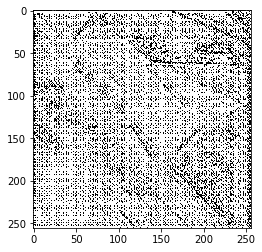

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_20_16.tiff


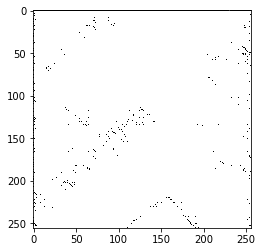

./AerialImageDataset/test/images_split/roof/sfo36_06_11.tiff


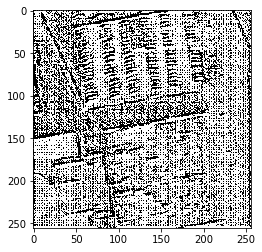

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_16_11.tiff


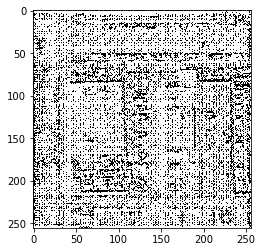

./AerialImageDataset/test/images_split/roof/sfo36_01_10.tiff


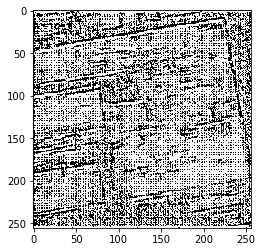

./AerialImageDataset/test/images_split/roof/bellingham11_04_05.tiff


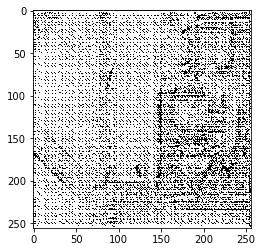

./AerialImageDataset/test/images_split/roof/bellingham11_07_12.tiff


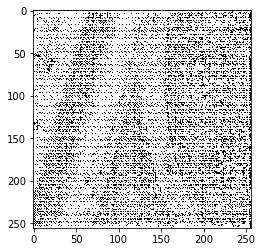

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_18_16.tiff


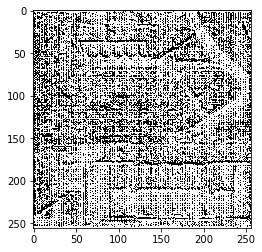

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_08_01.tiff


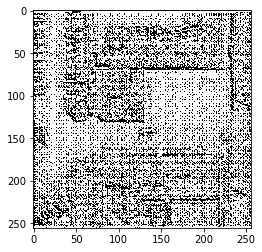

./AerialImageDataset/test/images_split/roof/sfo36_19_10.tiff


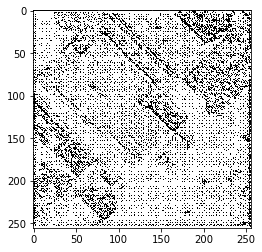

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_06_09.tiff


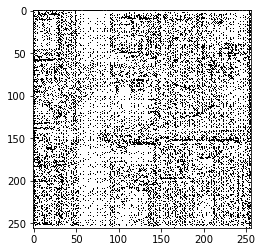

./AerialImageDataset/test/images_split/roof/sfo36_13_11.tiff


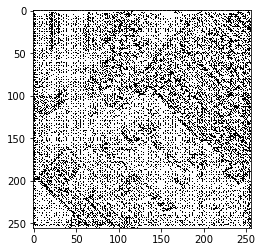

./AerialImageDataset/test/images_split/roof/innsbruck19_08_10.tiff


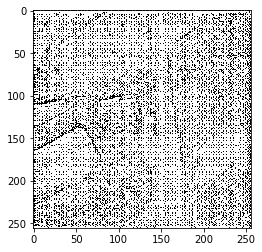

./AerialImageDataset/test/images_split/roof/bellingham11_15_18.tiff


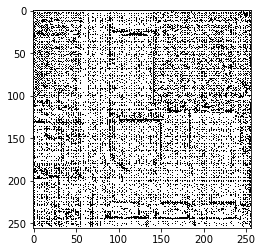

./AerialImageDataset/test/images_split/roof/bellingham11_03_04.tiff


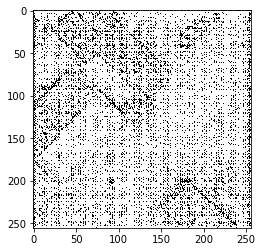

./AerialImageDataset/test/images_split/roof/sfo36_05_10.tiff


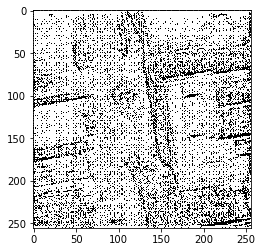

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_10_14.tiff


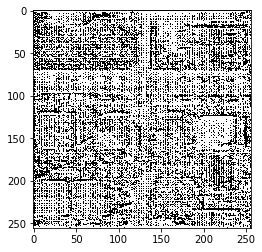

./AerialImageDataset/test/images_split/roof/innsbruck19_11_16.tiff


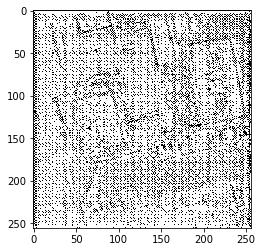

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_11_14.tiff


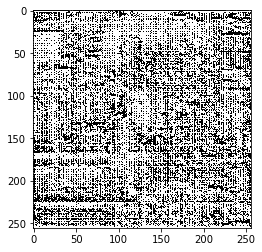

./AerialImageDataset/test/images_split/roof/innsbruck19_13_12.tiff


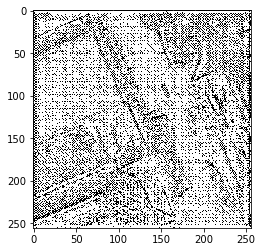

./AerialImageDataset/test/images_split/roof/innsbruck19_07_14.tiff


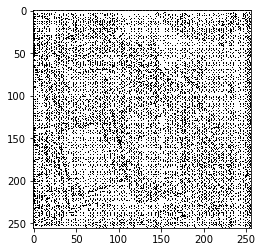

./AerialImageDataset/test/images_split/roof/bellingham11_08_10.tiff


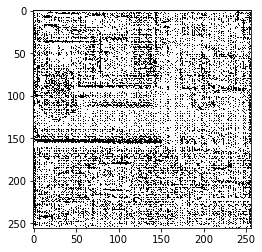

./AerialImageDataset/test/images_split/roof/sfo36_19_18.tiff


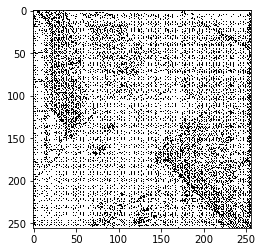

./AerialImageDataset/test/images_split/roof/sfo36_19_05.tiff


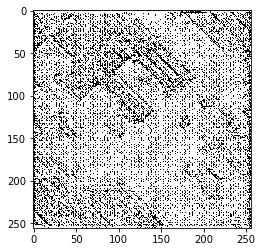

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_15_09.tiff


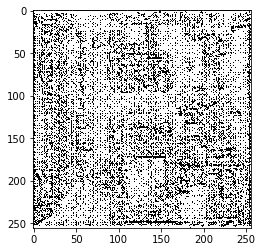

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_15_04.tiff


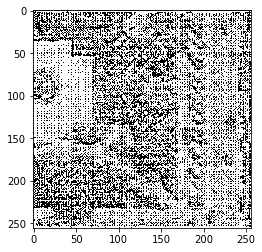

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_08_07.tiff


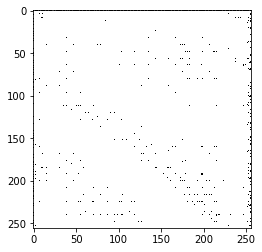

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_17_11.tiff


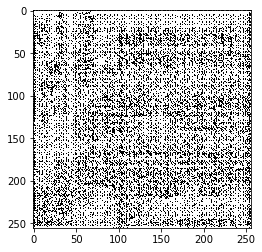

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_20_03.tiff


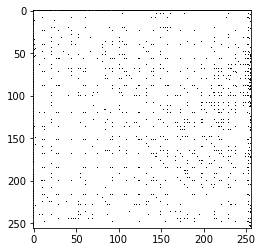

./AerialImageDataset/test/images_split/roof/sfo36_11_14.tiff


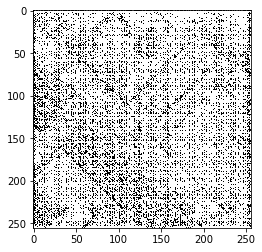

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_17_02.tiff


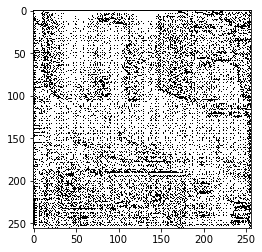

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_08_19.tiff


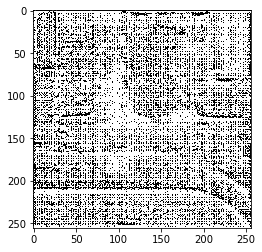

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_13_10.tiff


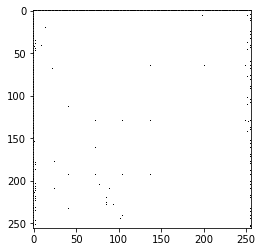

./AerialImageDataset/test/images_split/roof/innsbruck19_11_05.tiff


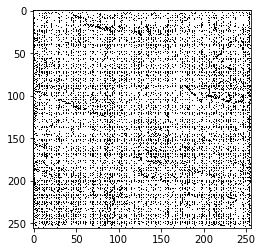

./AerialImageDataset/test/images_split/roof/innsbruck19_17_18.tiff


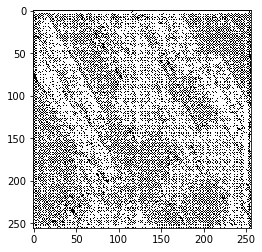

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_11_03.tiff


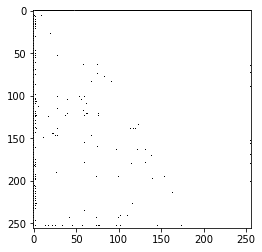

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_09_08.tiff


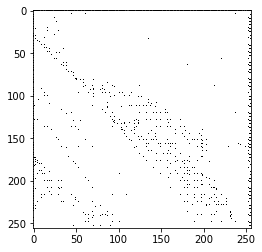

./AerialImageDataset/test/images_split/roof/sfo36_11_09.tiff


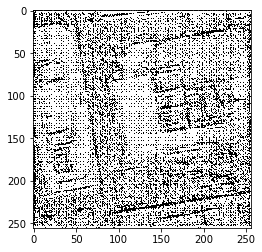

./AerialImageDataset/test/images_split/roof/bellingham11_17_17.tiff


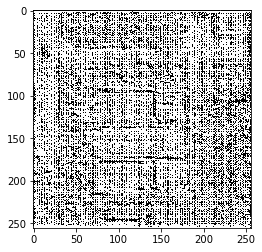

./AerialImageDataset/test/images_split/roof/bellingham11_08_01.tiff


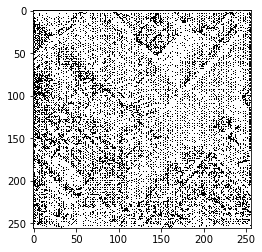

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_06_13.tiff


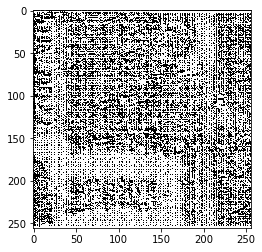

./AerialImageDataset/test/images_split/roof/sfo36_08_16.tiff


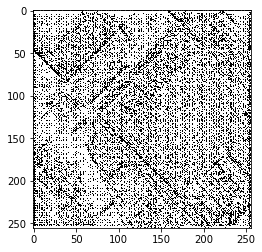

./AerialImageDataset/test/images_split/roof/innsbruck19_12_07.tiff


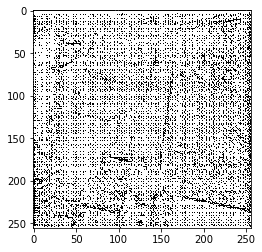

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_03_02.tiff


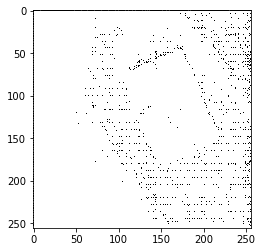

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_15_15.tiff


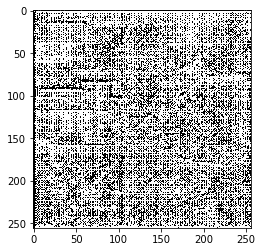

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_12_15.tiff


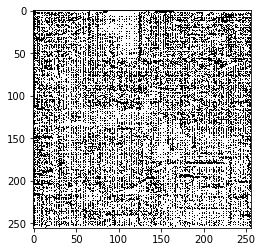

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_04_15.tiff


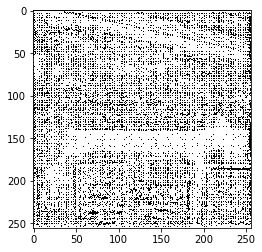

./AerialImageDataset/test/images_split/roof/innsbruck19_16_04.tiff


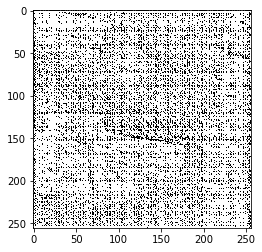

./AerialImageDataset/test/images_split/roof/sfo36_10_08.tiff


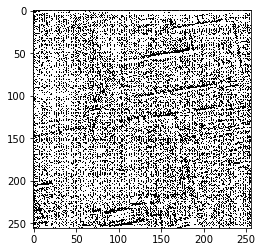

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_10_17.tiff


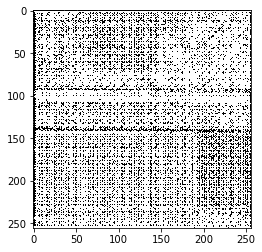

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_09_03.tiff


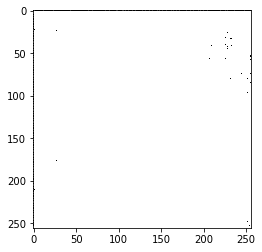

./AerialImageDataset/test/images_split/roof/bellingham11_10_02.tiff


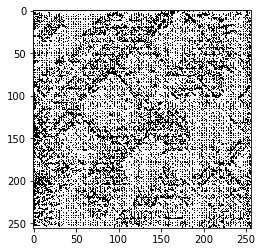

./AerialImageDataset/test/images_split/roof/bellingham11_09_20.tiff


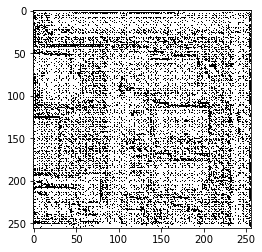

./AerialImageDataset/test/images_split/roof/sfo36_15_08.tiff


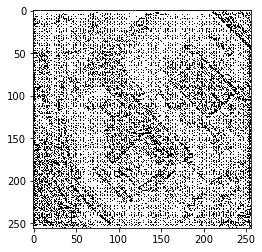

./AerialImageDataset/test/images_split/roof/bellingham11_04_12.tiff


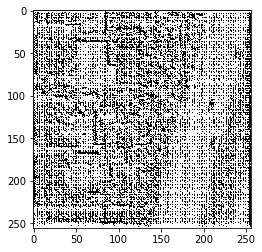

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_05_19.tiff


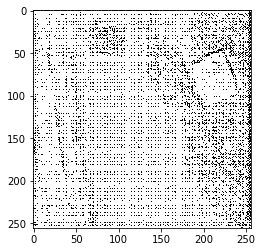

./AerialImageDataset/test/images_split/roof/sfo36_03_09.tiff


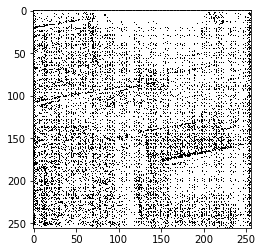

./AerialImageDataset/test/images_split/roof/bellingham11_14_01.tiff


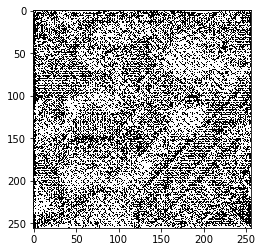

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_08_05.tiff


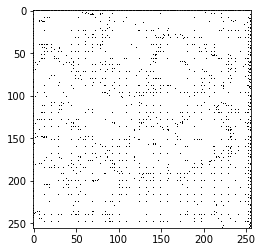

./AerialImageDataset/test/images_split/roof/bellingham11_02_02.tiff


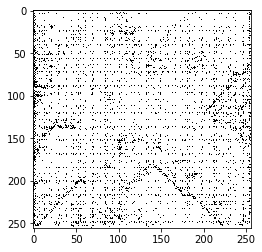

./AerialImageDataset/test/images_split/roof/bellingham11_06_13.tiff


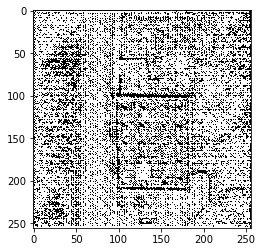

./AerialImageDataset/test/images_split/roof/bellingham11_02_04.tiff


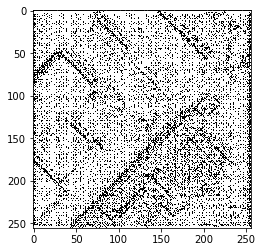

./AerialImageDataset/test/images_split/roof/sfo36_17_17.tiff


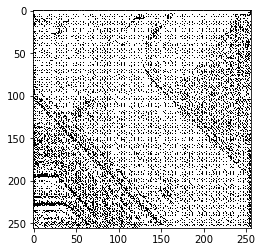

./AerialImageDataset/test/images_split/roof/bellingham11_10_11.tiff


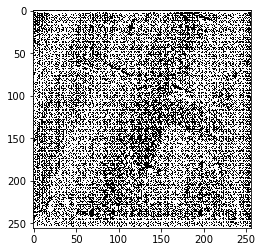

./AerialImageDataset/test/images_split/roof/sfo36_04_10.tiff


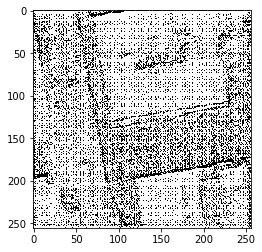

./AerialImageDataset/test/images_split/roof/innsbruck19_03_19.tiff


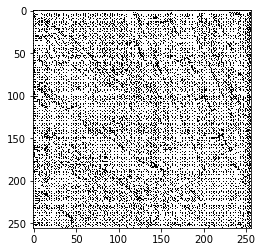

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_19_03.tiff


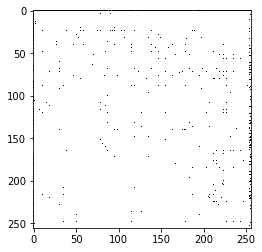

./AerialImageDataset/test/images_split/roof/bellingham11_07_15.tiff


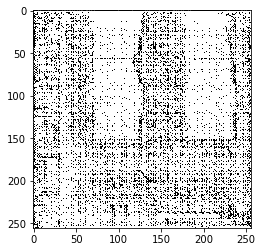

./AerialImageDataset/test/images_split/roof/bellingham11_13_10.tiff


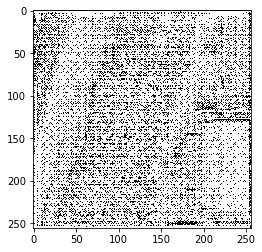

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_15_10.tiff


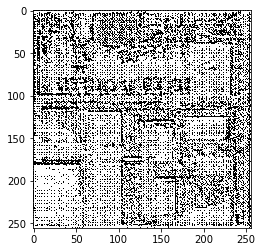

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_12_13.tiff


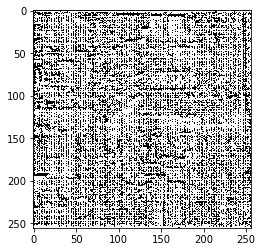

./AerialImageDataset/test/images_split/roof/sfo36_13_02.tiff


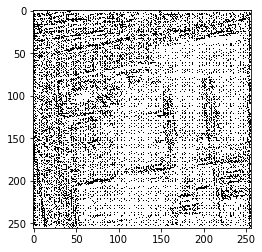

./AerialImageDataset/test/images_split/roof/bellingham11_09_12.tiff


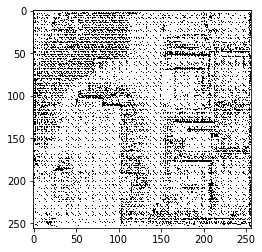

./AerialImageDataset/test/images_split/roof/bellingham11_18_19.tiff


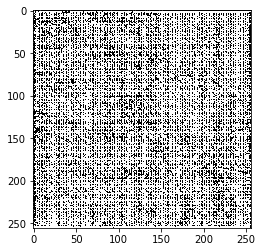

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_20_14.tiff


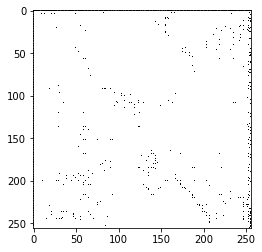

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_11_03.tiff


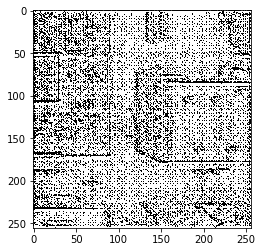

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_07_13.tiff


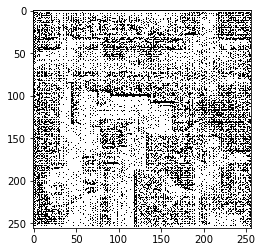

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_01_08.tiff


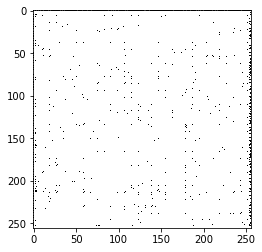

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_04_16.tiff


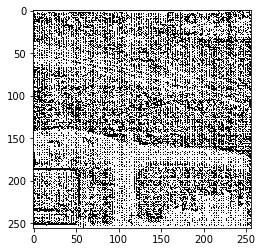

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_07_03.tiff


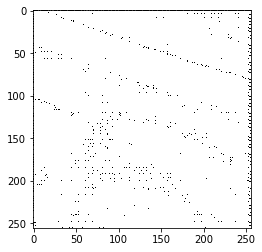

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_19_01.tiff


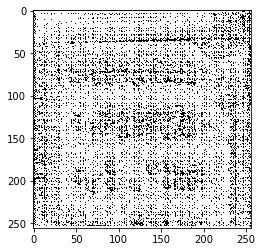

./AerialImageDataset/test/images_split/roof/sfo36_06_04.tiff


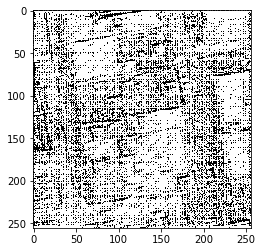

./AerialImageDataset/test/images_split/roof/innsbruck19_01_12.tiff


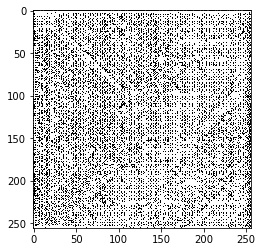

./AerialImageDataset/test/images_split/roof/sfo36_16_16.tiff


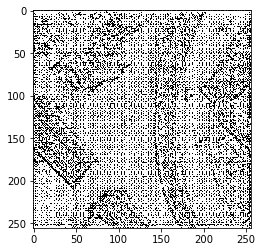

./AerialImageDataset/test/images_split/roof/innsbruck19_10_17.tiff


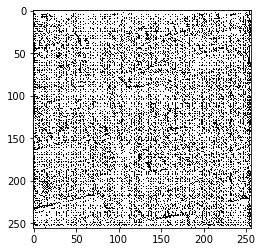

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_19_17.tiff


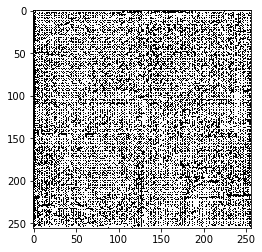

./AerialImageDataset/test/images_split/roof/innsbruck19_10_04.tiff


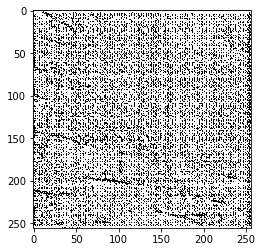

./AerialImageDataset/test/images_split/roof/innsbruck19_06_15.tiff


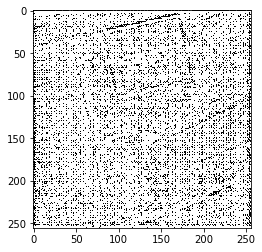

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_16_19.tiff


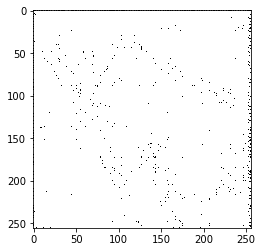

./AerialImageDataset/test/images_split/roof/sfo36_20_17.tiff


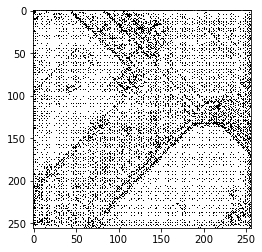

./AerialImageDataset/test/images_split/roof/bellingham11_16_13.tiff


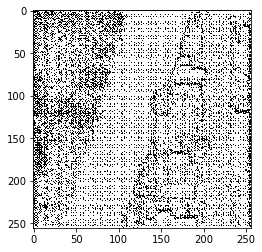

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_14_18.tiff


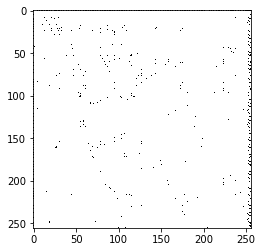

./AerialImageDataset/test/images_split/roof/innsbruck19_18_03.tiff


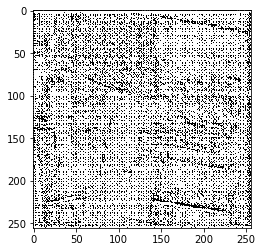

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_05_20.tiff


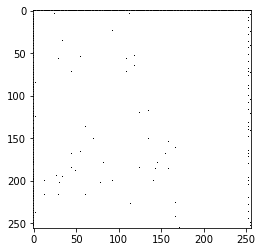

./AerialImageDataset/test/images_split/roof/sfo36_14_12.tiff


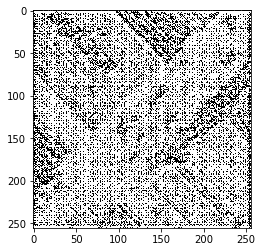

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_05_07.tiff


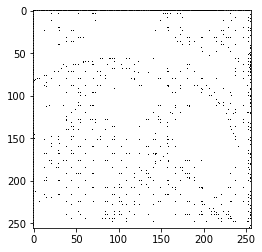

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_17_20.tiff


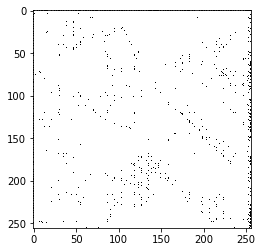

./AerialImageDataset/test/images_split/roof/sfo36_03_11.tiff


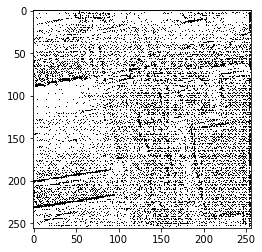

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_14_06.tiff


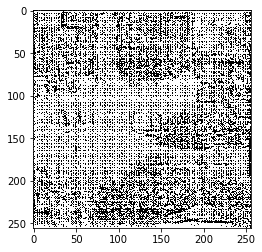

./AerialImageDataset/test/images_split/roof/innsbruck19_07_07.tiff


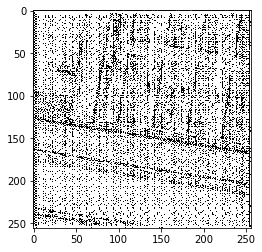

./AerialImageDataset/test/images_split/roof/sfo36_20_20.tiff


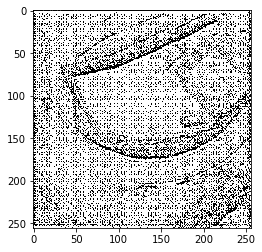

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_10_09.tiff


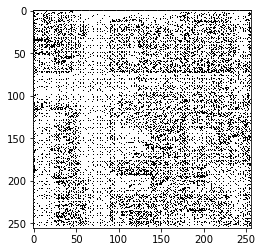

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_07_09.tiff


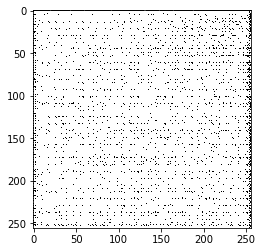

./AerialImageDataset/test/images_split/roof/bellingham11_19_03.tiff


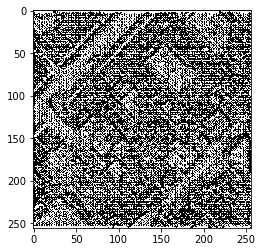

./AerialImageDataset/test/images_split/roof/innsbruck19_19_12.tiff


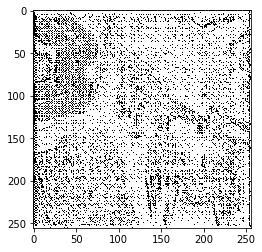

./AerialImageDataset/test/images_split/roof/sfo36_15_07.tiff


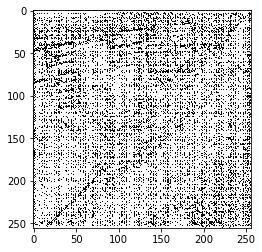

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_16_08.tiff


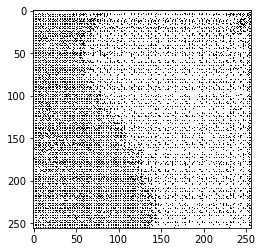

./AerialImageDataset/test/images_split/roof/bellingham11_14_11.tiff


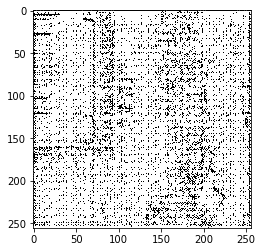

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_13_12.tiff


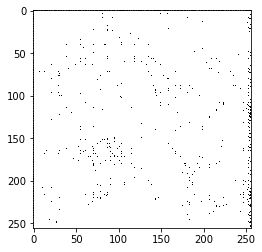

./AerialImageDataset/test/images_split/roof/sfo36_19_09.tiff


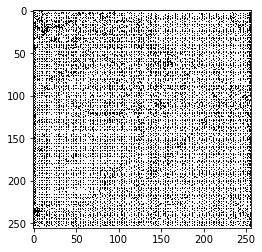

./AerialImageDataset/test/images_split/roof/bellingham11_14_14.tiff


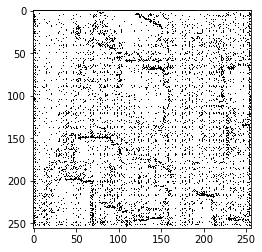

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_04_18.tiff


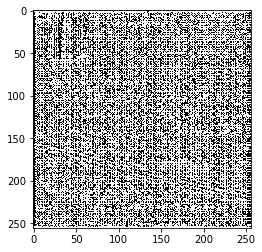

./AerialImageDataset/test/images_split/roof/bellingham11_14_17.tiff


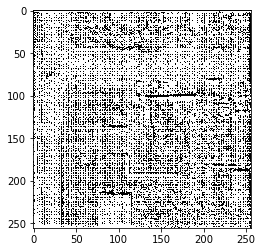

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_07_12.tiff


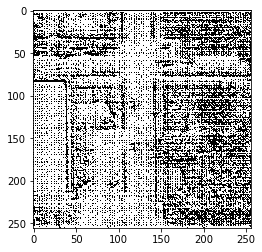

./AerialImageDataset/test/images_split/roof/bellingham11_04_07.tiff


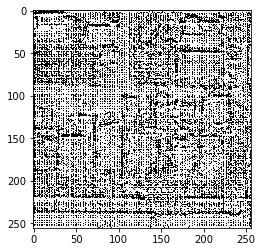

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_16_20.tiff


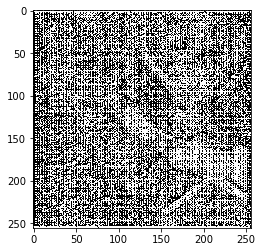

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_20_20.tiff


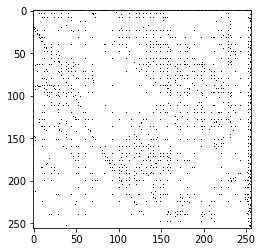

./AerialImageDataset/test/images_split/roof/bellingham11_16_10.tiff


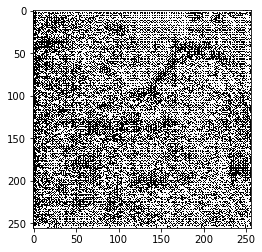

./AerialImageDataset/test/images_split/roof/sfo36_06_07.tiff


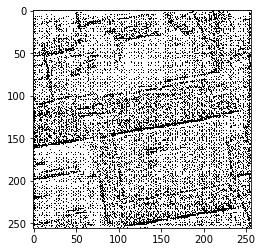

./AerialImageDataset/test/images_split/roof/sfo36_13_01.tiff


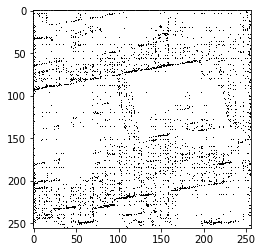

./AerialImageDataset/test/images_split/roof/innsbruck19_16_05.tiff


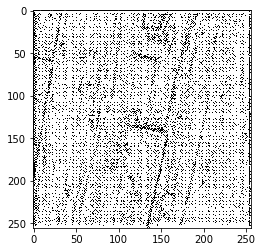

./AerialImageDataset/test/images_split/roof/bellingham11_11_11.tiff


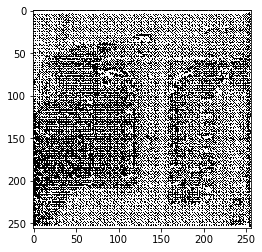

./AerialImageDataset/test/images_split/roof/bellingham11_11_16.tiff


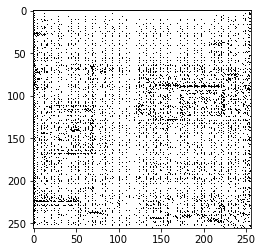

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_07_09.tiff


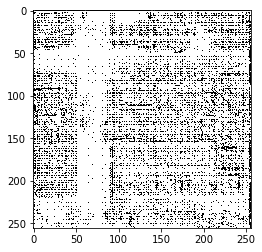

./AerialImageDataset/test/images_split/roof/bellingham11_17_19.tiff


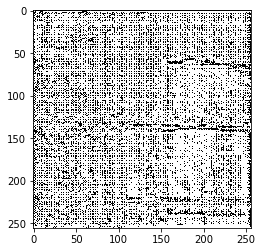

./AerialImageDataset/test/images_split/roof/sfo36_17_04.tiff


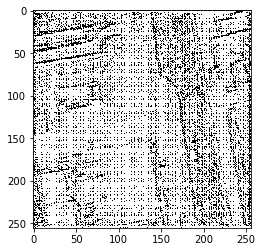

./AerialImageDataset/test/images_split/roof/sfo36_17_03.tiff


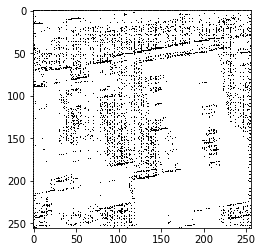

./AerialImageDataset/test/images_split/roof/sfo36_20_03.tiff


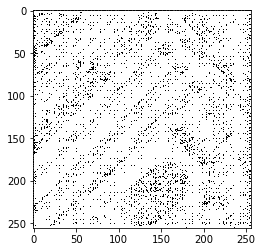

./AerialImageDataset/test/images_split/roof/innsbruck19_06_01.tiff


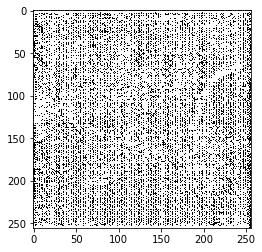

./AerialImageDataset/test/images_split/roof/bellingham11_18_16.tiff


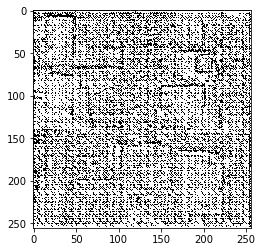

./AerialImageDataset/test/images_split/roof/innsbruck19_02_01.tiff


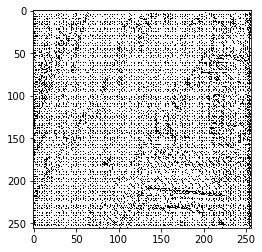

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_16_09.tiff


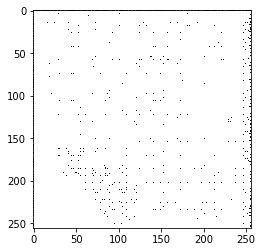

./AerialImageDataset/test/images_split/roof/bellingham11_01_05.tiff


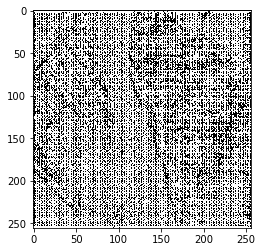

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_06_04.tiff


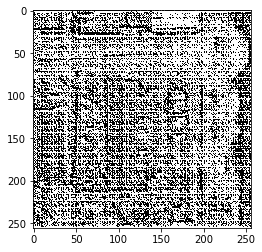

./AerialImageDataset/test/images_split/roof/sfo36_03_08.tiff


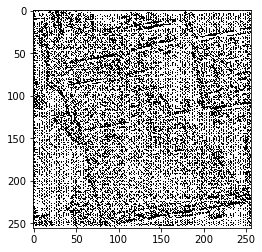

./AerialImageDataset/test/images_split/roof/innsbruck19_01_13.tiff


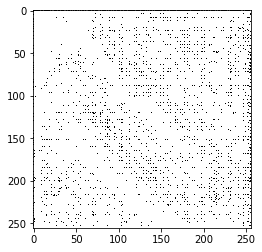

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_02_13.tiff


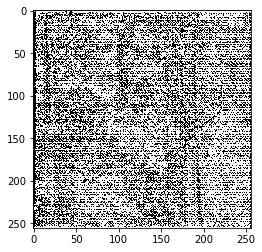

./AerialImageDataset/test/images_split/roof/innsbruck19_02_19.tiff


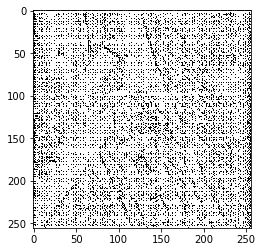

./AerialImageDataset/test/images_split/roof/innsbruck19_10_06.tiff


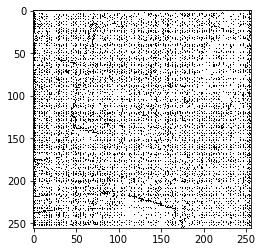

./AerialImageDataset/test/images_split/roof/bellingham11_14_13.tiff


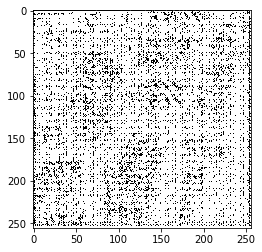

./AerialImageDataset/test/images_split/roof/bellingham11_05_01.tiff


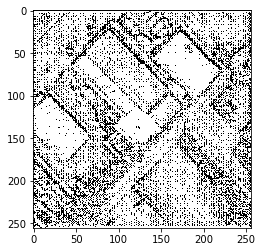

./AerialImageDataset/test/images_split/roof/sfo36_16_01.tiff


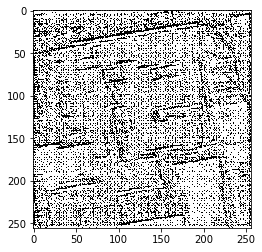

./AerialImageDataset/test/images_split/roof/sfo36_16_14.tiff


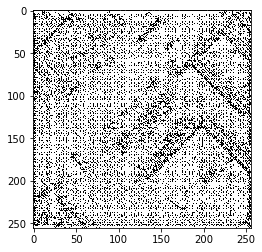

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_07_10.tiff


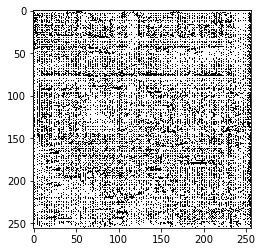

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_19_07.tiff


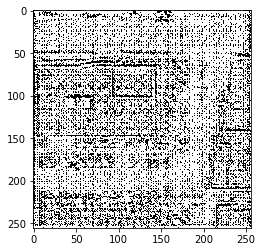

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_19_13.tiff


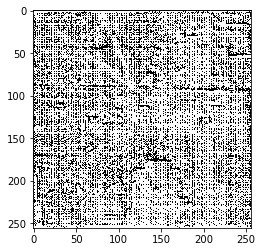

./AerialImageDataset/test/images_split/roof/sfo36_11_06.tiff


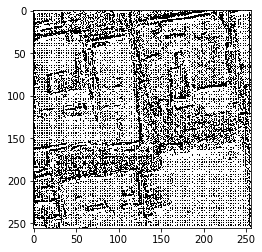

./AerialImageDataset/test/images_split/roof/bellingham11_07_06.tiff


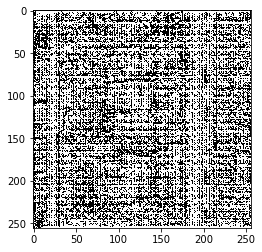

./AerialImageDataset/test/images_split/roof/innsbruck19_07_18.tiff


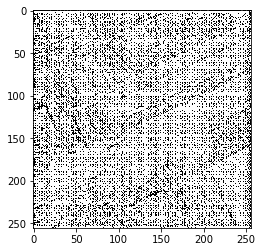

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_07_18.tiff


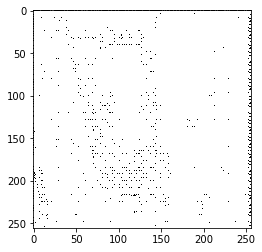

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_17_03.tiff


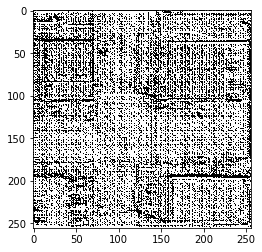

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_17_17.tiff


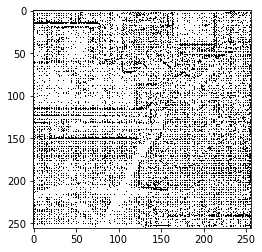

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_01_15.tiff


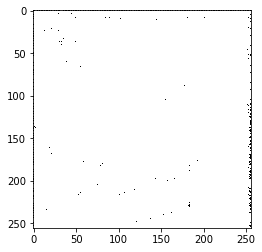

./AerialImageDataset/test/images_split/roof/sfo36_05_17.tiff


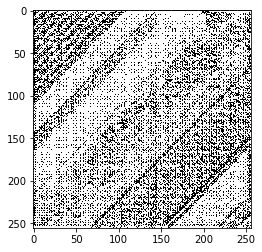

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_11_04.tiff


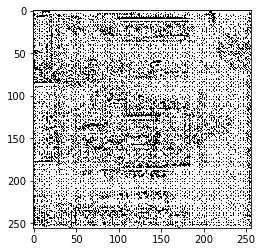

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_07_12.tiff


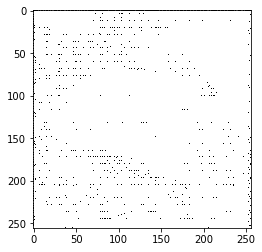

./AerialImageDataset/test/images_split/roof/innsbruck19_06_04.tiff


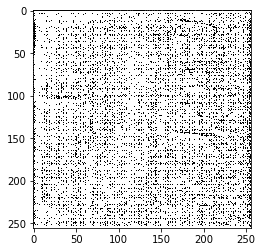

./AerialImageDataset/test/images_split/roof/innsbruck19_18_05.tiff


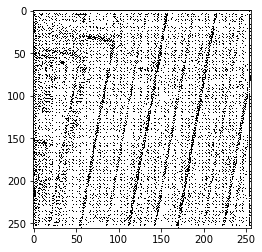

./AerialImageDataset/test/images_split/roof/bellingham11_20_16.tiff


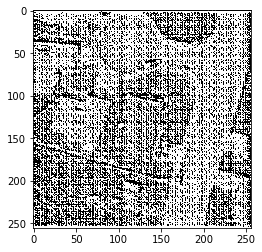

./AerialImageDataset/test/images_split/roof/innsbruck19_01_08.tiff


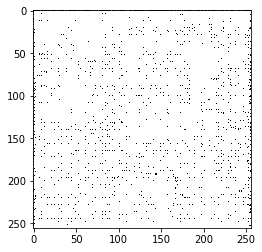

./AerialImageDataset/test/images_split/roof/innsbruck19_15_13.tiff


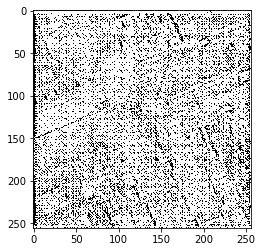

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_03_10.tiff


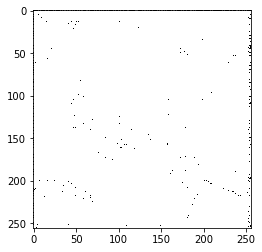

./AerialImageDataset/test/images_split/roof/bellingham11_04_06.tiff


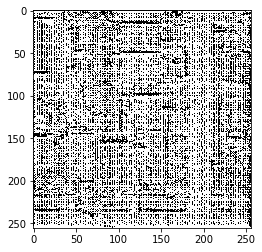

./AerialImageDataset/test/images_split/roof/sfo36_19_15.tiff


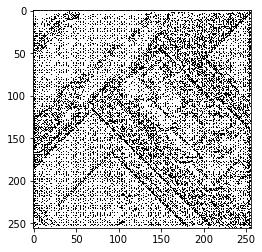

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_17_09.tiff


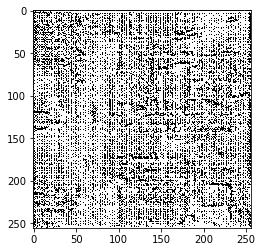

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_01_14.tiff


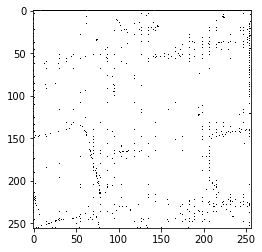

./AerialImageDataset/test/images_split/roof/sfo36_05_03.tiff


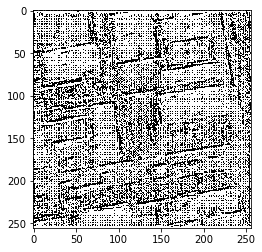

./AerialImageDataset/test/images_split/roof/sfo36_03_10.tiff


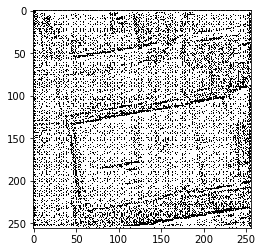

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_11_19.tiff


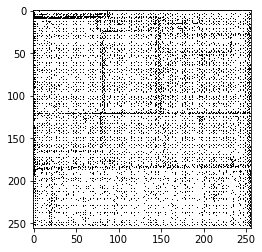

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_06_20.tiff


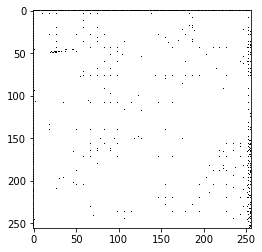

./AerialImageDataset/test/images_split/roof/bellingham11_16_07.tiff


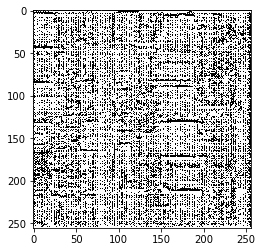

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_16_12.tiff


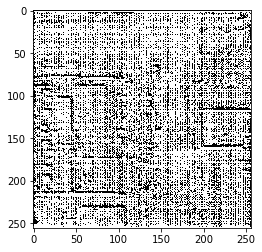

./AerialImageDataset/test/images_split/roof/bellingham11_01_17.tiff


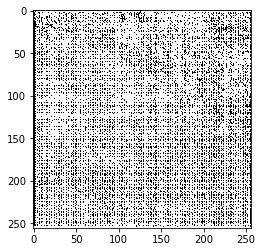

./AerialImageDataset/test/images_split/roof/bellingham11_20_06.tiff


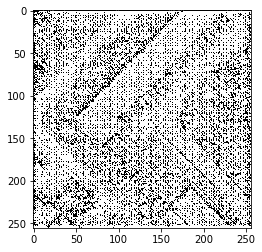

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_05_04.tiff


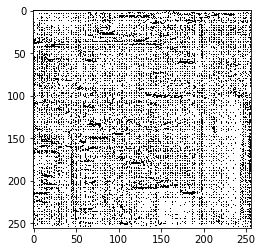

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_12_07.tiff


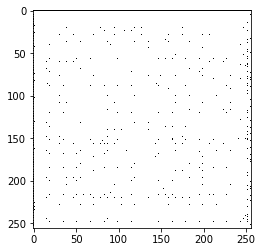

./AerialImageDataset/test/images_split/roof/innsbruck19_14_12.tiff


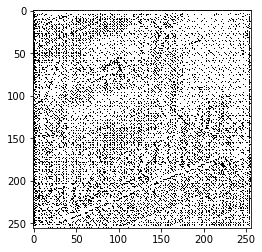

./AerialImageDataset/test/images_split/roof/bellingham11_12_14.tiff


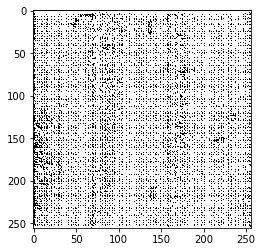

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_16_14.tiff


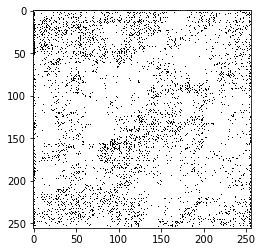

./AerialImageDataset/test/images_split/roof/bellingham11_20_19.tiff


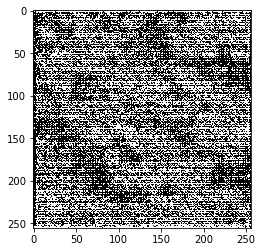

./AerialImageDataset/test/images_split/roof/innsbruck19_15_03.tiff


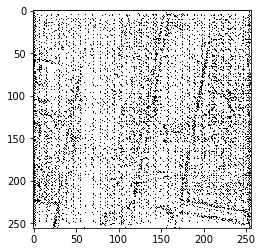

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_10_07.tiff


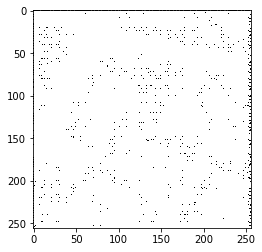

./AerialImageDataset/test/images_split/roof/innsbruck19_02_13.tiff


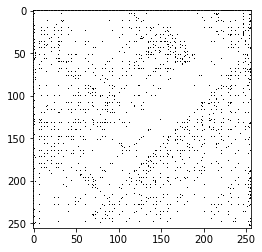

./AerialImageDataset/test/images_split/roof/bellingham11_19_18.tiff


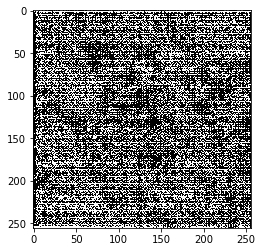

./AerialImageDataset/test/images_split/roof/bellingham11_12_09.tiff


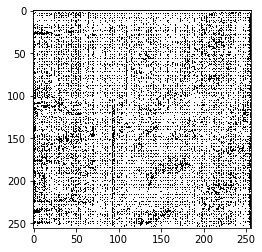

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_12_20.tiff


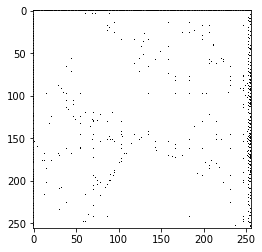

./AerialImageDataset/test/images_split/roof/sfo36_07_06.tiff


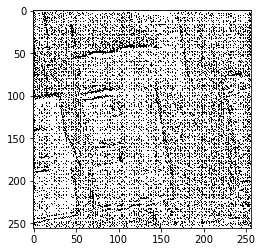

./AerialImageDataset/test/images_split/roof/sfo36_14_09.tiff


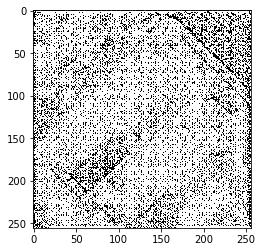

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_14_13.tiff


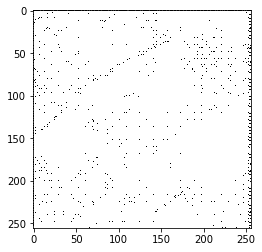

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_10_06.tiff


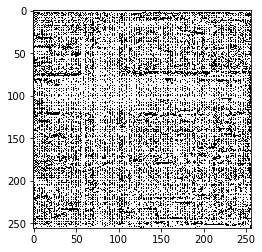

./AerialImageDataset/test/images_split/roof/innsbruck19_17_08.tiff


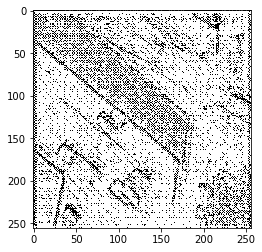

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_04_20.tiff


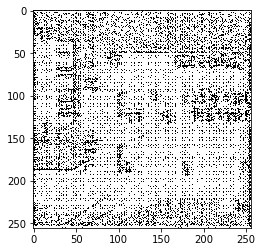

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_01_07.tiff


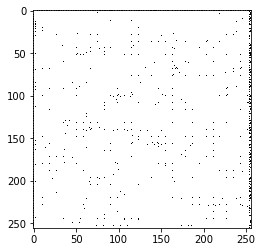

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_18_02.tiff


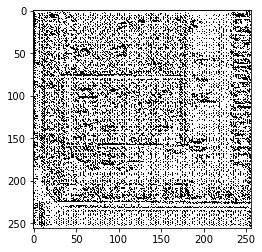

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_11_13.tiff


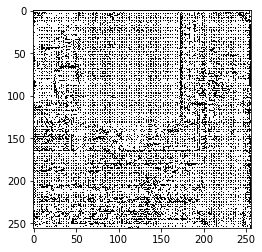

./AerialImageDataset/test/images_split/roof/sfo36_18_02.tiff


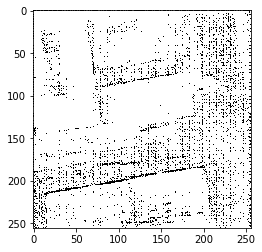

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_11_20.tiff


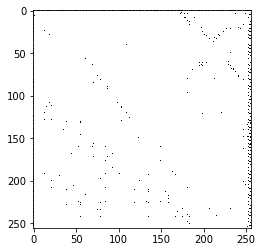

./AerialImageDataset/test/images_split/roof/sfo36_15_03.tiff


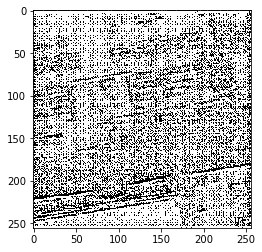

./AerialImageDataset/test/images_split/roof/bellingham11_04_11.tiff


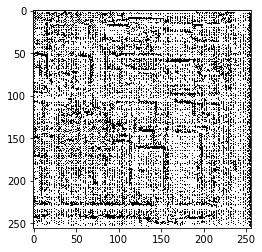

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_17_10.tiff


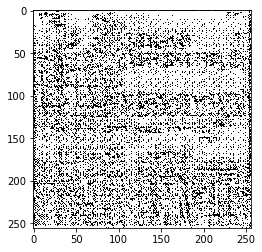

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_05_06.tiff


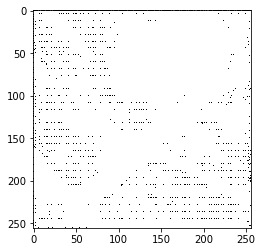

./AerialImageDataset/test/images_split/roof/bellingham11_12_13.tiff


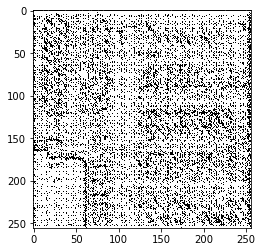

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_12_06.tiff


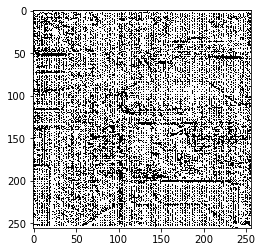

./AerialImageDataset/test/images_split/roof/bellingham11_14_18.tiff


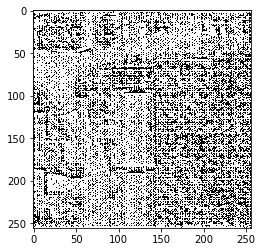

./AerialImageDataset/test/images_split/roof/innsbruck19_19_04.tiff


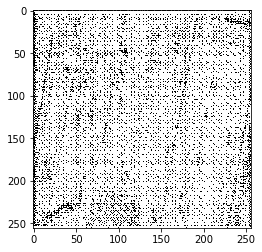

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_20_10.tiff


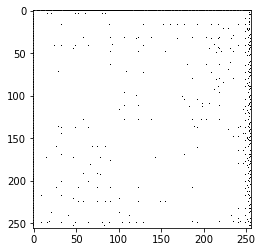

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_02_07.tiff


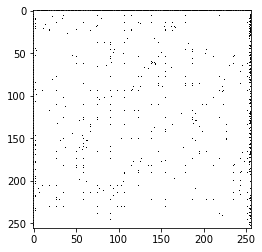

./AerialImageDataset/test/images_split/roof/innsbruck19_01_15.tiff


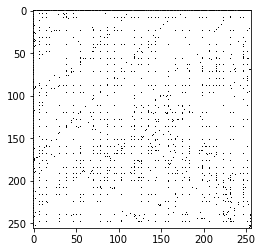

./AerialImageDataset/test/images_split/roof/innsbruck19_07_02.tiff


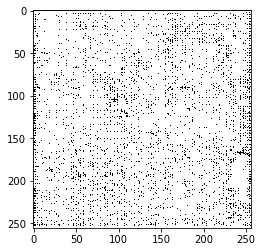

./AerialImageDataset/test/images_split/roof/bellingham11_08_04.tiff


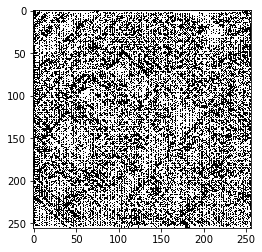

./AerialImageDataset/test/images_split/roof/innsbruck19_12_20.tiff


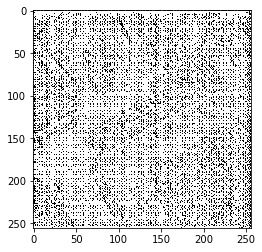

./AerialImageDataset/test/images_split/roof/bellingham11_09_14.tiff


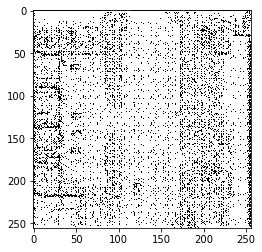

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_02_12.tiff


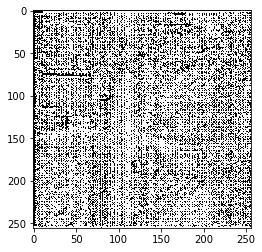

./AerialImageDataset/test/images_split/roof/bellingham11_02_15.tiff


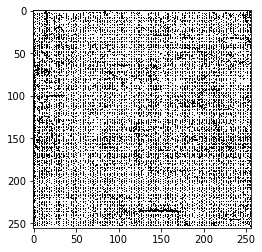

./AerialImageDataset/test/images_split/roof/innsbruck19_06_02.tiff


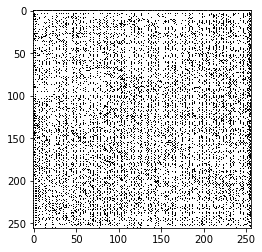

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_17_05.tiff


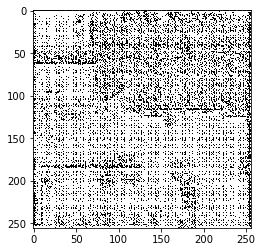

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_10_20.tiff


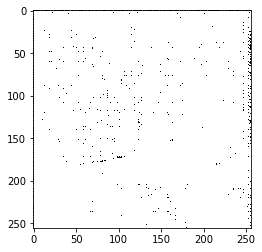

./AerialImageDataset/test/images_split/roof/sfo36_03_15.tiff


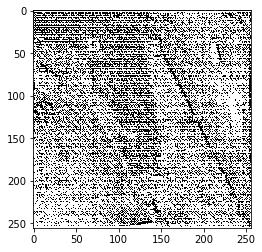

./AerialImageDataset/test/images_split/roof/bellingham11_11_20.tiff


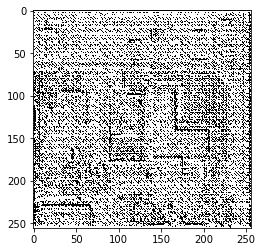

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_15_14.tiff


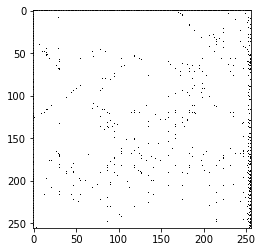

./AerialImageDataset/test/images_split/roof/innsbruck19_08_15.tiff


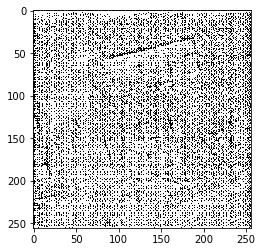

./AerialImageDataset/test/images_split/roof/bellingham11_02_09.tiff


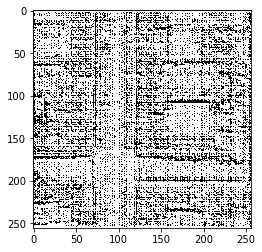

./AerialImageDataset/test/images_split/roof/bellingham11_09_19.tiff


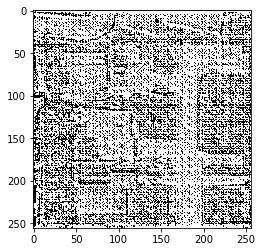

./AerialImageDataset/test/images_split/roof/sfo36_04_05.tiff


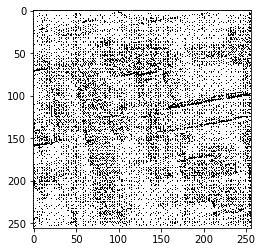

./AerialImageDataset/test/images_split/roof/bellingham11_18_11.tiff


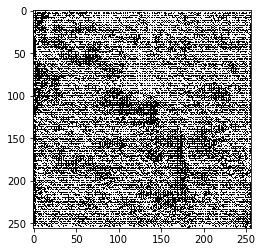

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_10_08.tiff


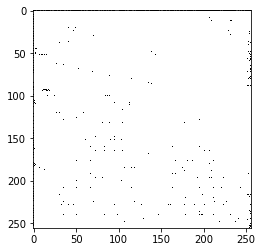

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_06_12.tiff


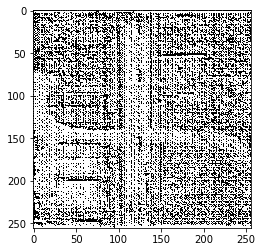

./AerialImageDataset/test/images_split/roof/innsbruck19_20_01.tiff


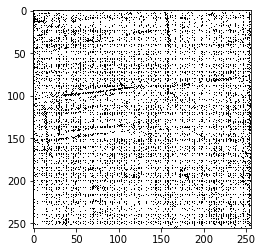

./AerialImageDataset/test/images_split/roof/sfo36_06_17.tiff


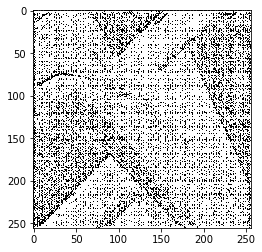

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_07_06.tiff


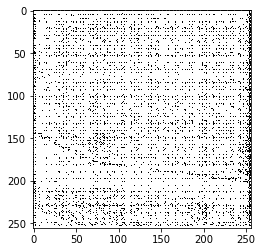

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_20_13.tiff


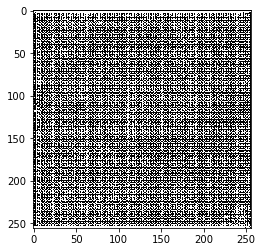

./AerialImageDataset/test/images_split/roof/bellingham11_03_03.tiff


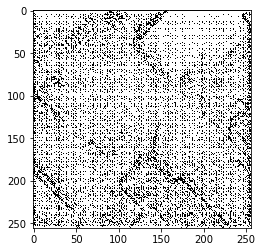

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_07_05.tiff


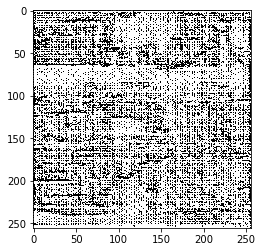

./AerialImageDataset/test/images_split/roof/bellingham11_16_17.tiff


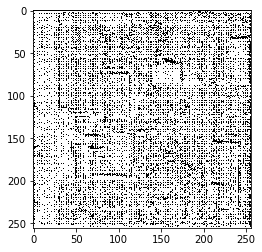

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_18_20.tiff


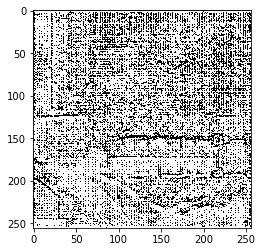

./AerialImageDataset/test/images_split/roof/sfo36_15_04.tiff


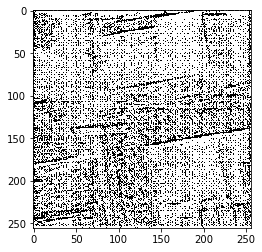

./AerialImageDataset/test/images_split/roof/bellingham11_12_02.tiff


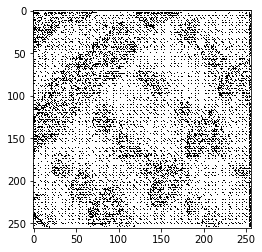

./AerialImageDataset/test/images_split/roof/sfo36_11_13.tiff


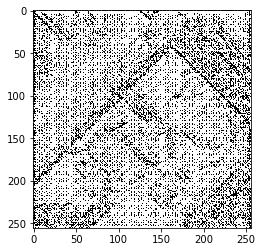

./AerialImageDataset/test/images_split/roof/sfo36_01_19.tiff


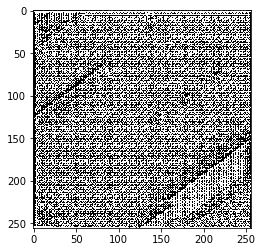

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_02_02.tiff


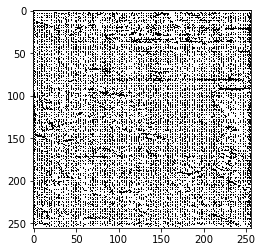

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_15_20.tiff


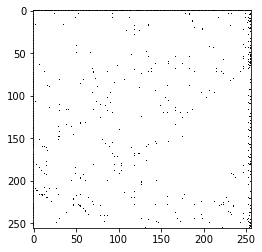

./AerialImageDataset/test/images_split/roof/innsbruck19_18_06.tiff


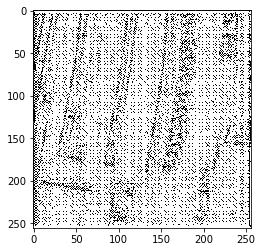

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_08_13.tiff


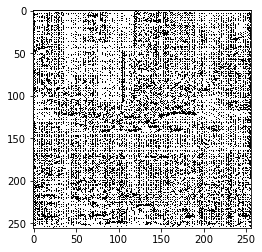

./AerialImageDataset/test/images_split/roof/sfo36_18_08.tiff


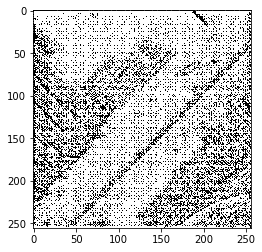

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_10_02.tiff


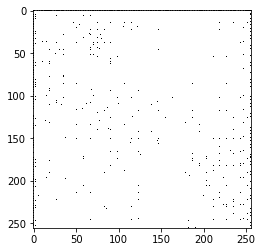

./AerialImageDataset/test/images_split/roof/sfo36_09_08.tiff


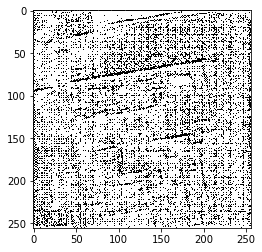

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_20_05.tiff


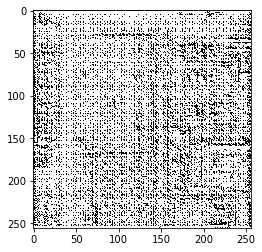

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_16_13.tiff


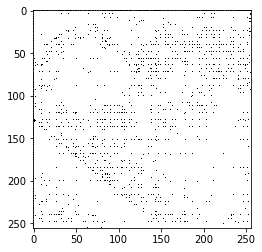

./AerialImageDataset/test/images_split/roof/bellingham11_17_07.tiff


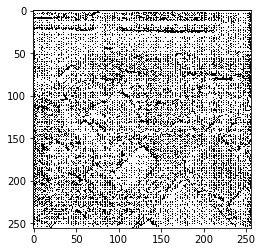

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_20_15.tiff


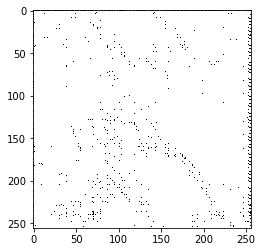

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_16_18.tiff


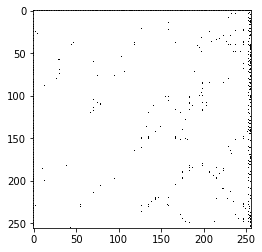

./AerialImageDataset/test/images_split/roof/sfo36_10_13.tiff


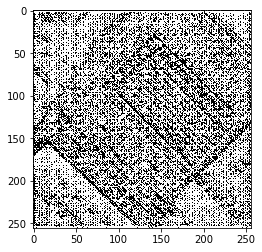

./AerialImageDataset/test/images_split/roof/bellingham11_08_17.tiff


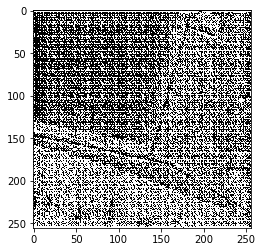

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_14_15.tiff


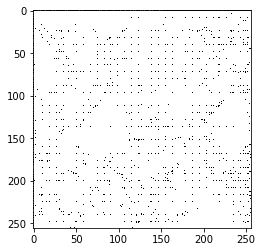

./AerialImageDataset/test/images_split/roof/innsbruck19_08_05.tiff


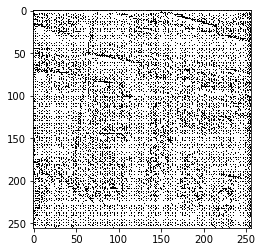

./AerialImageDataset/test/images_split/roof/bellingham11_11_08.tiff


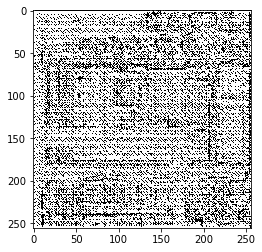

./AerialImageDataset/test/images_split/roof/innsbruck19_16_16.tiff


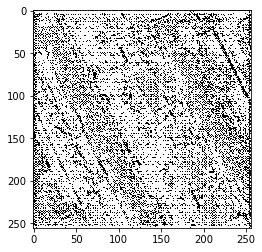

./AerialImageDataset/test/images_split/roof/innsbruck19_19_08.tiff


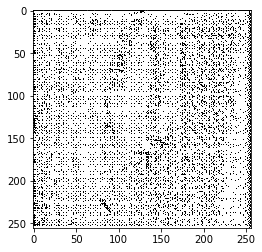

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_03_03.tiff


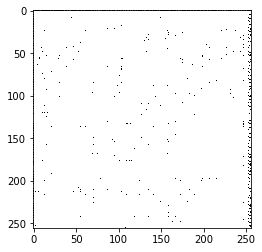

./AerialImageDataset/test/images_split/roof/innsbruck19_13_01.tiff


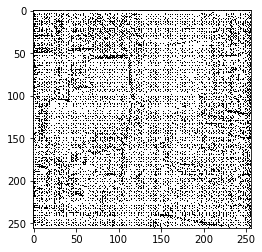

./AerialImageDataset/test/images_split/roof/sfo36_12_19.tiff


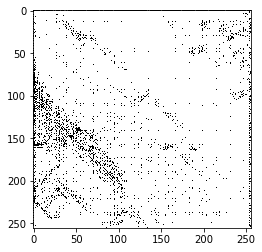

./AerialImageDataset/test/images_split/roof/sfo36_05_05.tiff


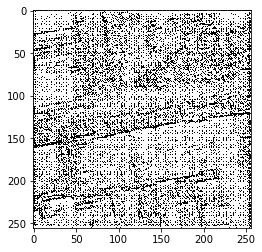

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_19_18.tiff


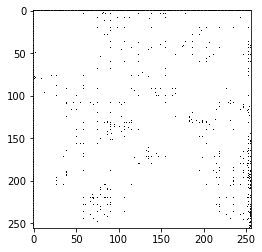

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_03_09.tiff


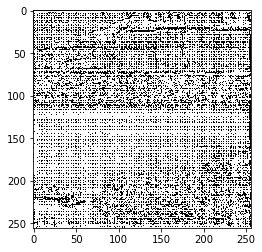

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_18_11.tiff


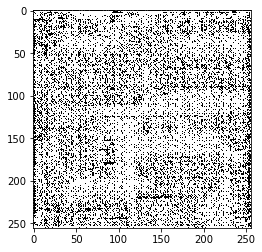

./AerialImageDataset/test/images_split/roof/innsbruck19_09_04.tiff


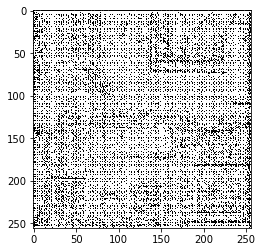

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_01_19.tiff


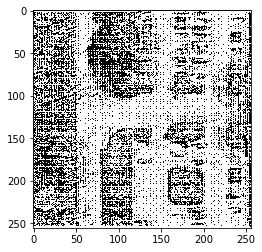

./AerialImageDataset/test/images_split/roof/bellingham11_19_14.tiff


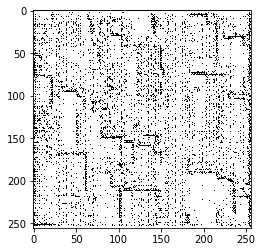

./AerialImageDataset/test/images_split/roof/innsbruck19_17_10.tiff


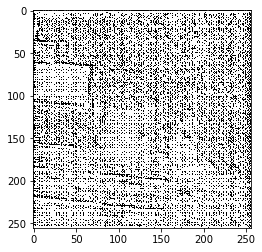

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_06_10.tiff


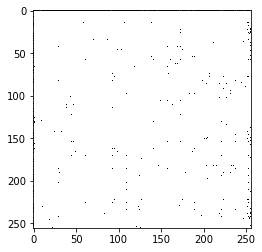

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_18_19.tiff


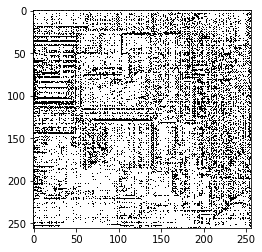

./AerialImageDataset/test/images_split/roof/sfo36_18_15.tiff


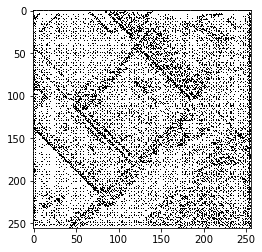

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_20_12.tiff


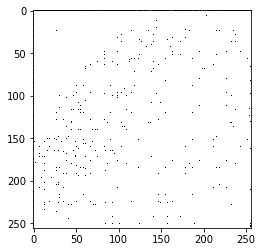

./AerialImageDataset/test/images_split/roof/bellingham11_02_14.tiff


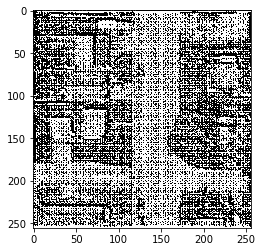

./AerialImageDataset/test/images_split/roof/innsbruck19_11_15.tiff


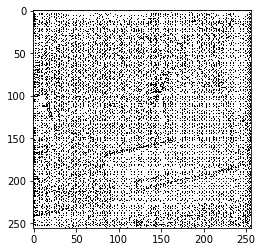

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_15_05.tiff


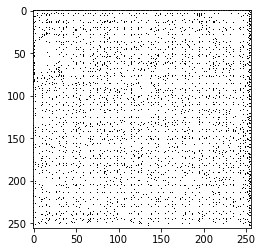

./AerialImageDataset/test/images_split/roof/innsbruck19_13_11.tiff


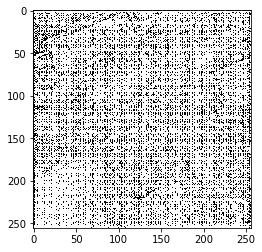

./AerialImageDataset/test/images_split/roof/innsbruck19_08_04.tiff


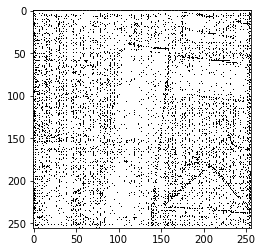

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_05_14.tiff


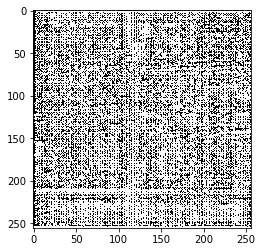

./AerialImageDataset/test/images_split/roof/bellingham11_06_12.tiff


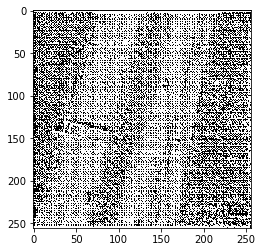

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_04_04.tiff


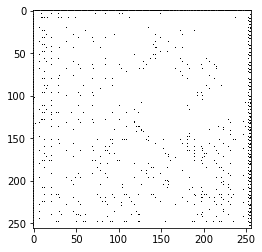

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_20_07.tiff


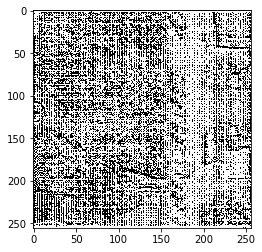

./AerialImageDataset/test/images_split/roof/innsbruck19_03_16.tiff


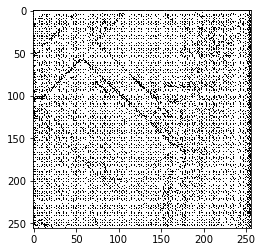

./AerialImageDataset/test/images_split/roof/innsbruck19_01_10.tiff


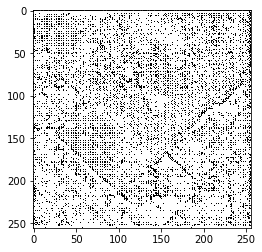

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_16_16.tiff


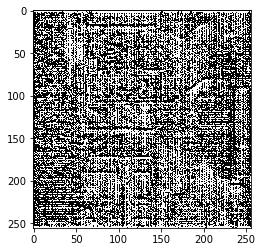

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_08_10.tiff


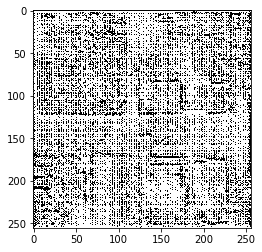

./AerialImageDataset/test/images_split/roof/sfo36_12_12.tiff


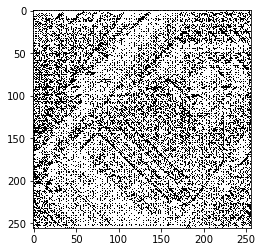

./AerialImageDataset/test/images_split/roof/sfo36_06_14.tiff


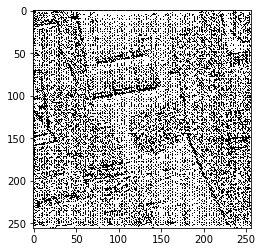

./AerialImageDataset/test/images_split/roof/bellingham11_05_02.tiff


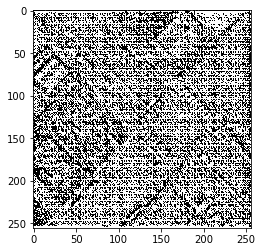

./AerialImageDataset/test/images_split/roof/sfo36_17_20.tiff


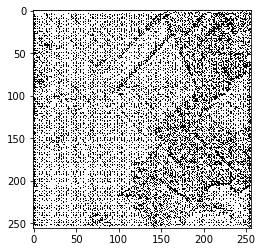

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_20_18.tiff


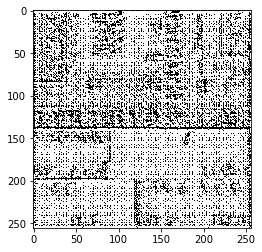

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_10_03.tiff


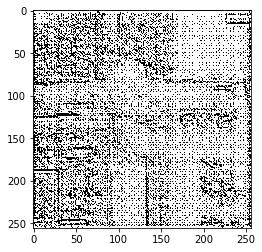

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_03_08.tiff


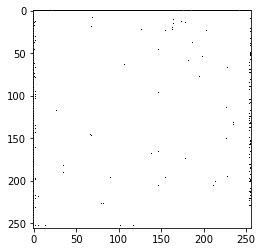

./AerialImageDataset/test/images_split/roof/innsbruck19_09_03.tiff


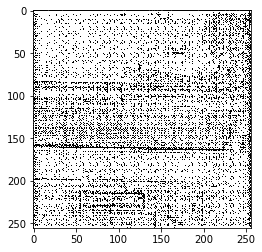

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_10_13.tiff


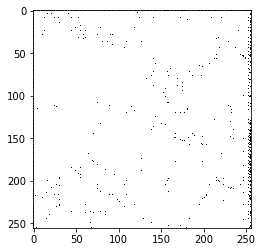

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_14_08.tiff


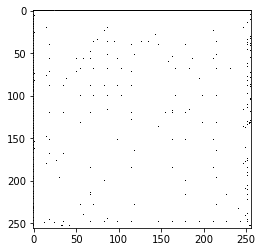

./AerialImageDataset/test/images_split/roof/innsbruck19_19_05.tiff


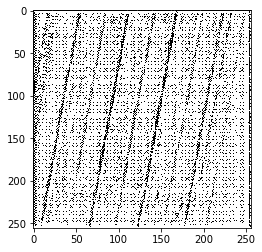

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_20_17.tiff


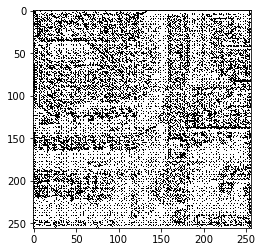

./AerialImageDataset/test/images_split/roof/sfo36_09_02.tiff


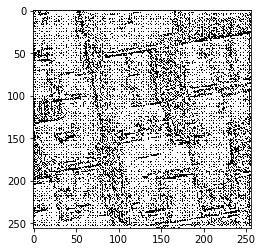

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_07_18.tiff


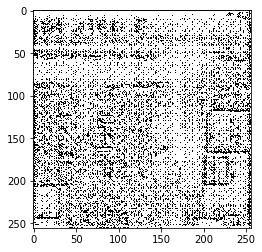

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_14_17.tiff


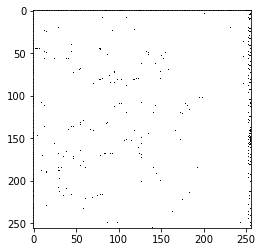

./AerialImageDataset/test/images_split/roof/sfo36_05_14.tiff


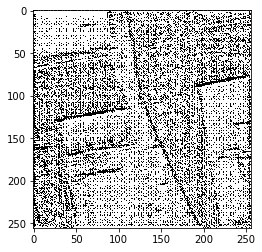

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_18_10.tiff


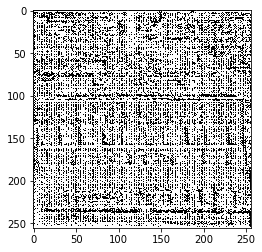

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_06_09.tiff


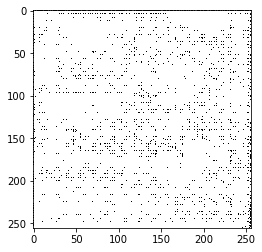

./AerialImageDataset/test/images_split/roof/innsbruck19_16_12.tiff


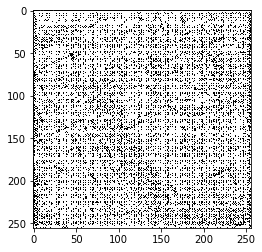

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_17_14.tiff


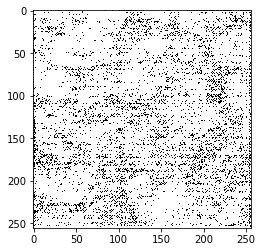

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_16_06.tiff


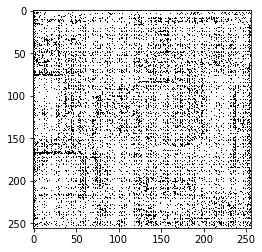

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_09_10.tiff


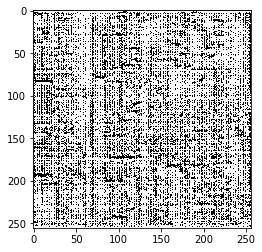

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_06_06.tiff


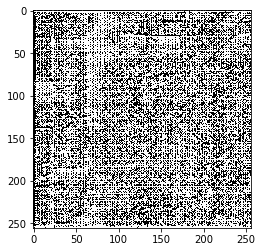

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_16_10.tiff


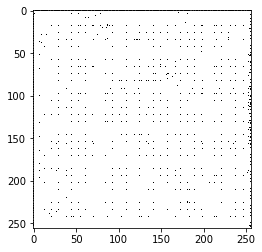

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_15_15.tiff


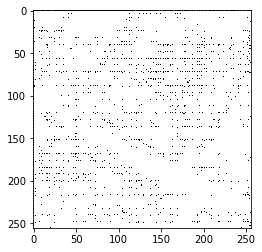

./AerialImageDataset/test/images_split/roof/sfo36_07_11.tiff


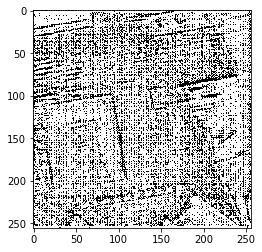

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_13_15.tiff


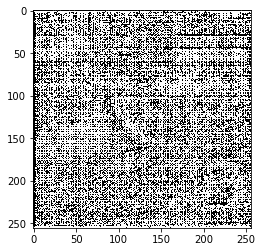

./AerialImageDataset/test/images_split/roof/sfo36_15_16.tiff


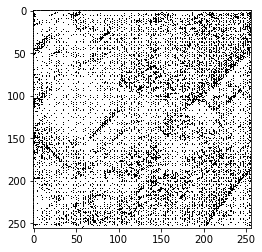

./AerialImageDataset/test/images_split/roof/bellingham11_02_03.tiff


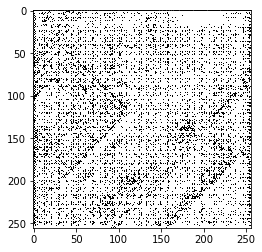

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_18_14.tiff


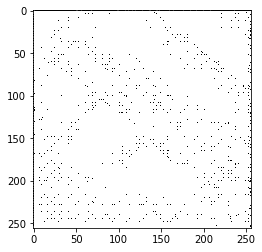

./AerialImageDataset/test/images_split/roof/bellingham11_07_19.tiff


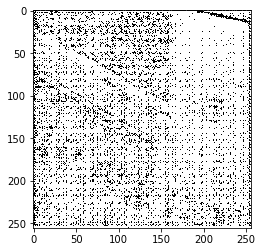

./AerialImageDataset/test/images_split/roof/innsbruck19_06_17.tiff


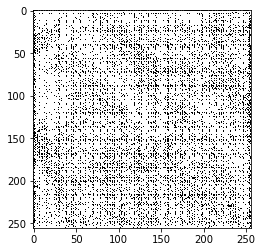

./AerialImageDataset/test/images_split/roof/innsbruck19_05_01.tiff


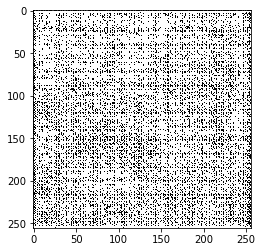

./AerialImageDataset/test/images_split/roof/bellingham11_16_19.tiff


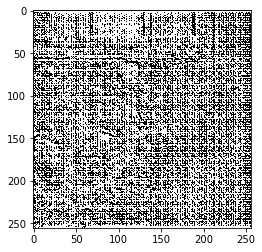

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_19_04.tiff


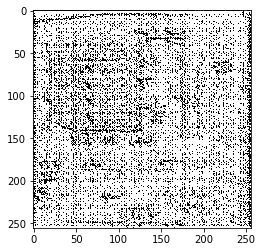

./AerialImageDataset/test/images_split/roof/innsbruck19_14_19.tiff


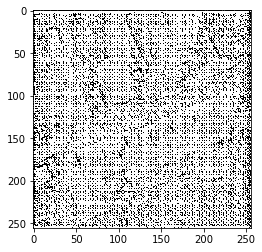

./AerialImageDataset/test/images_split/roof/innsbruck19_14_17.tiff


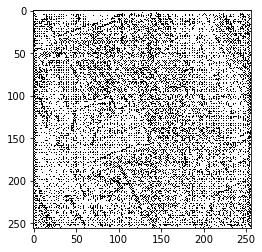

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_15_03.tiff


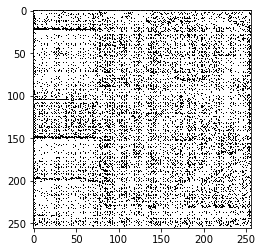

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_07_14.tiff


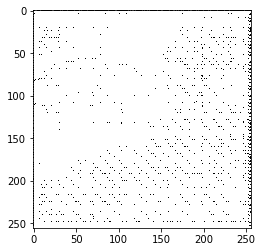

./AerialImageDataset/test/images_split/roof/innsbruck19_06_10.tiff


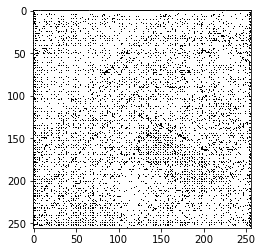

./AerialImageDataset/test/images_split/roof/bellingham11_06_02.tiff


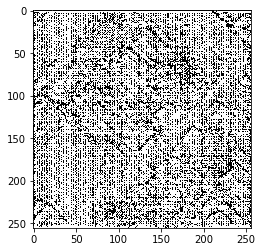

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_19_06.tiff


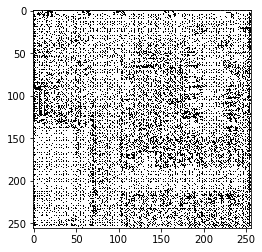

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_16_06.tiff


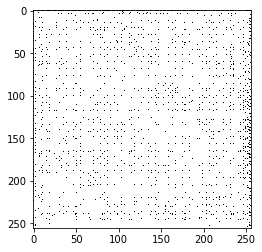

./AerialImageDataset/test/images_split/roof/innsbruck19_14_18.tiff


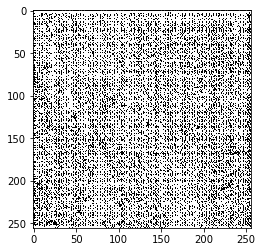

./AerialImageDataset/test/images_split/roof/bellingham11_01_07.tiff


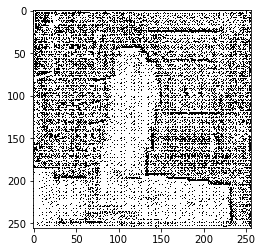

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_19_20.tiff


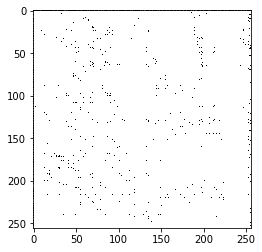

./AerialImageDataset/test/images_split/roof/sfo36_20_02.tiff


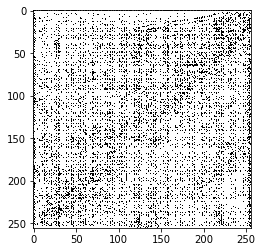

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_14_01.tiff


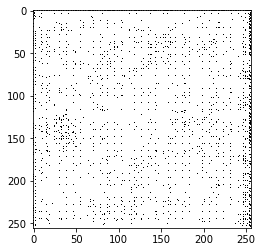

./AerialImageDataset/test/images_split/roof/innsbruck19_11_07.tiff


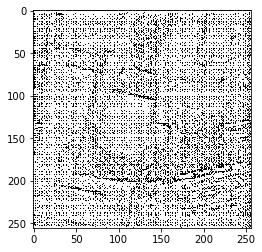

./AerialImageDataset/test/images_split/roof/innsbruck19_15_16.tiff


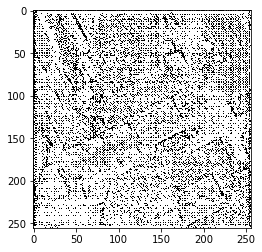

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_03_06.tiff


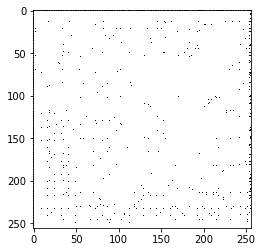

./AerialImageDataset/test/images_split/roof/sfo36_10_17.tiff


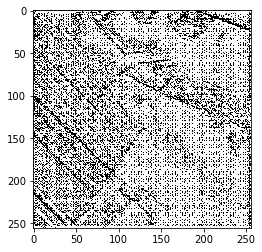

./AerialImageDataset/test/images_split/roof/sfo36_18_18.tiff


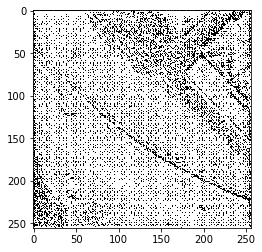

./AerialImageDataset/test/images_split/roof/bellingham11_02_05.tiff


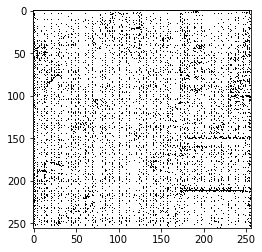

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_04_08.tiff


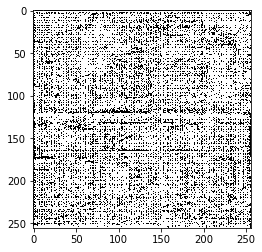

./AerialImageDataset/test/images_split/roof/sfo36_10_07.tiff


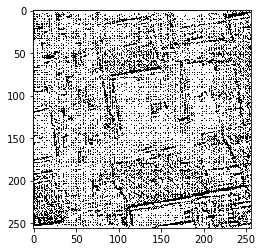

./AerialImageDataset/test/images_split/roof/sfo36_14_17.tiff


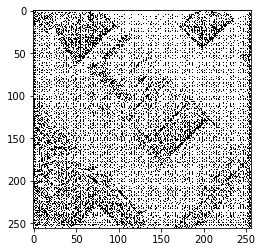

./AerialImageDataset/test/images_split/roof/bellingham11_11_15.tiff


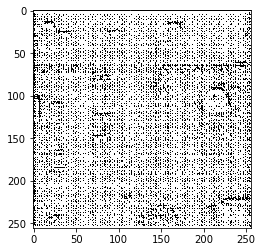

./AerialImageDataset/test/images_split/roof/bellingham11_09_07.tiff


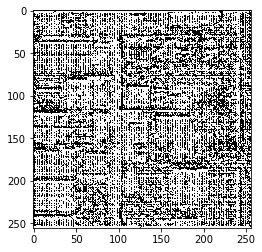

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_05_20.tiff


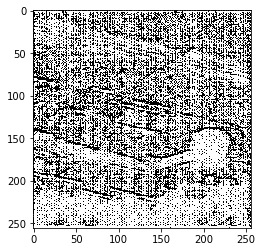

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_09_05.tiff


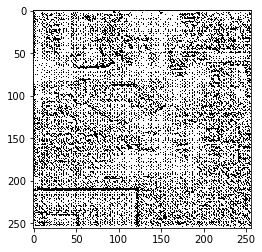

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_01_10.tiff


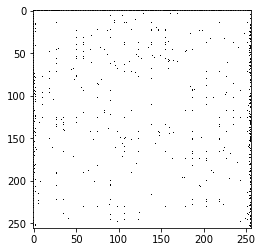

./AerialImageDataset/test/images_split/roof/sfo36_03_18.tiff


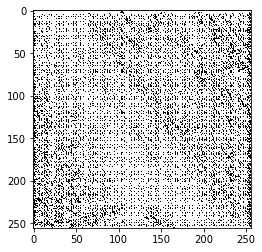

./AerialImageDataset/test/images_split/roof/innsbruck19_03_05.tiff


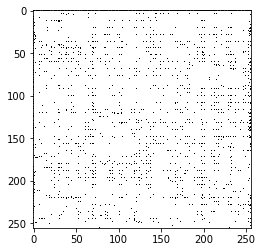

./AerialImageDataset/test/images_split/roof/sfo36_14_08.tiff


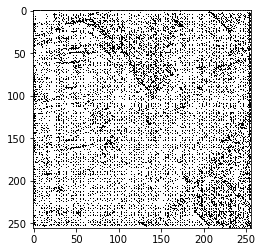

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_19_08.tiff


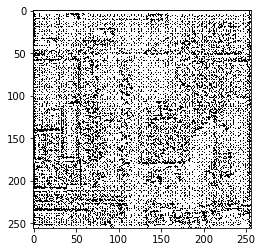

./AerialImageDataset/test/images_split/roof/innsbruck19_02_09.tiff


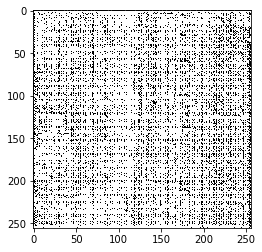

./AerialImageDataset/test/images_split/roof/sfo36_20_15.tiff


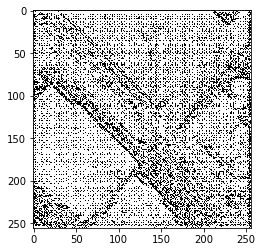

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_15_17.tiff


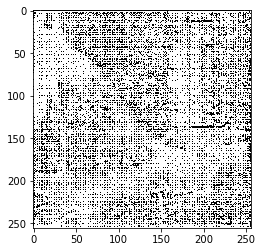

./AerialImageDataset/test/images_split/roof/innsbruck19_10_02.tiff


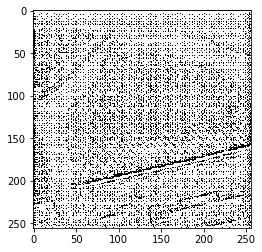

./AerialImageDataset/test/images_split/roof/vityrol-e34enna7_08_13.tiff


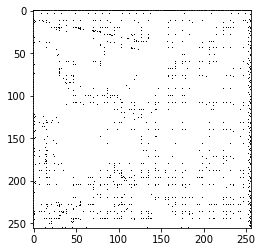

./AerialImageDataset/test/images_split/roof/cbloomington24hicago2_05_10.tiff


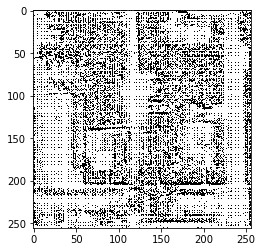

./AerialImageDataset/test/images_split/roof/sfo36_08_10.tiff


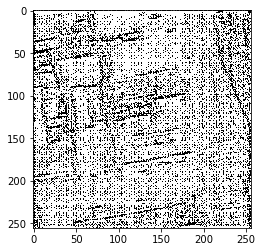

In [17]:
test_path = './AerialImageDataset/test'
test_images = glob.glob(os.path.join(test_path, 'images_split', 'roof') + '/*.tiff')
final_model = build_model('FC-DenseNet56', summary=False)
final_model.load_weights('./checkpoints/cp2-40.hdf5')

i = 1

for test_image in test_images:
  img = cv2.imread(test_image)
  img = cv2.resize(img, (256, 256), interpolation=cv2.INTER_NEAREST)
  
  prediction = final_model.predict(img[np.newaxis,:])
  #Apply threshold
  prediction = prediction > 0.4
  mask = create_mask(prediction)
  mask = mask == 0
  
  print(test_image)
  plt.imshow(np.array(mask).squeeze(axis=2), cmap='binary', interpolation='nearest')
  plt.show()
  
  i+=1

  # Change this value to show more predictions
  if i == 1000:
    break